In [1]:
import os
import random
import time
import json
import numpy as np
import pandas as pd
import torch

SEED = 42

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(SEED)

base_path = "/kaggle/input/datasets/tensura3607/amazon-visa-anomaly"
output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

print("Base path exists:", os.path.exists(base_path))
print("Output dir:", output_dir)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)
print("CUDA available:", torch.cuda.is_available())
print("GPU count:", torch.cuda.device_count())

if torch.cuda.is_available():
    print("GPU name:", torch.cuda.get_device_name(0))

Base path exists: True
Output dir: /kaggle/working/visa_outputs
Device: cuda
CUDA available: True
GPU count: 2
GPU name: Tesla T4


In [2]:
csv_path = f"{base_path}/split_csv/2cls_highshot.csv"

df = pd.read_csv(csv_path)

df["image_path"] = df["image"].apply(lambda x: os.path.join(base_path, x))
df["mask_path"] = df["mask"].apply(lambda x: os.path.join(base_path, x) if pd.notna(x) else None)
df["target"] = df["label"].map({"normal": 0, "anomaly": 1})

print("Total:", len(df))
print(df["split"].value_counts())
print(df["label"].value_counts())
print("Missing images:", (~df["image_path"].apply(os.path.exists)).sum())

train_full_df = df[df["split"] == "train"].copy().reset_index(drop=True)
test_df = df[df["split"] == "test"].copy().reset_index(drop=True)

print("\nTrain full:", train_full_df.shape)
print("Official test:", test_df.shape)

Total: 10821
split
train    6493
test     4328
Name: count, dtype: int64
label
normal     9621
anomaly    1200
Name: count, dtype: int64
Missing images: 0

Train full: (6493, 8)
Official test: (4328, 8)


In [3]:
from sklearn.model_selection import train_test_split

screen_train_df, screen_val_df = train_test_split(
    train_full_df,
    test_size=0.20,
    stratify=train_full_df["target"],
    random_state=SEED
)

screen_train_df = screen_train_df.reset_index(drop=True)
screen_val_df = screen_val_df.reset_index(drop=True)

print("Screen train:", screen_train_df.shape)
print("Screen val:", screen_val_df.shape)

print("\nScreen train distribution:")
print(screen_train_df["label"].value_counts())

print("\nScreen val distribution:")
print(screen_val_df["label"].value_counts())

print("\nOfficial test distribution:")
print(test_df["label"].value_counts())

Screen train: (5194, 8)
Screen val: (1299, 8)

Screen train distribution:
label
normal     4618
anomaly     576
Name: count, dtype: int64

Screen val distribution:
label
normal     1155
anomaly     144
Name: count, dtype: int64

Official test distribution:
label
normal     3848
anomaly     480
Name: count, dtype: int64


In [4]:
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

IMG_SIZE = 224
BATCH_SIZE = 64

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=8),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

class VisaClassificationDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image = Image.open(row["image_path"]).convert("RGB")
        label = int(row["target"])
        obj = row["object"]

        if self.transform:
            image = self.transform(image)

        return image, label, obj

screen_train_dataset = VisaClassificationDataset(screen_train_df, transform=train_transform)
screen_val_dataset = VisaClassificationDataset(screen_val_df, transform=eval_transform)
test_dataset = VisaClassificationDataset(test_df, transform=eval_transform)

screen_train_loader = DataLoader(
    screen_train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

screen_val_loader = DataLoader(
    screen_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

images, labels, objects = next(iter(screen_train_loader))

print("Batch image shape:", images.shape)
print("Batch label shape:", labels.shape)
print("Example labels:", labels[:10].tolist())
print("Example objects:", objects[:5])

Batch image shape: torch.Size([64, 3, 224, 224])
Batch label shape: torch.Size([64])
Example labels: [0, 1, 0, 0, 0, 0, 0, 0, 1, 0]
Example objects: ('pcb4', 'capsules', 'macaroni1', 'pipe_fryum', 'pcb4')


In [5]:
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    confusion_matrix
)

classes = np.array(sorted(screen_train_df["target"].unique()))

class_weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=screen_train_df["target"]
)

class_weights_dict = {int(cls): float(w) for cls, w in zip(classes, class_weights)}

class_weights_tensor = torch.tensor(
    [class_weights_dict[0], class_weights_dict[1]],
    dtype=torch.float
).to(device)

print("Class weights:", class_weights_dict)

def compute_metrics_from_outputs(y_true, y_pred, y_prob):
    metrics = {
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred, zero_division=0),
        "f1": f1_score(y_true, y_pred, zero_division=0),
        "roc_auc": roc_auc_score(y_true, y_prob),
        "pr_auc": average_precision_score(y_true, y_prob)
    }
    return metrics

Class weights: {0: 0.5623646600259853, 1: 4.508680555555555}


In [6]:
import torch.nn as nn
from torchvision import models

def build_model(model_name, num_classes=2, freeze_backbone=True):
    
    if model_name == "resnet18":
        model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        in_features = model.fc.in_features
        model.fc = nn.Linear(in_features, num_classes)
        classifier_params = model.fc.parameters()

    elif model_name == "resnet50":
        model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        in_features = model.fc.in_features
        model.fc = nn.Linear(in_features, num_classes)
        classifier_params = model.fc.parameters()

    elif model_name == "densenet121":
        model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)
        in_features = model.classifier.in_features
        model.classifier = nn.Linear(in_features, num_classes)
        classifier_params = model.classifier.parameters()

    elif model_name == "efficientnet_b0":
        model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
        in_features = model.classifier[1].in_features
        model.classifier[1] = nn.Linear(in_features, num_classes)
        classifier_params = model.classifier.parameters()

    elif model_name == "mobilenet_v3_large":
        model = models.mobilenet_v3_large(weights=models.MobileNet_V3_Large_Weights.IMAGENET1K_V2)
        in_features = model.classifier[3].in_features
        model.classifier[3] = nn.Linear(in_features, num_classes)
        classifier_params = model.classifier.parameters()

    elif model_name == "convnext_tiny":
        model = models.convnext_tiny(weights=models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
        in_features = model.classifier[2].in_features
        model.classifier[2] = nn.Linear(in_features, num_classes)
        classifier_params = model.classifier.parameters()

    else:
        raise ValueError(f"Unknown model name: {model_name}")

    if freeze_backbone:
        for param in model.parameters():
            param.requires_grad = False

        for param in classifier_params:
            param.requires_grad = True

    return model

In [7]:
import torch.optim as optim
from tqdm.auto import tqdm

def train_one_epoch_fast(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0

    scaler = torch.amp.GradScaler("cuda", enabled=torch.cuda.is_available())

    for images, labels, objects in tqdm(loader, desc="Training", leave=False):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)

    return running_loss / len(loader.dataset)


def evaluate_fast(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0

    all_labels = []
    all_preds = []
    all_probs = []
    all_objects = []

    with torch.no_grad():
        for images, labels, objects in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                outputs = model(images)
                loss = criterion(outputs, labels)

            probs = torch.softmax(outputs, dim=1)[:, 1]
            preds = torch.argmax(outputs, dim=1)

            running_loss += loss.item() * images.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_objects.extend(list(objects))

    y_true = np.array(all_labels)
    y_pred = np.array(all_preds)
    y_prob = np.array(all_probs)

    metrics = compute_metrics_from_outputs(y_true, y_pred, y_prob)
    metrics["loss"] = running_loss / len(loader.dataset)

    outputs_df = pd.DataFrame({
        "object": all_objects,
        "true_label": y_true,
        "pred_label": y_pred,
        "prob_anomaly": y_prob
    })

    return metrics, outputs_df

In [8]:
def run_single_screening_model(
    model_name,
    epochs=2,
    freeze_backbone=True,
    lr=1e-4,
    weight_decay=1e-4,
    evaluate_official_test=False
):
    print("\n" + "="*80)
    print(f"Running screening model: {model_name}")
    print("="*80)

    result_file = f"{output_dir}/screening_result_{model_name}.csv"
    history_file = f"{output_dir}/screening_history_{model_name}.csv"
    model_file = f"{output_dir}/screening_best_{model_name}.pth"
    val_pred_file = f"{output_dir}/screening_val_predictions_{model_name}.csv"
    test_pred_file = f"{output_dir}/screening_test_predictions_{model_name}.csv"

    if os.path.exists(result_file):
        print(f"Result already exists for {model_name}. Loading saved result.")
        return pd.read_csv(result_file)

    start_time = time.time()

    model = build_model(
        model_name=model_name,
        num_classes=2,
        freeze_backbone=freeze_backbone
    )

    model = model.to(device)

    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=lr,
        weight_decay=weight_decay
    )

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    best_f1 = -1
    best_epoch = None
    best_val_metrics = None
    best_val_outputs = None
    history = []

    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")

        train_loss = train_one_epoch_fast(
            model=model,
            loader=screen_train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics, val_outputs_df = evaluate_fast(
            model=model,
            loader=screen_val_loader,
            criterion=criterion,
            device=device
        )

        row = {
            "model": model_name,
            "epoch": epoch,
            "train_loss": train_loss,
            **{f"val_{k}": v for k, v in val_metrics.items()}
        }

        history.append(row)

        print(
            f"Train Loss: {train_loss:.4f} | "
            f"Val F1: {val_metrics['f1']:.4f} | "
            f"Val BalAcc: {val_metrics['balanced_accuracy']:.4f} | "
            f"Val ROC-AUC: {val_metrics['roc_auc']:.4f} | "
            f"Val PR-AUC: {val_metrics['pr_auc']:.4f}"
        )

        if val_metrics["f1"] > best_f1:
            best_f1 = val_metrics["f1"]
            best_epoch = epoch
            best_val_metrics = val_metrics.copy()
            best_val_outputs = val_outputs_df.copy()
            torch.save(model.state_dict(), model_file)
            print(f"Best model saved for {model_name}. F1 = {best_f1:.4f}")

    elapsed_time = time.time() - start_time

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_file, index=False)

    best_val_outputs.to_csv(val_pred_file, index=False)

    result = {
        "model": model_name,
        "epochs": epochs,
        "best_epoch": best_epoch,
        "freeze_backbone": freeze_backbone,
        "image_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "lr": lr,
        "weight_decay": weight_decay,
        "trainable_params": trainable_params,
        "total_params": total_params,
        "time_minutes": round(elapsed_time / 60, 2),
        **{f"val_{k}": v for k, v in best_val_metrics.items()}
    }

    if evaluate_official_test:
        print("\nEvaluating best model on official test set...")

        best_model = build_model(
            model_name=model_name,
            num_classes=2,
            freeze_backbone=freeze_backbone
        ).to(device)

        best_model.load_state_dict(torch.load(model_file, map_location=device))

        test_metrics, test_outputs_df = evaluate_fast(
            model=best_model,
            loader=test_loader,
            criterion=criterion,
            device=device
        )

        test_outputs_df.to_csv(test_pred_file, index=False)

        result.update({f"test_{k}": v for k, v in test_metrics.items()})

        del best_model
        torch.cuda.empty_cache()

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)

    del model
    torch.cuda.empty_cache()

    print("\nSaved:")
    print(result_file)
    print(history_file)
    print(model_file)
    print(val_pred_file)

    return result_df

In [9]:
result_efficientnet_b0 = run_single_screening_model(
    model_name="efficientnet_b0",
    epochs=2,
    freeze_backbone=True,
    lr=1e-4,
    weight_decay=1e-4,
    evaluate_official_test=False
)

result_efficientnet_b0


Running screening model: efficientnet_b0
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 61.7MB/s]



Epoch 1/2


Training:   0%|          | 0/82 [00:02<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6963 | Val F1: 0.1939 | Val BalAcc: 0.5393 | Val ROC-AUC: 0.5805 | Val PR-AUC: 0.1450
Best model saved for efficientnet_b0. F1 = 0.1939

Epoch 2/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6759 | Val F1: 0.2260 | Val BalAcc: 0.5663 | Val ROC-AUC: 0.6043 | Val PR-AUC: 0.1593
Best model saved for efficientnet_b0. F1 = 0.2260

Saved:
/kaggle/working/visa_outputs/screening_result_efficientnet_b0.csv
/kaggle/working/visa_outputs/screening_history_efficientnet_b0.csv
/kaggle/working/visa_outputs/screening_best_efficientnet_b0.pth
/kaggle/working/visa_outputs/screening_val_predictions_efficientnet_b0.csv


,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,efficientnet_b0,2,2,True,224,64,0.0001,0.0001,2562,4010110,2.82,0.720554,0.566279,0.163077,0.368056,0.226013,0.604269,0.159326,0.680414


In [10]:
result_resnet50 = run_single_screening_model(
    model_name="resnet50",
    epochs=2,
    freeze_backbone=True,
    lr=1e-4,
    weight_decay=1e-4,
    evaluate_official_test=False
)

result_resnet50


Running screening model: resnet50
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 106MB/s] 



Epoch 1/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6883 | Val F1: 0.2026 | Val BalAcc: 0.5391 | Val ROC-AUC: 0.5818 | Val PR-AUC: 0.1489
Best model saved for resnet50. F1 = 0.2026

Epoch 2/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6675 | Val F1: 0.2204 | Val BalAcc: 0.5611 | Val ROC-AUC: 0.6136 | Val PR-AUC: 0.1743
Best model saved for resnet50. F1 = 0.2204

Saved:
/kaggle/working/visa_outputs/screening_result_resnet50.csv
/kaggle/working/visa_outputs/screening_history_resnet50.csv
/kaggle/working/visa_outputs/screening_best_resnet50.pth
/kaggle/working/visa_outputs/screening_val_predictions_resnet50.csv


,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,resnet50,2,2,True,224,64,0.0001,0.0001,4098,23512130,2.29,0.711316,0.561084,0.15727,0.368056,0.220374,0.613597,0.174318,0.677575


In [11]:
result_densenet121 = run_single_screening_model(
    model_name="densenet121",
    epochs=2,
    freeze_backbone=True,
    lr=1e-4,
    weight_decay=1e-4,
    evaluate_official_test=False
)

result_densenet121


Running screening model: densenet121
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 124MB/s]



Epoch 1/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6926 | Val F1: 0.2376 | Val BalAcc: 0.5767 | Val ROC-AUC: 0.5638 | Val PR-AUC: 0.1748
Best model saved for densenet121. F1 = 0.2376

Epoch 2/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6766 | Val F1: 0.2510 | Val BalAcc: 0.5906 | Val ROC-AUC: 0.5872 | Val PR-AUC: 0.1904
Best model saved for densenet121. F1 = 0.2510

Saved:
/kaggle/working/visa_outputs/screening_result_densenet121.csv
/kaggle/working/visa_outputs/screening_history_densenet121.csv
/kaggle/working/visa_outputs/screening_best_densenet121.pth
/kaggle/working/visa_outputs/screening_val_predictions_densenet121.csv


,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,densenet121,2,2,True,224,64,0.0001,0.0001,2050,6955906,2.29,0.715166,0.590602,0.177143,0.430556,0.251012,0.58722,0.190432,0.692179


In [12]:
result_mobilenet = run_single_screening_model(
    model_name="mobilenet_v3_large",
    epochs=2,
    freeze_backbone=True,
    lr=1e-4,
    weight_decay=1e-4,
    evaluate_official_test=False
)

result_mobilenet


Running screening model: mobilenet_v3_large
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth


100%|██████████| 21.1M/21.1M [00:00<00:00, 66.9MB/s]


Epoch 1/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6700 | Val F1: 0.2124 | Val BalAcc: 0.5529 | Val ROC-AUC: 0.6195 | Val PR-AUC: 0.1751
Best model saved for mobilenet_v3_large. F1 = 0.2124

Epoch 2/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6145 | Val F1: 0.2814 | Val BalAcc: 0.6402 | Val ROC-AUC: 0.6816 | Val PR-AUC: 0.2484
Best model saved for mobilenet_v3_large. F1 = 0.2814

Saved:
/kaggle/working/visa_outputs/screening_result_mobilenet_v3_large.csv
/kaggle/working/visa_outputs/screening_history_mobilenet_v3_large.csv
/kaggle/working/visa_outputs/screening_best_mobilenet_v3_large.pth
/kaggle/working/visa_outputs/screening_val_predictions_mobilenet_v3_large.csv


,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,mobilenet_v3_large,2,2,True,224,64,0.0001,0.0001,1232642,4204594,2.21,0.630485,0.640242,0.179389,0.652778,0.281437,0.681602,0.24837,0.643225


In [13]:
result_convnext = run_single_screening_model(
    model_name="convnext_tiny",
    epochs=2,
    freeze_backbone=True,
    lr=1e-4,
    weight_decay=1e-4,
    evaluate_official_test=False
)

result_convnext


Running screening model: convnext_tiny
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 186MB/s] 



Epoch 1/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.7062 | Val F1: 0.1847 | Val BalAcc: 0.5255 | Val ROC-AUC: 0.5189 | Val PR-AUC: 0.1204
Best model saved for convnext_tiny. F1 = 0.1847

Epoch 2/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6746 | Val F1: 0.1980 | Val BalAcc: 0.5394 | Val ROC-AUC: 0.5617 | Val PR-AUC: 0.1317
Best model saved for convnext_tiny. F1 = 0.1980

Saved:
/kaggle/working/visa_outputs/screening_result_convnext_tiny.csv
/kaggle/working/visa_outputs/screening_history_convnext_tiny.csv
/kaggle/working/visa_outputs/screening_best_convnext_tiny.pth
/kaggle/working/visa_outputs/screening_val_predictions_convnext_tiny.csv


,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,convnext_tiny,2,2,True,224,64,0.0001,0.0001,3074,27821666,2.46,0.69438,0.539403,0.139601,0.340278,0.19798,0.561679,0.131677,0.695203


In [14]:
result_resnet18 = run_single_screening_model(
    model_name="resnet18",
    epochs=2,
    freeze_backbone=True,
    lr=1e-4,
    weight_decay=1e-4,
    evaluate_official_test=False
)

result_resnet18


Running screening model: resnet18
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 144MB/s]


Epoch 1/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.7161 | Val F1: 0.1982 | Val BalAcc: 0.5267 | Val ROC-AUC: 0.5226 | Val PR-AUC: 0.1214
Best model saved for resnet18. F1 = 0.1982

Epoch 2/2


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6875 | Val F1: 0.2164 | Val BalAcc: 0.5532 | Val ROC-AUC: 0.5501 | Val PR-AUC: 0.1457
Best model saved for resnet18. F1 = 0.2164

Saved:
/kaggle/working/visa_outputs/screening_result_resnet18.csv
/kaggle/working/visa_outputs/screening_history_resnet18.csv
/kaggle/working/visa_outputs/screening_best_resnet18.pth
/kaggle/working/visa_outputs/screening_val_predictions_resnet18.csv


,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,resnet18,2,2,True,224,64,0.0001,0.0001,1026,11177538,2.18,0.470362,0.553238,0.129428,0.659722,0.216401,0.550102,0.145711,0.703205


In [15]:
import glob

result_files = sorted(glob.glob(f"{output_dir}/screening_result_*.csv"))

all_results = []

for file in result_files:
    temp = pd.read_csv(file)
    all_results.append(temp)

if len(all_results) > 0:
    screening_results_df = pd.concat(all_results, ignore_index=True)
    screening_results_df = screening_results_df.sort_values("val_f1", ascending=False)
    screening_results_df.to_csv(f"{output_dir}/table_screening_results_combined.csv", index=False)
    display(screening_results_df)
else:
    print("No screening results found yet.")

,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
3,mobilenet_v3_large,2,2,True,224,64,0.0001,0.0001,1232642,4204594,2.21,0.630485,0.640242,0.179389,0.652778,0.281437,0.681602,0.248370,0.643225
1,densenet121,2,2,True,224,64,0.0001,0.0001,2050,6955906,2.29,0.715166,0.590602,0.177143,0.430556,0.251012,0.587220,0.190432,0.692179
2,efficientnet_b0,2,2,True,224,64,0.0001,0.0001,2562,4010110,2.82,0.720554,0.566279,0.163077,0.368056,0.226013,0.604269,0.159326,0.680414
5,resnet50,2,2,True,224,64,0.0001,0.0001,4098,23512130,2.29,0.711316,0.561084,0.157270,0.368056,0.220374,0.613597,0.174318,0.677575
4,resnet18,2,2,True,224,64,0.0001,0.0001,1026,11177538,2.18,0.470362,0.553238,0.129428,0.659722,0.216401,0.550102,0.145711,0.703205
0,convnext_tiny,2,2,True,224,64,0.0001,0.0001,3074,27821666,2.46,0.694380,0.539403,0.139601,0.340278,0.197980,0.561679,0.131677,0.695203


In [16]:
import glob
import pandas as pd
import os

output_dir = "/kaggle/working/visa_outputs"

result_files = sorted(glob.glob(f"{output_dir}/screening_result_*.csv"))

print("Found result files:", len(result_files))
for f in result_files:
    print(os.path.basename(f))

all_results = [pd.read_csv(f) for f in result_files]

screening_results_df = pd.concat(all_results, ignore_index=True)
screening_results_df = screening_results_df.sort_values("val_f1", ascending=False)

screening_results_df.to_csv(
    f"{output_dir}/table_screening_results_combined.csv",
    index=False
)

screening_results_df

Found result files: 6
screening_result_convnext_tiny.csv
screening_result_densenet121.csv
screening_result_efficientnet_b0.csv
screening_result_mobilenet_v3_large.csv
screening_result_resnet18.csv
screening_result_resnet50.csv


,model,epochs,best_epoch,freeze_backbone,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
3,mobilenet_v3_large,2,2,True,224,64,0.0001,0.0001,1232642,4204594,2.21,0.630485,0.640242,0.179389,0.652778,0.281437,0.681602,0.248370,0.643225
1,densenet121,2,2,True,224,64,0.0001,0.0001,2050,6955906,2.29,0.715166,0.590602,0.177143,0.430556,0.251012,0.587220,0.190432,0.692179
2,efficientnet_b0,2,2,True,224,64,0.0001,0.0001,2562,4010110,2.82,0.720554,0.566279,0.163077,0.368056,0.226013,0.604269,0.159326,0.680414
5,resnet50,2,2,True,224,64,0.0001,0.0001,4098,23512130,2.29,0.711316,0.561084,0.157270,0.368056,0.220374,0.613597,0.174318,0.677575
4,resnet18,2,2,True,224,64,0.0001,0.0001,1026,11177538,2.18,0.470362,0.553238,0.129428,0.659722,0.216401,0.550102,0.145711,0.703205
0,convnext_tiny,2,2,True,224,64,0.0001,0.0001,3074,27821666,2.46,0.694380,0.539403,0.139601,0.340278,0.197980,0.561679,0.131677,0.695203


In [17]:
screening_paper_table = screening_results_df[
    [
        "model",
        "val_accuracy",
        "val_balanced_accuracy",
        "val_precision",
        "val_recall",
        "val_f1",
        "val_roc_auc",
        "val_pr_auc",
        "trainable_params",
        "total_params",
        "time_minutes"
    ]
].copy()

screening_paper_table.columns = [
    "Model",
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC",
    "Trainable Parameters",
    "Total Parameters",
    "Time (min)"
]

metric_cols = [
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC"
]

screening_paper_table[metric_cols] = screening_paper_table[metric_cols].round(4)

screening_paper_table.to_csv(
    f"{output_dir}/table_2_frozen_backbone_screening_paper.csv",
    index=False
)

screening_paper_table

,Model,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC,Trainable Parameters,Total Parameters,Time (min)
3,mobilenet_v3_large,0.6305,0.6402,0.1794,0.6528,0.2814,0.6816,0.2484,1232642,4204594,2.21
1,densenet121,0.7152,0.5906,0.1771,0.4306,0.2510,0.5872,0.1904,2050,6955906,2.29
2,efficientnet_b0,0.7206,0.5663,0.1631,0.3681,0.2260,0.6043,0.1593,2562,4010110,2.82
5,resnet50,0.7113,0.5611,0.1573,0.3681,0.2204,0.6136,0.1743,4098,23512130,2.29
4,resnet18,0.4704,0.5532,0.1294,0.6597,0.2164,0.5501,0.1457,1026,11177538,2.18
0,convnext_tiny,0.6944,0.5394,0.1396,0.3403,0.1980,0.5617,0.1317,3074,27821666,2.46


In [18]:
def run_single_finetuning_model(
    model_name,
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4
):
    print("\n" + "="*80)
    print(f"Running full fine-tuning model: {model_name}")
    print("="*80)

    result_file = f"{output_dir}/finetune_result_{model_name}.csv"
    history_file = f"{output_dir}/finetune_history_{model_name}.csv"
    model_file = f"{output_dir}/finetune_best_{model_name}.pth"
    val_pred_file = f"{output_dir}/finetune_val_predictions_{model_name}.csv"

    if os.path.exists(result_file):
        print(f"Fine-tuning result already exists for {model_name}. Loading saved result.")
        return pd.read_csv(result_file)

    start_time = time.time()

    model = build_model(
        model_name=model_name,
        num_classes=2,
        freeze_backbone=False
    )

    model = model.to(device)

    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=epochs
    )

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    best_f1 = -1
    best_epoch = None
    best_val_metrics = None
    best_val_outputs = None
    history = []

    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")

        train_loss = train_one_epoch_fast(
            model=model,
            loader=screen_train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics, val_outputs_df = evaluate_fast(
            model=model,
            loader=screen_val_loader,
            criterion=criterion,
            device=device
        )

        scheduler.step()

        row = {
            "model": model_name,
            "epoch": epoch,
            "train_loss": train_loss,
            **{f"val_{k}": v for k, v in val_metrics.items()}
        }

        history.append(row)

        print(
            f"Train Loss: {train_loss:.4f} | "
            f"Val Acc: {val_metrics['accuracy']:.4f} | "
            f"Val BalAcc: {val_metrics['balanced_accuracy']:.4f} | "
            f"Val Precision: {val_metrics['precision']:.4f} | "
            f"Val Recall: {val_metrics['recall']:.4f} | "
            f"Val F1: {val_metrics['f1']:.4f} | "
            f"Val ROC-AUC: {val_metrics['roc_auc']:.4f} | "
            f"Val PR-AUC: {val_metrics['pr_auc']:.4f}"
        )

        if val_metrics["f1"] > best_f1:
            best_f1 = val_metrics["f1"]
            best_epoch = epoch
            best_val_metrics = val_metrics.copy()
            best_val_outputs = val_outputs_df.copy()
            torch.save(model.state_dict(), model_file)
            print(f"Best fine-tuned model saved for {model_name}. F1 = {best_f1:.4f}")

    elapsed_time = time.time() - start_time

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_file, index=False)

    best_val_outputs.to_csv(val_pred_file, index=False)

    result = {
        "model": model_name,
        "epochs": epochs,
        "best_epoch": best_epoch,
        "fine_tuning": True,
        "image_size": IMG_SIZE,
        "batch_size": BATCH_SIZE,
        "lr": lr,
        "weight_decay": weight_decay,
        "trainable_params": trainable_params,
        "total_params": total_params,
        "time_minutes": round(elapsed_time / 60, 2),
        **{f"val_{k}": v for k, v in best_val_metrics.items()}
    }

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)

    del model
    torch.cuda.empty_cache()

    print("\nSaved:")
    print(result_file)
    print(history_file)
    print(model_file)
    print(val_pred_file)

    return result_df

In [19]:
finetune_mobilenet = run_single_finetuning_model(
    model_name="mobilenet_v3_large",
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4
)

finetune_mobilenet


Running full fine-tuning model: mobilenet_v3_large

Epoch 1/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6579 | Val Acc: 0.7005 | Val BalAcc: 0.6158 | Val Precision: 0.1867 | Val Recall: 0.5069 | Val F1: 0.2729 | Val ROC-AUC: 0.6533 | Val PR-AUC: 0.2314
Best fine-tuned model saved for mobilenet_v3_large. F1 = 0.2729

Epoch 2/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.5784 | Val Acc: 0.6890 | Val BalAcc: 0.6458 | Val Precision: 0.1977 | Val Recall: 0.5903 | Val F1: 0.2962 | Val ROC-AUC: 0.7576 | Val PR-AUC: 0.3144
Best fine-tuned model saved for mobilenet_v3_large. F1 = 0.2962

Epoch 3/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.5122 | Val Acc: 0.8122 | Val BalAcc: 0.7181 | Val Precision: 0.3162 | Val Recall: 0.5972 | Val F1: 0.4135 | Val ROC-AUC: 0.8274 | Val PR-AUC: 0.4316
Best fine-tuned model saved for mobilenet_v3_large. F1 = 0.4135

Epoch 4/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.4592 | Val Acc: 0.8237 | Val BalAcc: 0.7428 | Val Precision: 0.3420 | Val Recall: 0.6389 | Val F1: 0.4455 | Val ROC-AUC: 0.8550 | Val PR-AUC: 0.5544
Best fine-tuned model saved for mobilenet_v3_large. F1 = 0.4455

Epoch 5/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.4242 | Val Acc: 0.8353 | Val BalAcc: 0.7676 | Val Precision: 0.3684 | Val Recall: 0.6806 | Val F1: 0.4780 | Val ROC-AUC: 0.8686 | Val PR-AUC: 0.5732
Best fine-tuned model saved for mobilenet_v3_large. F1 = 0.4780

Saved:
/kaggle/working/visa_outputs/finetune_result_mobilenet_v3_large.csv
/kaggle/working/visa_outputs/finetune_history_mobilenet_v3_large.csv
/kaggle/working/visa_outputs/finetune_best_mobilenet_v3_large.pth
/kaggle/working/visa_outputs/finetune_val_predictions_mobilenet_v3_large.csv


,model,epochs,best_epoch,fine_tuning,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,mobilenet_v3_large,5,5,True,224,64,0.00003,0.0001,4204594,4204594,5.52,0.835258,0.767551,0.368421,0.680556,0.478049,0.868609,0.573229,0.480002


In [20]:
finetune_efficientnet = run_single_finetuning_model(
    model_name="efficientnet_b0",
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4
)

finetune_efficientnet


Running full fine-tuning model: efficientnet_b0

Epoch 1/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6599 | Val Acc: 0.6805 | Val BalAcc: 0.6228 | Val Precision: 0.1841 | Val Recall: 0.5486 | Val F1: 0.2757 | Val ROC-AUC: 0.6759 | Val PR-AUC: 0.2461
Best fine-tuned model saved for efficientnet_b0. F1 = 0.2757

Epoch 2/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.5983 | Val Acc: 0.7844 | Val BalAcc: 0.6782 | Val Precision: 0.2671 | Val Recall: 0.5417 | Val F1: 0.3578 | Val ROC-AUC: 0.7773 | Val PR-AUC: 0.3455
Best fine-tuned model saved for efficientnet_b0. F1 = 0.3578

Epoch 3/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.5629 | Val Acc: 0.8260 | Val BalAcc: 0.7198 | Val Precision: 0.3360 | Val Recall: 0.5833 | Val F1: 0.4264 | Val ROC-AUC: 0.8321 | Val PR-AUC: 0.4317
Best fine-tuned model saved for efficientnet_b0. F1 = 0.4264

Epoch 4/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.5195 | Val Acc: 0.8329 | Val BalAcc: 0.7176 | Val Precision: 0.3460 | Val Recall: 0.5694 | Val F1: 0.4304 | Val ROC-AUC: 0.8530 | Val PR-AUC: 0.5041
Best fine-tuned model saved for efficientnet_b0. F1 = 0.4304

Epoch 5/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.4997 | Val Acc: 0.8299 | Val BalAcc: 0.7402 | Val Precision: 0.3502 | Val Recall: 0.6250 | Val F1: 0.4489 | Val ROC-AUC: 0.8582 | Val PR-AUC: 0.5104
Best fine-tuned model saved for efficientnet_b0. F1 = 0.4489

Saved:
/kaggle/working/visa_outputs/finetune_result_efficientnet_b0.csv
/kaggle/working/visa_outputs/finetune_history_efficientnet_b0.csv
/kaggle/working/visa_outputs/finetune_best_efficientnet_b0.pth
/kaggle/working/visa_outputs/finetune_val_predictions_efficientnet_b0.csv


,model,epochs,best_epoch,fine_tuning,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,efficientnet_b0,5,5,True,224,64,0.00003,0.0001,4010110,4010110,5.52,0.829869,0.740206,0.350195,0.625,0.448878,0.858204,0.510368,0.509928


In [21]:
finetune_densenet = run_single_finetuning_model(
    model_name="densenet121",
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4
)

finetune_densenet


Running full fine-tuning model: densenet121

Epoch 1/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6287 | Val Acc: 0.7898 | Val BalAcc: 0.6995 | Val Precision: 0.2828 | Val Recall: 0.5833 | Val F1: 0.3810 | Val ROC-AUC: 0.7500 | Val PR-AUC: 0.3572
Best fine-tuned model saved for densenet121. F1 = 0.3810

Epoch 2/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.4656 | Val Acc: 0.8222 | Val BalAcc: 0.7237 | Val Precision: 0.3320 | Val Recall: 0.5972 | Val F1: 0.4268 | Val ROC-AUC: 0.8112 | Val PR-AUC: 0.4700
Best fine-tuned model saved for densenet121. F1 = 0.4268

Epoch 3/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.3788 | Val Acc: 0.8891 | Val BalAcc: 0.7827 | Val Precision: 0.5000 | Val Recall: 0.6458 | Val F1: 0.5636 | Val ROC-AUC: 0.8863 | Val PR-AUC: 0.6185
Best fine-tuned model saved for densenet121. F1 = 0.5636

Epoch 4/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.3306 | Val Acc: 0.8930 | Val BalAcc: 0.7909 | Val Precision: 0.5135 | Val Recall: 0.6597 | Val F1: 0.5775 | Val ROC-AUC: 0.8974 | Val PR-AUC: 0.6345
Best fine-tuned model saved for densenet121. F1 = 0.5775

Epoch 5/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.2873 | Val Acc: 0.8961 | Val BalAcc: 0.8048 | Val Precision: 0.5238 | Val Recall: 0.6875 | Val F1: 0.5946 | Val ROC-AUC: 0.9064 | Val PR-AUC: 0.6649
Best fine-tuned model saved for densenet121. F1 = 0.5946

Saved:
/kaggle/working/visa_outputs/finetune_result_densenet121.csv
/kaggle/working/visa_outputs/finetune_history_densenet121.csv
/kaggle/working/visa_outputs/finetune_best_densenet121.pth
/kaggle/working/visa_outputs/finetune_val_predictions_densenet121.csv


,model,epochs,best_epoch,fine_tuning,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,densenet121,5,5,True,224,64,0.00003,0.0001,6955906,6955906,5.71,0.896074,0.804789,0.52381,0.6875,0.594595,0.906445,0.664912,0.416149


In [22]:
finetune_convnext = run_single_finetuning_model(
    model_name="convnext_tiny",
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4
)

finetune_convnext


Running full fine-tuning model: convnext_tiny

Epoch 1/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6226 | Val Acc: 0.8245 | Val BalAcc: 0.6733 | Val Precision: 0.3108 | Val Recall: 0.4792 | Val F1: 0.3770 | Val ROC-AUC: 0.7815 | Val PR-AUC: 0.3626
Best fine-tuned model saved for convnext_tiny. F1 = 0.3770

Epoch 2/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.4960 | Val Acc: 0.8406 | Val BalAcc: 0.7645 | Val Precision: 0.3765 | Val Recall: 0.6667 | Val F1: 0.4812 | Val ROC-AUC: 0.8720 | Val PR-AUC: 0.5258
Best fine-tuned model saved for convnext_tiny. F1 = 0.4812

Epoch 3/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.3829 | Val Acc: 0.8737 | Val BalAcc: 0.8074 | Val Precision: 0.4561 | Val Recall: 0.7222 | Val F1: 0.5591 | Val ROC-AUC: 0.9043 | Val PR-AUC: 0.6267
Best fine-tuned model saved for convnext_tiny. F1 = 0.5591

Epoch 4/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.3102 | Val Acc: 0.9184 | Val BalAcc: 0.8265 | Val Precision: 0.6145 | Val Recall: 0.7083 | Val F1: 0.6581 | Val ROC-AUC: 0.9287 | Val PR-AUC: 0.6873
Best fine-tuned model saved for convnext_tiny. F1 = 0.6581

Epoch 5/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.2861 | Val Acc: 0.9084 | Val BalAcc: 0.8330 | Val Precision: 0.5668 | Val Recall: 0.7361 | Val F1: 0.6405 | Val ROC-AUC: 0.9317 | Val PR-AUC: 0.6894

Saved:
/kaggle/working/visa_outputs/finetune_result_convnext_tiny.csv
/kaggle/working/visa_outputs/finetune_history_convnext_tiny.csv
/kaggle/working/visa_outputs/finetune_best_convnext_tiny.pth
/kaggle/working/visa_outputs/finetune_val_predictions_convnext_tiny.csv


,model,epochs,best_epoch,fine_tuning,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,convnext_tiny,5,4,True,224,64,0.00003,0.0001,27821666,27821666,5.9,0.918399,0.826461,0.614458,0.708333,0.658065,0.928734,0.687293,0.389141


In [23]:
finetune_resnet18 = run_single_finetuning_model(
    model_name="resnet18",
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4
)

finetune_resnet18


Running full fine-tuning model: resnet18

Epoch 1/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.6194 | Val Acc: 0.7683 | Val BalAcc: 0.6965 | Val Precision: 0.2628 | Val Recall: 0.6042 | Val F1: 0.3663 | Val ROC-AUC: 0.7663 | Val PR-AUC: 0.3203
Best fine-tuned model saved for resnet18. F1 = 0.3663

Epoch 2/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.4496 | Val Acc: 0.8968 | Val BalAcc: 0.7718 | Val Precision: 0.5301 | Val Recall: 0.6111 | Val F1: 0.5677 | Val ROC-AUC: 0.8888 | Val PR-AUC: 0.5723
Best fine-tuned model saved for resnet18. F1 = 0.5677

Epoch 3/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.3585 | Val Acc: 0.8776 | Val BalAcc: 0.7762 | Val Precision: 0.4627 | Val Recall: 0.6458 | Val F1: 0.5391 | Val ROC-AUC: 0.8899 | Val PR-AUC: 0.6008

Epoch 4/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.3030 | Val Acc: 0.8722 | Val BalAcc: 0.7914 | Val Precision: 0.4500 | Val Recall: 0.6875 | Val F1: 0.5440 | Val ROC-AUC: 0.8931 | Val PR-AUC: 0.6583

Epoch 5/5


Training:   0%|          | 0/82 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

Train Loss: 0.2695 | Val Acc: 0.9061 | Val BalAcc: 0.8378 | Val Precision: 0.5567 | Val Recall: 0.7500 | Val F1: 0.6391 | Val ROC-AUC: 0.9230 | Val PR-AUC: 0.7124
Best fine-tuned model saved for resnet18. F1 = 0.6391

Saved:
/kaggle/working/visa_outputs/finetune_result_resnet18.csv
/kaggle/working/visa_outputs/finetune_history_resnet18.csv
/kaggle/working/visa_outputs/finetune_best_resnet18.pth
/kaggle/working/visa_outputs/finetune_val_predictions_resnet18.csv


,model,epochs,best_epoch,fine_tuning,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,resnet18,5,5,True,224,64,0.00003,0.0001,11177538,11177538,5.28,0.906082,0.837771,0.556701,0.75,0.639053,0.923049,0.712363,0.384564


In [24]:
import glob
import pandas as pd
import os

finetune_files = sorted(glob.glob(f"{output_dir}/finetune_result_*.csv"))

print("Found fine-tuning result files:", len(finetune_files))
for f in finetune_files:
    print(os.path.basename(f))

finetune_results = [pd.read_csv(f) for f in finetune_files]

finetune_results_df = pd.concat(finetune_results, ignore_index=True)
finetune_results_df = finetune_results_df.sort_values("val_f1", ascending=False)

finetune_results_df.to_csv(
    f"{output_dir}/table_finetuning_results_combined.csv",
    index=False
)

finetune_results_df

Found fine-tuning result files: 5
finetune_result_convnext_tiny.csv
finetune_result_densenet121.csv
finetune_result_efficientnet_b0.csv
finetune_result_mobilenet_v3_large.csv
finetune_result_resnet18.csv


,model,epochs,best_epoch,fine_tuning,image_size,batch_size,lr,weight_decay,trainable_params,total_params,time_minutes,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_loss
0,convnext_tiny,5,4,True,224,64,0.00003,0.0001,27821666,27821666,5.90,0.918399,0.826461,0.614458,0.708333,0.658065,0.928734,0.687293,0.389141
4,resnet18,5,5,True,224,64,0.00003,0.0001,11177538,11177538,5.28,0.906082,0.837771,0.556701,0.750000,0.639053,0.923049,0.712363,0.384564
1,densenet121,5,5,True,224,64,0.00003,0.0001,6955906,6955906,5.71,0.896074,0.804789,0.523810,0.687500,0.594595,0.906445,0.664912,0.416149
3,mobilenet_v3_large,5,5,True,224,64,0.00003,0.0001,4204594,4204594,5.52,0.835258,0.767551,0.368421,0.680556,0.478049,0.868609,0.573229,0.480002
2,efficientnet_b0,5,5,True,224,64,0.00003,0.0001,4010110,4010110,5.52,0.829869,0.740206,0.350195,0.625000,0.448878,0.858204,0.510368,0.509928


In [25]:
finetune_paper_table = finetune_results_df[
    [
        "model",
        "best_epoch",
        "val_accuracy",
        "val_balanced_accuracy",
        "val_precision",
        "val_recall",
        "val_f1",
        "val_roc_auc",
        "val_pr_auc",
        "trainable_params",
        "total_params",
        "time_minutes"
    ]
].copy()

finetune_paper_table.columns = [
    "Model",
    "Best epoch",
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC",
    "Trainable Parameters",
    "Total Parameters",
    "Time (min)"
]

metric_cols = [
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC"
]

finetune_paper_table[metric_cols] = finetune_paper_table[metric_cols].round(4)

finetune_paper_table.to_csv(
    f"{output_dir}/table_3_finetuning_results_paper.csv",
    index=False
)

finetune_paper_table

,Model,Best epoch,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC,Trainable Parameters,Total Parameters,Time (min)
0,convnext_tiny,4,0.9184,0.8265,0.6145,0.7083,0.6581,0.9287,0.6873,27821666,27821666,5.90
4,resnet18,5,0.9061,0.8378,0.5567,0.7500,0.6391,0.9230,0.7124,11177538,11177538,5.28
1,densenet121,5,0.8961,0.8048,0.5238,0.6875,0.5946,0.9064,0.6649,6955906,6955906,5.71
3,mobilenet_v3_large,5,0.8353,0.7676,0.3684,0.6806,0.4780,0.8686,0.5732,4204594,4204594,5.52
2,efficientnet_b0,5,0.8299,0.7402,0.3502,0.6250,0.4489,0.8582,0.5104,4010110,4010110,5.52


In [26]:
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.transforms.functional as TF
import numpy as np
import os

SEG_IMG_SIZE = 224
SEG_BATCH_SIZE = 32

class VisaMultiTaskDataset(Dataset):
    def __init__(self, dataframe, img_size=224, train=True):
        self.dataframe = dataframe.reset_index(drop=True)
        self.img_size = img_size
        self.train = train
        
        self.image_normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        
        image = Image.open(row["image_path"]).convert("RGB")
        label = int(row["target"])
        obj = row["object"]

        if pd.notna(row["mask_path"]) and row["mask_path"] is not None:
            mask = Image.open(row["mask_path"]).convert("L")
        else:
            mask = Image.new("L", image.size, 0)

        image = TF.resize(image, (self.img_size, self.img_size))
        mask = TF.resize(mask, (self.img_size, self.img_size), interpolation=TF.InterpolationMode.NEAREST)

        if self.train:
            if random.random() < 0.5:
                image = TF.hflip(image)
                mask = TF.hflip(mask)

            if random.random() < 0.3:
                angle = random.uniform(-8, 8)
                image = TF.rotate(image, angle)
                mask = TF.rotate(mask, angle, interpolation=TF.InterpolationMode.NEAREST)

        image = TF.to_tensor(image)
        image = self.image_normalize(image)

        mask = TF.to_tensor(mask)
        mask = (mask > 0).float()

        return image, torch.tensor(label, dtype=torch.long), mask, obj

In [27]:
seg_train_dataset = VisaMultiTaskDataset(
    screen_train_df,
    img_size=SEG_IMG_SIZE,
    train=True
)

seg_val_dataset = VisaMultiTaskDataset(
    screen_val_df,
    img_size=SEG_IMG_SIZE,
    train=False
)

seg_test_dataset = VisaMultiTaskDataset(
    test_df,
    img_size=SEG_IMG_SIZE,
    train=False
)

seg_train_loader = DataLoader(
    seg_train_dataset,
    batch_size=SEG_BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

seg_val_loader = DataLoader(
    seg_val_dataset,
    batch_size=SEG_BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

seg_test_loader = DataLoader(
    seg_test_dataset,
    batch_size=SEG_BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

batch = next(iter(seg_train_loader))
images_mt, labels_mt, masks_mt, objects_mt = batch

print("Images:", images_mt.shape)
print("Labels:", labels_mt.shape)
print("Masks :", masks_mt.shape)
print("Objects example:", objects_mt[:5])
print("Labels example:", labels_mt[:10].tolist())
print("Mask min/max:", masks_mt.min().item(), masks_mt.max().item())
print("Number of masks with positive pixels in batch:", (masks_mt.view(masks_mt.size(0), -1).sum(dim=1) > 0).sum().item())

Images: torch.Size([32, 3, 224, 224])
Labels: torch.Size([32])
Masks : torch.Size([32, 1, 224, 224])
Objects example: ('macaroni1', 'pcb2', 'fryum', 'chewinggum', 'pcb2')
Labels example: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Mask min/max: 0.0 1.0
Number of masks with positive pixels in batch: 2


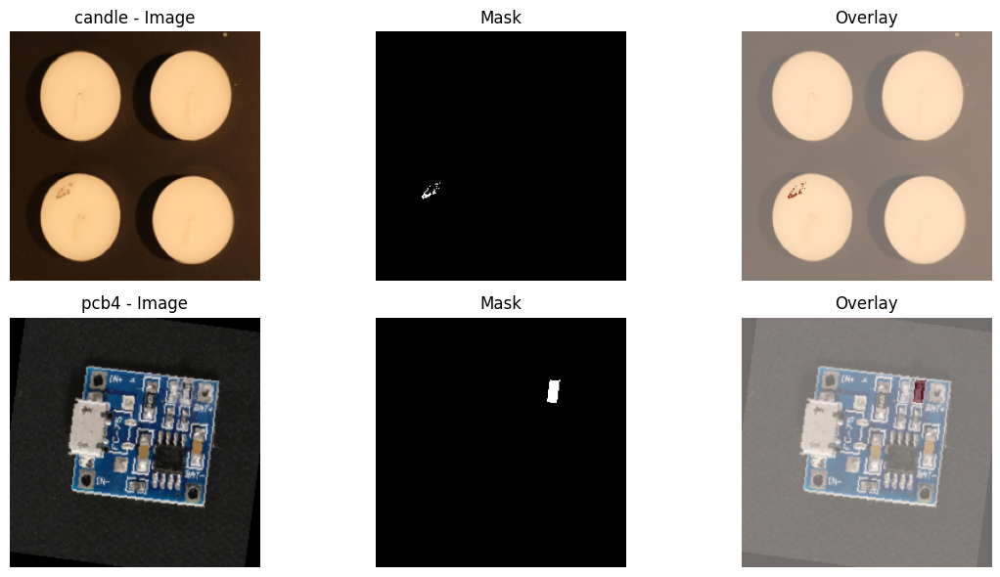

In [28]:
import matplotlib.pyplot as plt
import torch

def denormalize_image(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = img_tensor.cpu() * std + mean
    img = torch.clamp(img, 0, 1)
    return img.permute(1, 2, 0).numpy()

# batch içinden anomaly örnekleri seç
positive_indices = [
    i for i in range(len(labels_mt))
    if labels_mt[i].item() == 1
]

n_show = min(4, len(positive_indices))

plt.figure(figsize=(12, 3 * n_show))

for j, idx in enumerate(positive_indices[:n_show]):
    img = denormalize_image(images_mt[idx])
    mask = masks_mt[idx, 0].cpu().numpy()

    plt.subplot(n_show, 3, 3*j + 1)
    plt.imshow(img)
    plt.title(f"{objects_mt[idx]} - Image", fontsize=12)
    plt.axis("off")

    plt.subplot(n_show, 3, 3*j + 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Mask", fontsize=12)
    plt.axis("off")

    plt.subplot(n_show, 3, 3*j + 3)
    plt.imshow(img)
    plt.imshow(mask, alpha=0.45, cmap="Reds")
    plt.title("Overlay", fontsize=12)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [29]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

class SGGLANet(nn.Module):
    def __init__(self, backbone_name="convnext_tiny", num_classes=2, pretrained=True):
        super().__init__()

        self.backbone_name = backbone_name

        if backbone_name == "convnext_tiny":
            weights = models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1 if pretrained else None
            base = models.convnext_tiny(weights=weights)
            self.features = base.features
            feature_channels = 768

        elif backbone_name == "resnet18":
            weights = models.ResNet18_Weights.IMAGENET1K_V1 if pretrained else None
            base = models.resnet18(weights=weights)
            self.features = nn.Sequential(
                base.conv1,
                base.bn1,
                base.relu,
                base.maxpool,
                base.layer1,
                base.layer2,
                base.layer3,
                base.layer4
            )
            feature_channels = 512

        elif backbone_name == "densenet121":
            weights = models.DenseNet121_Weights.IMAGENET1K_V1 if pretrained else None
            base = models.densenet121(weights=weights)
            self.features = base.features
            feature_channels = 1024

        else:
            raise ValueError("Unsupported backbone_name")

        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(feature_channels, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes)
        )

        self.seg_decoder = nn.Sequential(
            nn.Conv2d(feature_channels, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.Conv2d(32, 1, kernel_size=1)
        )

    def forward(self, x):
        feat = self.features(x)

        pooled = self.global_pool(feat)
        class_logits = self.classifier(pooled)

        seg_logits = self.seg_decoder(feat)
        seg_logits = F.interpolate(
            seg_logits,
            size=x.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        return class_logits, seg_logits

In [30]:
sg_model = SGGLANet(
    backbone_name="convnext_tiny",
    num_classes=2,
    pretrained=True
).to(device)

images_test = images_mt.to(device)

with torch.no_grad():
    class_logits, seg_logits = sg_model(images_test)

print("Class logits:", class_logits.shape)
print("Seg logits  :", seg_logits.shape)

total_params = sum(p.numel() for p in sg_model.parameters())
trainable_params = sum(p.numel() for p in sg_model.parameters() if p.requires_grad)

print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)

del sg_model
torch.cuda.empty_cache()

Class logits: torch.Size([32, 2])
Seg logits  : torch.Size([32, 1, 224, 224])
Total parameters: 30173987
Trainable parameters: 30173987


In [31]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score
)

class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        probs = probs.view(probs.size(0), -1)
        targets = targets.view(targets.size(0), -1)

        intersection = (probs * targets).sum(dim=1)
        dice = (2.0 * intersection + self.smooth) / (
            probs.sum(dim=1) + targets.sum(dim=1) + self.smooth
        )

        return 1.0 - dice.mean()


class MultiTaskLoss(nn.Module):
    def __init__(self, class_weights_tensor, lambda_seg=0.5):
        super().__init__()
        self.lambda_seg = lambda_seg
        self.classification_loss = nn.CrossEntropyLoss(weight=class_weights_tensor)
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.dice_loss = DiceLoss()

    def forward(self, class_logits, seg_logits, class_targets, mask_targets):
        cls_loss = self.classification_loss(class_logits, class_targets)

        bce = self.bce_loss(seg_logits, mask_targets)
        dice = self.dice_loss(seg_logits, mask_targets)
        seg_loss = bce + dice

        total_loss = cls_loss + self.lambda_seg * seg_loss

        return total_loss, cls_loss, seg_loss, bce, dice

In [32]:
import numpy as np

def compute_classification_metrics(y_true, y_pred, y_prob):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred, zero_division=0),
        "f1": f1_score(y_true, y_pred, zero_division=0),
        "roc_auc": roc_auc_score(y_true, y_prob),
        "pr_auc": average_precision_score(y_true, y_prob)
    }


def compute_segmentation_metrics_from_arrays(mask_true, mask_prob, threshold=0.5):
    """
    mask_true: numpy array, shape [N, H, W] or [N, 1, H, W]
    mask_prob: numpy array, shape [N, H, W] or [N, 1, H, W]
    """
    if mask_true.ndim == 4:
        mask_true = mask_true[:, 0]
    if mask_prob.ndim == 4:
        mask_prob = mask_prob[:, 0]

    mask_pred = (mask_prob >= threshold).astype(np.uint8)
    mask_true = (mask_true > 0).astype(np.uint8)

    ious = []
    dices = []

    for gt, pred in zip(mask_true, mask_pred):
        intersection = np.logical_and(gt, pred).sum()
        union = np.logical_or(gt, pred).sum()

        gt_sum = gt.sum()
        pred_sum = pred.sum()

        if union == 0:
            iou = 1.0
        else:
            iou = intersection / union

        if gt_sum + pred_sum == 0:
            dice = 1.0
        else:
            dice = (2 * intersection) / (gt_sum + pred_sum)

        ious.append(iou)
        dices.append(dice)

    return {
        "pixel_iou": float(np.mean(ious)),
        "pixel_dice": float(np.mean(dices))
    }

In [33]:
from tqdm.auto import tqdm
import pandas as pd

def train_one_epoch_multitask(model, loader, criterion, optimizer, device):
    model.train()

    running_total_loss = 0.0
    running_cls_loss = 0.0
    running_seg_loss = 0.0

    scaler = torch.amp.GradScaler("cuda", enabled=torch.cuda.is_available())

    for images, labels, masks, objects in tqdm(loader, desc="Training SG-GLANet", leave=False):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            class_logits, seg_logits = model(images)
            total_loss, cls_loss, seg_loss, bce, dice = criterion(
                class_logits,
                seg_logits,
                labels,
                masks
            )

        scaler.scale(total_loss).backward()
        scaler.step(optimizer)
        scaler.update()

        batch_size = images.size(0)

        running_total_loss += total_loss.item() * batch_size
        running_cls_loss += cls_loss.item() * batch_size
        running_seg_loss += seg_loss.item() * batch_size

    n = len(loader.dataset)

    return {
        "total_loss": running_total_loss / n,
        "classification_loss": running_cls_loss / n,
        "segmentation_loss": running_seg_loss / n
    }


def evaluate_multitask(model, loader, criterion, device, mask_threshold=0.5):
    model.eval()

    running_total_loss = 0.0
    running_cls_loss = 0.0
    running_seg_loss = 0.0

    all_labels = []
    all_preds = []
    all_probs = []
    all_objects = []

    all_masks_true = []
    all_masks_prob = []

    with torch.no_grad():
        for images, labels, masks, objects in tqdm(loader, desc="Evaluating SG-GLANet", leave=False):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            masks = masks.to(device, non_blocking=True)

            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                class_logits, seg_logits = model(images)
                total_loss, cls_loss, seg_loss, bce, dice = criterion(
                    class_logits,
                    seg_logits,
                    labels,
                    masks
                )

            probs = torch.softmax(class_logits, dim=1)[:, 1]
            preds = torch.argmax(class_logits, dim=1)

            seg_probs = torch.sigmoid(seg_logits)

            batch_size = images.size(0)

            running_total_loss += total_loss.item() * batch_size
            running_cls_loss += cls_loss.item() * batch_size
            running_seg_loss += seg_loss.item() * batch_size

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_objects.extend(list(objects))

            all_masks_true.append(masks.cpu().numpy())
            all_masks_prob.append(seg_probs.cpu().numpy())

    y_true = np.array(all_labels)
    y_pred = np.array(all_preds)
    y_prob = np.array(all_probs)

    masks_true = np.concatenate(all_masks_true, axis=0)
    masks_prob = np.concatenate(all_masks_prob, axis=0)

    cls_metrics = compute_classification_metrics(y_true, y_pred, y_prob)
    seg_metrics = compute_segmentation_metrics_from_arrays(
        masks_true,
        masks_prob,
        threshold=mask_threshold
    )

    n = len(loader.dataset)

    loss_metrics = {
        "total_loss": running_total_loss / n,
        "classification_loss": running_cls_loss / n,
        "segmentation_loss": running_seg_loss / n
    }

    outputs_df = pd.DataFrame({
        "object": all_objects,
        "true_label": y_true,
        "pred_label": y_pred,
        "prob_anomaly": y_prob
    })

    all_metrics = {
        **loss_metrics,
        **cls_metrics,
        **seg_metrics
    }

    return all_metrics, outputs_df, masks_true, masks_prob

In [34]:
def run_sgglanet_experiment(
    backbone_name="convnext_tiny",
    lambda_seg=0.5,
    epochs=2,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name=None
):
    if experiment_name is None:
        experiment_name = f"sgglanet_{backbone_name}_lambda{lambda_seg}"

    print("\n" + "="*80)
    print(f"Running experiment: {experiment_name}")
    print("="*80)

    result_file = f"{output_dir}/{experiment_name}_result.csv"
    history_file = f"{output_dir}/{experiment_name}_history.csv"
    model_file = f"{output_dir}/{experiment_name}_best.pth"
    val_pred_file = f"{output_dir}/{experiment_name}_val_predictions.csv"

    if os.path.exists(result_file):
        print(f"Result already exists: {result_file}")
        return pd.read_csv(result_file)

    model = SGGLANet(
        backbone_name=backbone_name,
        num_classes=2,
        pretrained=True
    ).to(device)

    criterion = MultiTaskLoss(
        class_weights_tensor=class_weights_tensor,
        lambda_seg=lambda_seg
    )

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=epochs
    )

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    best_f1 = -1
    best_epoch = None
    best_metrics = None
    best_outputs_df = None

    history = []

    start_time = time.time()

    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")

        train_metrics = train_one_epoch_multitask(
            model=model,
            loader=seg_train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics, val_outputs_df, masks_true, masks_prob = evaluate_multitask(
            model=model,
            loader=seg_val_loader,
            criterion=criterion,
            device=device,
            mask_threshold=0.5
        )

        scheduler.step()

        row = {
            "experiment": experiment_name,
            "epoch": epoch,
            **{f"train_{k}": v for k, v in train_metrics.items()},
            **{f"val_{k}": v for k, v in val_metrics.items()}
        }

        history.append(row)

        print(
            f"Train Total Loss: {train_metrics['total_loss']:.4f} | "
            f"Val F1: {val_metrics['f1']:.4f} | "
            f"Val BalAcc: {val_metrics['balanced_accuracy']:.4f} | "
            f"Val ROC-AUC: {val_metrics['roc_auc']:.4f} | "
            f"Val PR-AUC: {val_metrics['pr_auc']:.4f} | "
            f"Val IoU: {val_metrics['pixel_iou']:.4f} | "
            f"Val Dice: {val_metrics['pixel_dice']:.4f}"
        )

        if val_metrics["f1"] > best_f1:
            best_f1 = val_metrics["f1"]
            best_epoch = epoch
            best_metrics = val_metrics.copy()
            best_outputs_df = val_outputs_df.copy()
            torch.save(model.state_dict(), model_file)
            print(f"Best SG-GLANet saved. F1 = {best_f1:.4f}")

    elapsed_time = time.time() - start_time

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_file, index=False)

    best_outputs_df.to_csv(val_pred_file, index=False)

    result = {
        "experiment": experiment_name,
        "backbone": backbone_name,
        "lambda_seg": lambda_seg,
        "epochs": epochs,
        "best_epoch": best_epoch,
        "image_size": SEG_IMG_SIZE,
        "batch_size": SEG_BATCH_SIZE,
        "lr": lr,
        "weight_decay": weight_decay,
        "trainable_params": trainable_params,
        "total_params": total_params,
        "time_minutes": round(elapsed_time / 60, 2),
        **{f"val_{k}": v for k, v in best_metrics.items()}
    }

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)

    del model
    torch.cuda.empty_cache()

    print("\nSaved:")
    print(result_file)
    print(history_file)
    print(model_file)
    print(val_pred_file)

    return result_df

In [35]:
sggla_sanity = run_sgglanet_experiment(
    backbone_name="convnext_tiny",
    lambda_seg=0.5,
    epochs=2,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name="sgglanet_convnext_lambda05_sanity"
)

sggla_sanity


Running experiment: sgglanet_convnext_lambda05_sanity

Epoch 1/2


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.4406 | Val F1: 0.2898 | Val BalAcc: 0.6275 | Val ROC-AUC: 0.7099 | Val PR-AUC: 0.3347 | Val IoU: 0.5779 | Val Dice: 0.5789
Best SG-GLANet saved. F1 = 0.2898

Epoch 2/2


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.3057 | Val F1: 0.3844 | Val BalAcc: 0.6929 | Val ROC-AUC: 0.7962 | Val PR-AUC: 0.4915 | Val IoU: 0.6497 | Val Dice: 0.6503
Best SG-GLANet saved. F1 = 0.3844

Saved:
/kaggle/working/visa_outputs/sgglanet_convnext_lambda05_sanity_result.csv
/kaggle/working/visa_outputs/sgglanet_convnext_lambda05_sanity_history.csv
/kaggle/working/visa_outputs/sgglanet_convnext_lambda05_sanity_best.pth
/kaggle/working/visa_outputs/sgglanet_convnext_lambda05_sanity_val_predictions.csv


,experiment,backbone,lambda_seg,epochs,best_epoch,image_size,batch_size,lr,weight_decay,trainable_params,...,val_segmentation_loss,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_pixel_iou,val_pixel_dice
0,sgglanet_convnext_lambda05_sanity,convnext_tiny,0.5,2,2,224,32,0.00003,0.0001,30173987,...,1.460764,0.805235,0.69292,0.29588,0.548611,0.384428,0.79623,0.491535,0.649692,0.650315


In [36]:
def compute_segmentation_metrics_from_arrays_v2(mask_true, mask_prob, labels=None, threshold=0.5):
    """
    Returns pixel IoU/Dice for:
    1. all images
    2. anomaly images only, if labels are provided
    """
    if mask_true.ndim == 4:
        mask_true = mask_true[:, 0]
    if mask_prob.ndim == 4:
        mask_prob = mask_prob[:, 0]

    mask_pred = (mask_prob >= threshold).astype(np.uint8)
    mask_true = (mask_true > 0).astype(np.uint8)

    def _mean_iou_dice(gt_arr, pred_arr):
        ious = []
        dices = []

        for gt, pred in zip(gt_arr, pred_arr):
            intersection = np.logical_and(gt, pred).sum()
            union = np.logical_or(gt, pred).sum()

            gt_sum = gt.sum()
            pred_sum = pred.sum()

            if union == 0:
                iou = 1.0
            else:
                iou = intersection / union

            if gt_sum + pred_sum == 0:
                dice = 1.0
            else:
                dice = (2 * intersection) / (gt_sum + pred_sum)

            ious.append(iou)
            dices.append(dice)

        return float(np.mean(ious)), float(np.mean(dices))

    all_iou, all_dice = _mean_iou_dice(mask_true, mask_pred)

    metrics = {
        "pixel_iou_all": all_iou,
        "pixel_dice_all": all_dice
    }

    if labels is not None:
        labels = np.array(labels)
        anomaly_idx = labels == 1

        if anomaly_idx.sum() > 0:
            anomaly_iou, anomaly_dice = _mean_iou_dice(
                mask_true[anomaly_idx],
                mask_pred[anomaly_idx]
            )
        else:
            anomaly_iou, anomaly_dice = np.nan, np.nan

        metrics.update({
            "pixel_iou_anomaly_only": anomaly_iou,
            "pixel_dice_anomaly_only": anomaly_dice,
            "n_anomaly_masks": int(anomaly_idx.sum())
        })

    return metrics

In [37]:
def evaluate_multitask(model, loader, criterion, device, mask_threshold=0.5):
    model.eval()

    running_total_loss = 0.0
    running_cls_loss = 0.0
    running_seg_loss = 0.0

    all_labels = []
    all_preds = []
    all_probs = []
    all_objects = []

    all_masks_true = []
    all_masks_prob = []

    with torch.no_grad():
        for images, labels, masks, objects in tqdm(loader, desc="Evaluating SG-GLANet", leave=False):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            masks = masks.to(device, non_blocking=True)

            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                class_logits, seg_logits = model(images)
                total_loss, cls_loss, seg_loss, bce, dice = criterion(
                    class_logits,
                    seg_logits,
                    labels,
                    masks
                )

            probs = torch.softmax(class_logits, dim=1)[:, 1]
            preds = torch.argmax(class_logits, dim=1)
            seg_probs = torch.sigmoid(seg_logits)

            batch_size = images.size(0)

            running_total_loss += total_loss.item() * batch_size
            running_cls_loss += cls_loss.item() * batch_size
            running_seg_loss += seg_loss.item() * batch_size

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_objects.extend(list(objects))

            all_masks_true.append(masks.cpu().numpy())
            all_masks_prob.append(seg_probs.cpu().numpy())

    y_true = np.array(all_labels)
    y_pred = np.array(all_preds)
    y_prob = np.array(all_probs)

    masks_true = np.concatenate(all_masks_true, axis=0)
    masks_prob = np.concatenate(all_masks_prob, axis=0)

    cls_metrics = compute_classification_metrics(y_true, y_pred, y_prob)

    seg_metrics = compute_segmentation_metrics_from_arrays_v2(
        masks_true,
        masks_prob,
        labels=y_true,
        threshold=mask_threshold
    )

    n = len(loader.dataset)

    loss_metrics = {
        "total_loss": running_total_loss / n,
        "classification_loss": running_cls_loss / n,
        "segmentation_loss": running_seg_loss / n
    }

    outputs_df = pd.DataFrame({
        "object": all_objects,
        "true_label": y_true,
        "pred_label": y_pred,
        "prob_anomaly": y_prob
    })

    all_metrics = {
        **loss_metrics,
        **cls_metrics,
        **seg_metrics
    }

    return all_metrics, outputs_df, masks_true, masks_prob

In [39]:
import os
import glob

pattern = f"{output_dir}/sgglanet_convnext_lambda025_e5*"
files_to_remove = glob.glob(pattern)

print("Files to remove:")
for f in files_to_remove:
    print(f)
    os.remove(f)

print("Cleanup completed.")

Files to remove:
Cleanup completed.


In [40]:
def run_sgglanet_experiment(
    backbone_name="convnext_tiny",
    lambda_seg=0.5,
    epochs=2,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name=None
):
    if experiment_name is None:
        experiment_name = f"sgglanet_{backbone_name}_lambda{lambda_seg}"

    print("\n" + "="*80)
    print(f"Running experiment: {experiment_name}")
    print("="*80)

    result_file = f"{output_dir}/{experiment_name}_result.csv"
    history_file = f"{output_dir}/{experiment_name}_history.csv"
    model_file = f"{output_dir}/{experiment_name}_best.pth"
    val_pred_file = f"{output_dir}/{experiment_name}_val_predictions.csv"

    if os.path.exists(result_file):
        print(f"Result already exists: {result_file}")
        return pd.read_csv(result_file)

    model = SGGLANet(
        backbone_name=backbone_name,
        num_classes=2,
        pretrained=True
    ).to(device)

    criterion = MultiTaskLoss(
        class_weights_tensor=class_weights_tensor,
        lambda_seg=lambda_seg
    )

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=epochs
    )

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    best_f1 = -1
    best_epoch = None
    best_metrics = None
    best_outputs_df = None

    history = []

    start_time = time.time()

    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")

        train_metrics = train_one_epoch_multitask(
            model=model,
            loader=seg_train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics, val_outputs_df, masks_true, masks_prob = evaluate_multitask(
            model=model,
            loader=seg_val_loader,
            criterion=criterion,
            device=device,
            mask_threshold=0.5
        )

        scheduler.step()

        row = {
            "experiment": experiment_name,
            "epoch": epoch,
            **{f"train_{k}": v for k, v in train_metrics.items()},
            **{f"val_{k}": v for k, v in val_metrics.items()}
        }

        history.append(row)

        print(
            f"Train Total Loss: {train_metrics['total_loss']:.4f} | "
            f"Val F1: {val_metrics['f1']:.4f} | "
            f"Val BalAcc: {val_metrics['balanced_accuracy']:.4f} | "
            f"Val ROC-AUC: {val_metrics['roc_auc']:.4f} | "
            f"Val PR-AUC: {val_metrics['pr_auc']:.4f} | "
            f"Val IoU(all): {val_metrics['pixel_iou_all']:.4f} | "
            f"Val Dice(all): {val_metrics['pixel_dice_all']:.4f} | "
            f"Val IoU(anom): {val_metrics['pixel_iou_anomaly_only']:.4f} | "
            f"Val Dice(anom): {val_metrics['pixel_dice_anomaly_only']:.4f}"
        )

        if val_metrics["f1"] > best_f1:
            best_f1 = val_metrics["f1"]
            best_epoch = epoch
            best_metrics = val_metrics.copy()
            best_outputs_df = val_outputs_df.copy()
            torch.save(model.state_dict(), model_file)
            print(f"Best SG-GLANet saved. F1 = {best_f1:.4f}")

    elapsed_time = time.time() - start_time

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_file, index=False)

    best_outputs_df.to_csv(val_pred_file, index=False)

    result = {
        "experiment": experiment_name,
        "backbone": backbone_name,
        "lambda_seg": lambda_seg,
        "epochs": epochs,
        "best_epoch": best_epoch,
        "image_size": SEG_IMG_SIZE,
        "batch_size": SEG_BATCH_SIZE,
        "lr": lr,
        "weight_decay": weight_decay,
        "trainable_params": trainable_params,
        "total_params": total_params,
        "time_minutes": round(elapsed_time / 60, 2),
        **{f"val_{k}": v for k, v in best_metrics.items()}
    }

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)

    del model
    torch.cuda.empty_cache()

    print("\nSaved:")
    print(result_file)
    print(history_file)
    print(model_file)
    print(val_pred_file)

    return result_df

In [41]:
sggla_lambda025 = run_sgglanet_experiment(
    backbone_name="convnext_tiny",
    lambda_seg=0.25,
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name="sgglanet_convnext_lambda025_e5"
)

sggla_lambda025


Running experiment: sgglanet_convnext_lambda025_e5

Epoch 1/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.0445 | Val F1: 0.2791 | Val BalAcc: 0.6201 | Val ROC-AUC: 0.7312 | Val PR-AUC: 0.2889 | Val IoU(all): 0.7135 | Val Dice(all): 0.7140 | Val IoU(anom): 0.0061 | Val Dice(anom): 0.0106
Best SG-GLANet saved. F1 = 0.2791

Epoch 2/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.9148 | Val F1: 0.3800 | Val BalAcc: 0.6551 | Val ROC-AUC: 0.7849 | Val PR-AUC: 0.3941 | Val IoU(all): 0.7594 | Val Dice(all): 0.7596 | Val IoU(anom): 0.0028 | Val Dice(anom): 0.0053
Best SG-GLANet saved. F1 = 0.3800

Epoch 3/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.8115 | Val F1: 0.4239 | Val BalAcc: 0.7672 | Val ROC-AUC: 0.8750 | Val PR-AUC: 0.5981 | Val IoU(all): 0.7985 | Val Dice(all): 0.7987 | Val IoU(anom): 0.0020 | Val Dice(anom): 0.0037
Best SG-GLANet saved. F1 = 0.4239

Epoch 4/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.7012 | Val F1: 0.5871 | Val BalAcc: 0.7835 | Val ROC-AUC: 0.9029 | Val PR-AUC: 0.6533 | Val IoU(all): 0.8019 | Val Dice(all): 0.8023 | Val IoU(anom): 0.0050 | Val Dice(anom): 0.0083
Best SG-GLANet saved. F1 = 0.5871

Epoch 5/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.6495 | Val F1: 0.6630 | Val BalAcc: 0.8716 | Val ROC-AUC: 0.9302 | Val PR-AUC: 0.7324 | Val IoU(all): 0.8007 | Val Dice(all): 0.8012 | Val IoU(anom): 0.0079 | Val Dice(anom): 0.0120
Best SG-GLANet saved. F1 = 0.6630

Saved:
/kaggle/working/visa_outputs/sgglanet_convnext_lambda025_e5_result.csv
/kaggle/working/visa_outputs/sgglanet_convnext_lambda025_e5_history.csv
/kaggle/working/visa_outputs/sgglanet_convnext_lambda025_e5_best.pth
/kaggle/working/visa_outputs/sgglanet_convnext_lambda025_e5_val_predictions.csv


,experiment,backbone,lambda_seg,epochs,best_epoch,image_size,batch_size,lr,weight_decay,trainable_params,...,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_pixel_iou_all,val_pixel_dice_all,val_pixel_iou_anomaly_only,val_pixel_dice_anomaly_only,val_n_anomaly_masks
0,sgglanet_convnext_lambda025_e5,convnext_tiny,0.25,5,5,224,32,0.00003,0.0001,30173987,...,0.553488,0.826389,0.662953,0.93018,0.732386,0.800724,0.801179,0.007916,0.012025,144


In [42]:
class AnomalyFocusedMultiTaskLoss(nn.Module):
    def __init__(self, class_weights_tensor, lambda_seg=0.25):
        super().__init__()
        self.lambda_seg = lambda_seg
        self.classification_loss = nn.CrossEntropyLoss(weight=class_weights_tensor)
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.dice_loss = DiceLoss()

    def forward(self, class_logits, seg_logits, class_targets, mask_targets):
        cls_loss = self.classification_loss(class_logits, class_targets)

        anomaly_idx = class_targets == 1

        if anomaly_idx.sum() > 0:
            seg_logits_anom = seg_logits[anomaly_idx]
            mask_targets_anom = mask_targets[anomaly_idx]

            bce = self.bce_loss(seg_logits_anom, mask_targets_anom)
            dice = self.dice_loss(seg_logits_anom, mask_targets_anom)
            seg_loss = bce + dice
        else:
            bce = torch.tensor(0.0, device=class_logits.device)
            dice = torch.tensor(0.0, device=class_logits.device)
            seg_loss = torch.tensor(0.0, device=class_logits.device)

        total_loss = cls_loss + self.lambda_seg * seg_loss

        return total_loss, cls_loss, seg_loss, bce, dice

In [43]:
def run_sgglanet_v2_experiment(
    backbone_name="convnext_tiny",
    lambda_seg=0.25,
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name=None
):
    if experiment_name is None:
        experiment_name = f"sgglanet_v2_{backbone_name}_lambda{lambda_seg}"

    print("\n" + "="*80)
    print(f"Running experiment: {experiment_name}")
    print("="*80)

    result_file = f"{output_dir}/{experiment_name}_result.csv"
    history_file = f"{output_dir}/{experiment_name}_history.csv"
    model_file = f"{output_dir}/{experiment_name}_best.pth"
    val_pred_file = f"{output_dir}/{experiment_name}_val_predictions.csv"

    if os.path.exists(result_file):
        print(f"Result already exists: {result_file}")
        return pd.read_csv(result_file)

    model = SGGLANet(
        backbone_name=backbone_name,
        num_classes=2,
        pretrained=True
    ).to(device)

    criterion = AnomalyFocusedMultiTaskLoss(
        class_weights_tensor=class_weights_tensor,
        lambda_seg=lambda_seg
    )

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=epochs
    )

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    best_f1 = -1
    best_epoch = None
    best_metrics = None
    best_outputs_df = None

    history = []
    start_time = time.time()

    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")

        train_metrics = train_one_epoch_multitask(
            model=model,
            loader=seg_train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics, val_outputs_df, masks_true, masks_prob = evaluate_multitask(
            model=model,
            loader=seg_val_loader,
            criterion=criterion,
            device=device,
            mask_threshold=0.5
        )

        scheduler.step()

        row = {
            "experiment": experiment_name,
            "epoch": epoch,
            **{f"train_{k}": v for k, v in train_metrics.items()},
            **{f"val_{k}": v for k, v in val_metrics.items()}
        }
        history.append(row)

        print(
            f"Train Total Loss: {train_metrics['total_loss']:.4f} | "
            f"Val F1: {val_metrics['f1']:.4f} | "
            f"Val BalAcc: {val_metrics['balanced_accuracy']:.4f} | "
            f"Val ROC-AUC: {val_metrics['roc_auc']:.4f} | "
            f"Val PR-AUC: {val_metrics['pr_auc']:.4f} | "
            f"Val IoU(all): {val_metrics['pixel_iou_all']:.4f} | "
            f"Val Dice(all): {val_metrics['pixel_dice_all']:.4f} | "
            f"Val IoU(anom): {val_metrics['pixel_iou_anomaly_only']:.4f} | "
            f"Val Dice(anom): {val_metrics['pixel_dice_anomaly_only']:.4f}"
        )

        if val_metrics["f1"] > best_f1:
            best_f1 = val_metrics["f1"]
            best_epoch = epoch
            best_metrics = val_metrics.copy()
            best_outputs_df = val_outputs_df.copy()
            torch.save(model.state_dict(), model_file)
            print(f"Best SG-GLANet-v2 saved. F1 = {best_f1:.4f}")

    elapsed_time = time.time() - start_time

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_file, index=False)

    best_outputs_df.to_csv(val_pred_file, index=False)

    result = {
        "experiment": experiment_name,
        "backbone": backbone_name,
        "lambda_seg": lambda_seg,
        "epochs": epochs,
        "best_epoch": best_epoch,
        "loss_variant": "anomaly_focused_segmentation",
        "image_size": SEG_IMG_SIZE,
        "batch_size": SEG_BATCH_SIZE,
        "lr": lr,
        "weight_decay": weight_decay,
        "trainable_params": trainable_params,
        "total_params": total_params,
        "time_minutes": round(elapsed_time / 60, 2),
        **{f"val_{k}": v for k, v in best_metrics.items()}
    }

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)

    del model
    torch.cuda.empty_cache()

    print("\nSaved:")
    print(result_file)
    print(history_file)
    print(model_file)
    print(val_pred_file)

    return result_df

In [44]:
sggla_v2_lambda025 = run_sgglanet_v2_experiment(
    backbone_name="convnext_tiny",
    lambda_seg=0.25,
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name="sgglanet_v2_convnext_lambda025_e5"
)

sggla_v2_lambda025


Running experiment: sgglanet_v2_convnext_lambda025_e5

Epoch 1/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.0559 | Val F1: 0.3064 | Val BalAcc: 0.6400 | Val ROC-AUC: 0.7122 | Val PR-AUC: 0.2368 | Val IoU(all): 0.1933 | Val Dice(all): 0.1934 | Val IoU(anom): 0.0007 | Val Dice(anom): 0.0014
Best SG-GLANet-v2 saved. F1 = 0.3064

Epoch 2/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.9182 | Val F1: 0.3896 | Val BalAcc: 0.7508 | Val ROC-AUC: 0.8192 | Val PR-AUC: 0.3698 | Val IoU(all): 0.5020 | Val Dice(all): 0.5020 | Val IoU(anom): 0.0004 | Val Dice(anom): 0.0007
Best SG-GLANet-v2 saved. F1 = 0.3896

Epoch 3/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.7516 | Val F1: 0.5742 | Val BalAcc: 0.7757 | Val ROC-AUC: 0.8835 | Val PR-AUC: 0.5816 | Val IoU(all): 0.2641 | Val Dice(all): 0.2641 | Val IoU(anom): 0.0003 | Val Dice(anom): 0.0006
Best SG-GLANet-v2 saved. F1 = 0.5742

Epoch 4/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.6206 | Val F1: 0.5648 | Val BalAcc: 0.8209 | Val ROC-AUC: 0.9042 | Val PR-AUC: 0.6649 | Val IoU(all): 0.3757 | Val Dice(all): 0.3757 | Val IoU(anom): 0.0002 | Val Dice(anom): 0.0003

Epoch 5/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.5632 | Val F1: 0.6289 | Val BalAcc: 0.8430 | Val ROC-AUC: 0.9172 | Val PR-AUC: 0.7015 | Val IoU(all): 0.3095 | Val Dice(all): 0.3095 | Val IoU(anom): 0.0003 | Val Dice(anom): 0.0005
Best SG-GLANet-v2 saved. F1 = 0.6289

Saved:
/kaggle/working/visa_outputs/sgglanet_v2_convnext_lambda025_e5_result.csv
/kaggle/working/visa_outputs/sgglanet_v2_convnext_lambda025_e5_history.csv
/kaggle/working/visa_outputs/sgglanet_v2_convnext_lambda025_e5_best.pth
/kaggle/working/visa_outputs/sgglanet_v2_convnext_lambda025_e5_val_predictions.csv


,experiment,backbone,lambda_seg,epochs,best_epoch,loss_variant,image_size,batch_size,lr,weight_decay,...,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_pixel_iou_all,val_pixel_dice_all,val_pixel_iou_anomaly_only,val_pixel_dice_anomaly_only,val_n_anomaly_masks
0,sgglanet_v2_convnext_lambda025_e5,convnext_tiny,0.25,5,5,anomaly_focused_segmentation,224,32,0.00003,0.0001,...,0.5311,0.770833,0.628895,0.917196,0.701535,0.309498,0.309527,0.000267,0.000529,144


In [45]:
sg_v1_model_path = f"{output_dir}/sgglanet_convnext_lambda025_e5_best.pth"

sg_v1_model = SGGLANet(
    backbone_name="convnext_tiny",
    num_classes=2,
    pretrained=False
).to(device)

sg_v1_model.load_state_dict(torch.load(sg_v1_model_path, map_location=device))

sg_v1_criterion = MultiTaskLoss(
    class_weights_tensor=class_weights_tensor,
    lambda_seg=0.25
)

sg_v1_metrics, sg_v1_outputs_df, sg_v1_masks_true, sg_v1_masks_prob = evaluate_multitask(
    model=sg_v1_model,
    loader=seg_val_loader,
    criterion=sg_v1_criterion,
    device=device,
    mask_threshold=0.5
)

sg_v1_metrics

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

{'total_loss': 0.6891887543107841,
 'classification_loss': 0.3433066847876827,
 'segmentation_loss': 1.3835282879118005,
 'accuracy': 0.9068514241724404,
 'balanced_accuracy': np.float64(0.8716360028860028),
 'precision': 0.5534883720930233,
 'recall': 0.8263888888888888,
 'f1': 0.6629526462395543,
 'roc_auc': np.float64(0.9301797739297739),
 'pr_auc': np.float64(0.7323857762130379),
 'pixel_iou_all': 0.800723544685019,
 'pixel_dice_all': 0.8011790428934478,
 'pixel_iou_anomaly_only': 0.007915864901666405,
 'pixel_dice_anomaly_only': 0.012024838323532914,
 'n_anomaly_masks': 144}

In [46]:
import numpy as np
import pandas as pd

labels_val = sg_v1_outputs_df["true_label"].values
anom_idx = labels_val == 1

mask_prob_anom = sg_v1_masks_prob[anom_idx]
mask_true_anom = sg_v1_masks_true[anom_idx]

prob_summary = pd.DataFrame({
    "Metric": [
        "Mean probability",
        "Median probability",
        "Max probability",
        "95th percentile",
        "99th percentile",
        "Mean GT mask area (%)"
    ],
    "Value": [
        float(mask_prob_anom.mean()),
        float(np.median(mask_prob_anom)),
        float(mask_prob_anom.max()),
        float(np.percentile(mask_prob_anom, 95)),
        float(np.percentile(mask_prob_anom, 99)),
        float(mask_true_anom.mean() * 100)
    ]
})

prob_summary

,Metric,Value
0,Mean probability,0.321688
1,Median probability,0.315316
2,Max probability,0.780058
3,95th percentile,0.373001
4,99th percentile,0.431897
5,Mean GT mask area (%),1.018526


In [47]:
thresholds = np.round(np.arange(0.01, 0.51, 0.01), 2)

rows = []

for th in thresholds:
    metrics_th = compute_segmentation_metrics_from_arrays_v2(
        sg_v1_masks_true,
        sg_v1_masks_prob,
        labels=labels_val,
        threshold=th
    )
    
    rows.append({
        "threshold": th,
        "pixel_iou_all": metrics_th["pixel_iou_all"],
        "pixel_dice_all": metrics_th["pixel_dice_all"],
        "pixel_iou_anomaly_only": metrics_th["pixel_iou_anomaly_only"],
        "pixel_dice_anomaly_only": metrics_th["pixel_dice_anomaly_only"]
    })

mask_threshold_df = pd.DataFrame(rows)

best_dice_row = mask_threshold_df.sort_values(
    "pixel_dice_anomaly_only",
    ascending=False
).head(1)

mask_threshold_df.to_csv(
    f"{output_dir}/table_mask_threshold_tuning_sgglanet_v1.csv",
    index=False
)

print("Best threshold by anomaly-only Dice:")
display(best_dice_row)

display(mask_threshold_df.head())

Best threshold by anomaly-only Dice:


,threshold,pixel_iou_all,pixel_dice_all,pixel_iou_anomaly_only,pixel_dice_anomaly_only
35,0.36,0.084826,0.086897,0.029091,0.047772


,threshold,pixel_iou_all,pixel_dice_all,pixel_iou_anomaly_only,pixel_dice_anomaly_only
0,0.01,0.001129,0.002088,0.010185,0.018834
1,0.02,0.001129,0.002088,0.010185,0.018834
2,0.03,0.001129,0.002088,0.010185,0.018834
3,0.04,0.001129,0.002088,0.010185,0.018834
4,0.05,0.001129,0.002088,0.010185,0.018834


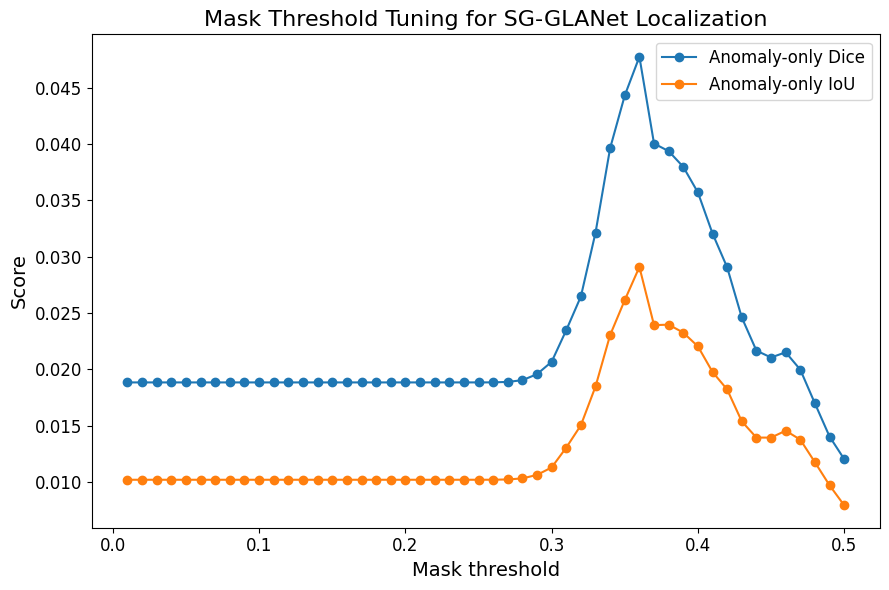

In [48]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 6))

plt.plot(
    mask_threshold_df["threshold"],
    mask_threshold_df["pixel_dice_anomaly_only"],
    marker="o",
    label="Anomaly-only Dice"
)

plt.plot(
    mask_threshold_df["threshold"],
    mask_threshold_df["pixel_iou_anomaly_only"],
    marker="o",
    label="Anomaly-only IoU"
)

plt.xlabel("Mask threshold", fontsize=14)
plt.ylabel("Score", fontsize=14)
plt.title("Mask Threshold Tuning for SG-GLANet Localization", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_mask_threshold_tuning_sgglanet_v1.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [49]:
import numpy as np
from PIL import Image
import torchvision.transforms.functional as TF
from tqdm.auto import tqdm
import torch

def compute_mask_pos_weight(dataframe, img_size=224, max_pos_weight=50.0):
    pos_pixels = 0
    neg_pixels = 0
    
    anomaly_df = dataframe[dataframe["target"] == 1].reset_index(drop=True)
    
    for _, row in tqdm(anomaly_df.iterrows(), total=len(anomaly_df), desc="Computing mask pos_weight"):
        mask = Image.open(row["mask_path"]).convert("L")
        mask = TF.resize(mask, (img_size, img_size), interpolation=TF.InterpolationMode.NEAREST)
        mask = TF.to_tensor(mask)
        mask = (mask > 0).float()
        
        pos_pixels += mask.sum().item()
        neg_pixels += mask.numel() - mask.sum().item()
    
    raw_pos_weight = neg_pixels / max(pos_pixels, 1)
    pos_weight = min(raw_pos_weight, max_pos_weight)
    
    return {
        "positive_pixels": int(pos_pixels),
        "negative_pixels": int(neg_pixels),
        "positive_ratio": pos_pixels / (pos_pixels + neg_pixels),
        "raw_pos_weight": raw_pos_weight,
        "used_pos_weight": pos_weight
    }

mask_weight_info = compute_mask_pos_weight(
    screen_train_df,
    img_size=SEG_IMG_SIZE,
    max_pos_weight=50.0
)

mask_weight_info

Computing mask pos_weight:   0%|          | 0/576 [00:00<?, ?it/s]

{'positive_pixels': 317070,
 'negative_pixels': 28584306,
 'positive_ratio': 0.010970757932079082,
 'raw_pos_weight': 90.15140505251206,
 'used_pos_weight': 50.0}

In [50]:
class BalancedGlobalLocalLoss(nn.Module):
    def __init__(
        self,
        class_weights_tensor,
        lambda_seg=0.5,
        normal_seg_weight=0.05,
        pos_weight_value=20.0
    ):
        super().__init__()
        self.lambda_seg = lambda_seg
        self.normal_seg_weight = normal_seg_weight
        
        self.classification_loss = nn.CrossEntropyLoss(weight=class_weights_tensor)
        
        pos_weight_tensor = torch.tensor([pos_weight_value], dtype=torch.float).to(device)
        self.weighted_bce_loss = nn.BCEWithLogitsLoss(pos_weight=pos_weight_tensor)
        self.normal_bce_loss = nn.BCEWithLogitsLoss()
        self.dice_loss = DiceLoss()

    def forward(self, class_logits, seg_logits, class_targets, mask_targets):
        cls_loss = self.classification_loss(class_logits, class_targets)

        anomaly_idx = class_targets == 1
        normal_idx = class_targets == 0

        seg_loss = torch.tensor(0.0, device=class_logits.device)
        bce = torch.tensor(0.0, device=class_logits.device)
        dice = torch.tensor(0.0, device=class_logits.device)

        if anomaly_idx.sum() > 0:
            seg_logits_anom = seg_logits[anomaly_idx]
            mask_targets_anom = mask_targets[anomaly_idx]

            bce_anom = self.weighted_bce_loss(seg_logits_anom, mask_targets_anom)
            dice_anom = self.dice_loss(seg_logits_anom, mask_targets_anom)
            seg_loss = seg_loss + bce_anom + dice_anom
            
            bce = bce_anom
            dice = dice_anom

        if normal_idx.sum() > 0 and self.normal_seg_weight > 0:
            seg_logits_norm = seg_logits[normal_idx]
            mask_targets_norm = mask_targets[normal_idx]
            normal_loss = self.normal_bce_loss(seg_logits_norm, mask_targets_norm)
            seg_loss = seg_loss + self.normal_seg_weight * normal_loss

        total_loss = cls_loss + self.lambda_seg * seg_loss

        return total_loss, cls_loss, seg_loss, bce, dice

In [51]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.block(x)


class UpBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels):
        super().__init__()
        self.conv = ConvBlock(in_channels + skip_channels, out_channels)
    
    def forward(self, x, skip):
        x = F.interpolate(x, size=skip.shape[-2:], mode="bilinear", align_corners=False)
        x = torch.cat([x, skip], dim=1)
        x = self.conv(x)
        return x


class GLUNet(nn.Module):
    def __init__(self, num_classes=2, pretrained=True):
        super().__init__()
        
        weights = models.ResNet18_Weights.IMAGENET1K_V1 if pretrained else None
        base = models.resnet18(weights=weights)
        
        self.enc0 = nn.Sequential(
            base.conv1,
            base.bn1,
            base.relu
        )  # 64, 112,112
        
        self.pool = base.maxpool
        self.enc1 = base.layer1  # 64, 56,56
        self.enc2 = base.layer2  # 128, 28,28
        self.enc3 = base.layer3  # 256, 14,14
        self.enc4 = base.layer4  # 512, 7,7
        
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes)
        )
        
        self.up3 = UpBlock(512, 256, 256)
        self.up2 = UpBlock(256, 128, 128)
        self.up1 = UpBlock(128, 64, 64)
        self.up0 = UpBlock(64, 64, 32)
        
        self.seg_head = nn.Conv2d(32, 1, kernel_size=1)

    def forward(self, x):
        x0 = self.enc0(x)
        x1 = self.enc1(self.pool(x0))
        x2 = self.enc2(x1)
        x3 = self.enc3(x2)
        x4 = self.enc4(x3)
        
        pooled = self.global_pool(x4)
        class_logits = self.classifier(pooled)
        
        d3 = self.up3(x4, x3)
        d2 = self.up2(d3, x2)
        d1 = self.up1(d2, x1)
        d0 = self.up0(d1, x0)
        
        seg_logits = self.seg_head(d0)
        seg_logits = F.interpolate(
            seg_logits,
            size=x.shape[-2:],
            mode="bilinear",
            align_corners=False
        )
        
        return class_logits, seg_logits

In [52]:
glunet_test = GLUNet(num_classes=2, pretrained=True).to(device)

with torch.no_grad():
    class_logits, seg_logits = glunet_test(images_mt.to(device))

print("Class logits:", class_logits.shape)
print("Seg logits:", seg_logits.shape)

total_params = sum(p.numel() for p in glunet_test.parameters())
trainable_params = sum(p.numel() for p in glunet_test.parameters() if p.requires_grad)

print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)

del glunet_test
torch.cuda.empty_cache()

Class logits: torch.Size([32, 2])
Seg logits: torch.Size([32, 1, 224, 224])
Total parameters: 14452963
Trainable parameters: 14452963


In [53]:
def run_glunet_experiment(
    lambda_seg=0.5,
    normal_seg_weight=0.05,
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name=None
):
    if experiment_name is None:
        experiment_name = f"glunet_resnet18_lambda{lambda_seg}"

    print("\n" + "="*80)
    print(f"Running experiment: {experiment_name}")
    print("="*80)

    result_file = f"{output_dir}/{experiment_name}_result.csv"
    history_file = f"{output_dir}/{experiment_name}_history.csv"
    model_file = f"{output_dir}/{experiment_name}_best.pth"
    val_pred_file = f"{output_dir}/{experiment_name}_val_predictions.csv"

    if os.path.exists(result_file):
        print(f"Result already exists: {result_file}")
        return pd.read_csv(result_file)

    model = GLUNet(
        num_classes=2,
        pretrained=True
    ).to(device)

    criterion = BalancedGlobalLocalLoss(
        class_weights_tensor=class_weights_tensor,
        lambda_seg=lambda_seg,
        normal_seg_weight=normal_seg_weight,
        pos_weight_value=mask_weight_info["used_pos_weight"]
    )

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=epochs
    )

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    best_f1 = -1
    best_epoch = None
    best_metrics = None
    best_outputs_df = None

    history = []
    start_time = time.time()

    for epoch in range(1, epochs + 1):
        print(f"\nEpoch {epoch}/{epochs}")

        train_metrics = train_one_epoch_multitask(
            model=model,
            loader=seg_train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics, val_outputs_df, masks_true, masks_prob = evaluate_multitask(
            model=model,
            loader=seg_val_loader,
            criterion=criterion,
            device=device,
            mask_threshold=0.5
        )

        scheduler.step()

        row = {
            "experiment": experiment_name,
            "epoch": epoch,
            **{f"train_{k}": v for k, v in train_metrics.items()},
            **{f"val_{k}": v for k, v in val_metrics.items()}
        }
        history.append(row)

        print(
            f"Train Total Loss: {train_metrics['total_loss']:.4f} | "
            f"Val F1: {val_metrics['f1']:.4f} | "
            f"Val BalAcc: {val_metrics['balanced_accuracy']:.4f} | "
            f"Val ROC-AUC: {val_metrics['roc_auc']:.4f} | "
            f"Val PR-AUC: {val_metrics['pr_auc']:.4f} | "
            f"Val IoU(anom): {val_metrics['pixel_iou_anomaly_only']:.4f} | "
            f"Val Dice(anom): {val_metrics['pixel_dice_anomaly_only']:.4f}"
        )

        if val_metrics["f1"] > best_f1:
            best_f1 = val_metrics["f1"]
            best_epoch = epoch
            best_metrics = val_metrics.copy()
            best_outputs_df = val_outputs_df.copy()
            torch.save(model.state_dict(), model_file)
            print(f"Best GLU-Net saved. F1 = {best_f1:.4f}")

    elapsed_time = time.time() - start_time

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_file, index=False)

    best_outputs_df.to_csv(val_pred_file, index=False)

    result = {
        "experiment": experiment_name,
        "architecture": "GLU-Net",
        "backbone": "resnet18",
        "lambda_seg": lambda_seg,
        "normal_seg_weight": normal_seg_weight,
        "epochs": epochs,
        "best_epoch": best_epoch,
        "loss_variant": "balanced_global_local_loss",
        "image_size": SEG_IMG_SIZE,
        "batch_size": SEG_BATCH_SIZE,
        "lr": lr,
        "weight_decay": weight_decay,
        "trainable_params": trainable_params,
        "total_params": total_params,
        "time_minutes": round(elapsed_time / 60, 2),
        **{f"val_{k}": v for k, v in best_metrics.items()}
    }

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)

    del model
    torch.cuda.empty_cache()

    print("\nSaved:")
    print(result_file)
    print(history_file)
    print(model_file)
    print(val_pred_file)

    return result_df

In [54]:
glunet_lambda05 = run_glunet_experiment(
    lambda_seg=0.5,
    normal_seg_weight=0.05,
    epochs=5,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name="glunet_resnet18_lambda05_e5"
)

glunet_lambda05


Running experiment: glunet_resnet18_lambda05_e5

Epoch 1/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.6192 | Val F1: 0.3313 | Val BalAcc: 0.6696 | Val ROC-AUC: 0.7515 | Val PR-AUC: 0.2806 | Val IoU(anom): 0.0341 | Val Dice(anom): 0.0563
Best GLU-Net saved. F1 = 0.3313

Epoch 2/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.4196 | Val F1: 0.4130 | Val BalAcc: 0.7468 | Val ROC-AUC: 0.8255 | Val PR-AUC: 0.4011 | Val IoU(anom): 0.0471 | Val Dice(anom): 0.0722
Best GLU-Net saved. F1 = 0.4130

Epoch 3/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.2293 | Val F1: 0.4766 | Val BalAcc: 0.7754 | Val ROC-AUC: 0.8637 | Val PR-AUC: 0.5036 | Val IoU(anom): 0.0546 | Val Dice(anom): 0.0845
Best GLU-Net saved. F1 = 0.4766

Epoch 4/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.0919 | Val F1: 0.5860 | Val BalAcc: 0.7857 | Val ROC-AUC: 0.8963 | Val PR-AUC: 0.6204 | Val IoU(anom): 0.0686 | Val Dice(anom): 0.1055
Best GLU-Net saved. F1 = 0.5860

Epoch 5/5


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.9961 | Val F1: 0.6177 | Val BalAcc: 0.8152 | Val ROC-AUC: 0.9058 | Val PR-AUC: 0.6397 | Val IoU(anom): 0.0688 | Val Dice(anom): 0.1079
Best GLU-Net saved. F1 = 0.6177

Saved:
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e5_result.csv
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e5_history.csv
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e5_best.pth
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e5_val_predictions.csv


,experiment,architecture,backbone,lambda_seg,normal_seg_weight,epochs,best_epoch,loss_variant,image_size,batch_size,...,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_pixel_iou_all,val_pixel_dice_all,val_pixel_iou_anomaly_only,val_pixel_dice_anomaly_only,val_n_anomaly_masks
0,glunet_resnet18_lambda05_e5,GLU-Net,resnet18,0.5,0.05,5,5,balanced_global_local_loss,224,32,...,0.551913,0.701389,0.617737,0.905799,0.639706,0.008393,0.012729,0.068767,0.107881,144


In [55]:
glunet_lambda05_e10 = run_glunet_experiment(
    lambda_seg=0.5,
    normal_seg_weight=0.05,
    epochs=10,
    lr=3e-5,
    weight_decay=1e-4,
    experiment_name="glunet_resnet18_lambda05_e10"
)

glunet_lambda05_e10


Running experiment: glunet_resnet18_lambda05_e10

Epoch 1/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.6015 | Val F1: 0.3114 | Val BalAcc: 0.6501 | Val ROC-AUC: 0.7478 | Val PR-AUC: 0.2855 | Val IoU(anom): 0.0387 | Val Dice(anom): 0.0648
Best GLU-Net saved. F1 = 0.3114

Epoch 2/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.3734 | Val F1: 0.5042 | Val BalAcc: 0.7571 | Val ROC-AUC: 0.8436 | Val PR-AUC: 0.5184 | Val IoU(anom): 0.0519 | Val Dice(anom): 0.0839
Best GLU-Net saved. F1 = 0.5042

Epoch 3/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.1740 | Val F1: 0.4988 | Val BalAcc: 0.7814 | Val ROC-AUC: 0.8695 | Val PR-AUC: 0.6143 | Val IoU(anom): 0.0546 | Val Dice(anom): 0.0879

Epoch 4/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 1.0548 | Val F1: 0.5723 | Val BalAcc: 0.7944 | Val ROC-AUC: 0.9018 | Val PR-AUC: 0.6424 | Val IoU(anom): 0.0826 | Val Dice(anom): 0.1235
Best GLU-Net saved. F1 = 0.5723

Epoch 5/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.9321 | Val F1: 0.5950 | Val BalAcc: 0.8269 | Val ROC-AUC: 0.9067 | Val PR-AUC: 0.6753 | Val IoU(anom): 0.0741 | Val Dice(anom): 0.1135
Best GLU-Net saved. F1 = 0.5950

Epoch 6/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.8607 | Val F1: 0.6196 | Val BalAcc: 0.8482 | Val ROC-AUC: 0.9218 | Val PR-AUC: 0.7126 | Val IoU(anom): 0.0936 | Val Dice(anom): 0.1393
Best GLU-Net saved. F1 = 0.6196

Epoch 7/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.7867 | Val F1: 0.7261 | Val BalAcc: 0.8607 | Val ROC-AUC: 0.9203 | Val PR-AUC: 0.7721 | Val IoU(anom): 0.1118 | Val Dice(anom): 0.1672
Best GLU-Net saved. F1 = 0.7261

Epoch 8/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.7558 | Val F1: 0.6905 | Val BalAcc: 0.8699 | Val ROC-AUC: 0.9343 | Val PR-AUC: 0.7702 | Val IoU(anom): 0.1102 | Val Dice(anom): 0.1675

Epoch 9/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.7290 | Val F1: 0.7078 | Val BalAcc: 0.8547 | Val ROC-AUC: 0.9386 | Val PR-AUC: 0.7858 | Val IoU(anom): 0.1192 | Val Dice(anom): 0.1766

Epoch 10/10


Training SG-GLANet:   0%|          | 0/163 [00:00<?, ?it/s]

Evaluating SG-GLANet:   0%|          | 0/41 [00:00<?, ?it/s]

Train Total Loss: 0.7071 | Val F1: 0.7285 | Val BalAcc: 0.8503 | Val ROC-AUC: 0.9409 | Val PR-AUC: 0.7956 | Val IoU(anom): 0.1093 | Val Dice(anom): 0.1644
Best GLU-Net saved. F1 = 0.7285

Saved:
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e10_result.csv
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e10_history.csv
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e10_best.pth
/kaggle/working/visa_outputs/glunet_resnet18_lambda05_e10_val_predictions.csv


,experiment,architecture,backbone,lambda_seg,normal_seg_weight,epochs,best_epoch,loss_variant,image_size,batch_size,...,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_pixel_iou_all,val_pixel_dice_all,val_pixel_iou_anomaly_only,val_pixel_dice_anomaly_only,val_n_anomaly_masks
0,glunet_resnet18_lambda05_e10,GLU-Net,resnet18,0.5,0.05,10,10,balanced_global_local_loss,224,32,...,0.721088,0.736111,0.728522,0.940906,0.795627,0.012887,0.01899,0.109305,0.164358,144


In [56]:
import glob
import pandas as pd
import os

# Baseline fine-tuning tablosu
baseline_df = finetune_results_df.copy()

baseline_arch_rows = baseline_df[
    baseline_df["model"].isin(["convnext_tiny", "resnet18", "densenet121"])
].copy()

baseline_arch_rows["experiment"] = baseline_arch_rows["model"].apply(lambda x: f"baseline_{x}")
baseline_arch_rows["architecture"] = "Image-level baseline"
baseline_arch_rows["backbone"] = baseline_arch_rows["model"]
baseline_arch_rows["lambda_seg"] = None
baseline_arch_rows["loss_variant"] = "weighted_cross_entropy"
baseline_arch_rows["val_pixel_iou_anomaly_only"] = None
baseline_arch_rows["val_pixel_dice_anomaly_only"] = None

baseline_arch_rows = baseline_arch_rows[
    [
        "experiment",
        "architecture",
        "backbone",
        "epochs",
        "best_epoch",
        "loss_variant",
        "val_accuracy",
        "val_balanced_accuracy",
        "val_precision",
        "val_recall",
        "val_f1",
        "val_roc_auc",
        "val_pr_auc",
        "val_pixel_iou_anomaly_only",
        "val_pixel_dice_anomaly_only",
        "trainable_params",
        "total_params",
        "time_minutes"
    ]
]

# Proposed architecture results
proposed_files = [
    f"{output_dir}/sgglanet_convnext_lambda025_e5_result.csv",
    f"{output_dir}/sgglanet_v2_convnext_lambda025_e5_result.csv",
    f"{output_dir}/glunet_resnet18_lambda05_e5_result.csv",
    f"{output_dir}/glunet_resnet18_lambda05_e10_result.csv"
]

proposed_rows = []

for file in proposed_files:
    if os.path.exists(file):
        temp = pd.read_csv(file)

        if "architecture" not in temp.columns:
            temp["architecture"] = "SG-GLANet"

        if "loss_variant" not in temp.columns:
            temp["loss_variant"] = "multi_task_loss"

        proposed_rows.append(temp)

proposed_df = pd.concat(proposed_rows, ignore_index=True)

proposed_df = proposed_df[
    [
        "experiment",
        "architecture",
        "backbone",
        "epochs",
        "best_epoch",
        "loss_variant",
        "val_accuracy",
        "val_balanced_accuracy",
        "val_precision",
        "val_recall",
        "val_f1",
        "val_roc_auc",
        "val_pr_auc",
        "val_pixel_iou_anomaly_only",
        "val_pixel_dice_anomaly_only",
        "trainable_params",
        "total_params",
        "time_minutes"
    ]
]

architecture_comparison_df = pd.concat(
    [baseline_arch_rows, proposed_df],
    ignore_index=True
)

architecture_comparison_df = architecture_comparison_df.sort_values(
    "val_f1",
    ascending=False
)

architecture_comparison_df.to_csv(
    f"{output_dir}/table_architecture_and_ablation_comparison.csv",
    index=False
)

architecture_comparison_df

/tmp/ipykernel_57/2990396837.py:90: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  architecture_comparison_df = pd.concat(


,experiment,architecture,backbone,epochs,best_epoch,loss_variant,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_pixel_iou_anomaly_only,val_pixel_dice_anomaly_only,trainable_params,total_params,time_minutes
6,glunet_resnet18_lambda05_e10,GLU-Net,resnet18,10,10,balanced_global_local_loss,0.939184,0.850307,0.721088,0.736111,0.728522,0.940906,0.795627,0.109305,0.164358,14452963,14452963,11.38
3,sgglanet_convnext_lambda025_e5,SG-GLANet,convnext_tiny,5,5,multi_task_loss,0.906851,0.871636,0.553488,0.826389,0.662953,0.930180,0.732386,0.007916,0.012025,30173987,30173987,5.99
0,baseline_convnext_tiny,Image-level baseline,convnext_tiny,5,4,weighted_cross_entropy,0.918399,0.826461,0.614458,0.708333,0.658065,0.928734,0.687293,NaN,NaN,27821666,27821666,5.90
1,baseline_resnet18,Image-level baseline,resnet18,5,5,weighted_cross_entropy,0.906082,0.837771,0.556701,0.750000,0.639053,0.923049,0.712363,NaN,NaN,11177538,11177538,5.28
4,sgglanet_v2_convnext_lambda025_e5,SG-GLANet,convnext_tiny,5,5,anomaly_focused_segmentation,0.899153,0.842992,0.531100,0.770833,0.628895,0.917196,0.701535,0.000267,0.000529,30173987,30173987,5.87
5,glunet_resnet18_lambda05_e5,GLU-Net,resnet18,5,5,balanced_global_local_loss,0.903772,0.815197,0.551913,0.701389,0.617737,0.905799,0.639706,0.068767,0.107881,14452963,14452963,5.72
2,baseline_densenet121,Image-level baseline,densenet121,5,5,weighted_cross_entropy,0.896074,0.804789,0.523810,0.687500,0.594595,0.906445,0.664912,NaN,NaN,6955906,6955906,5.71


In [57]:
architecture_paper_table = architecture_comparison_df[
    [
        "experiment",
        "architecture",
        "backbone",
        "epochs",
        "best_epoch",
        "loss_variant",
        "val_accuracy",
        "val_balanced_accuracy",
        "val_precision",
        "val_recall",
        "val_f1",
        "val_roc_auc",
        "val_pr_auc",
        "val_pixel_iou_anomaly_only",
        "val_pixel_dice_anomaly_only",
        "trainable_params",
        "total_params",
        "time_minutes"
    ]
].copy()

architecture_paper_table.columns = [
    "Experiment",
    "Architecture",
    "Backbone",
    "Epochs",
    "Best epoch",
    "Loss strategy",
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC",
    "Anomaly-only IoU",
    "Anomaly-only Dice",
    "Trainable Parameters",
    "Total Parameters",
    "Time (min)"
]

metric_cols = [
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC",
    "Anomaly-only IoU",
    "Anomaly-only Dice"
]

architecture_paper_table[metric_cols] = architecture_paper_table[metric_cols].round(4)
architecture_paper_table["Time (min)"] = architecture_paper_table["Time (min)"].round(2)

architecture_paper_table.to_csv(
    f"{output_dir}/table_4_architecture_ablation_comparison_paper.csv",
    index=False
)

architecture_paper_table

,Experiment,Architecture,Backbone,Epochs,Best epoch,Loss strategy,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC,Anomaly-only IoU,Anomaly-only Dice,Trainable Parameters,Total Parameters,Time (min)
6,glunet_resnet18_lambda05_e10,GLU-Net,resnet18,10,10,balanced_global_local_loss,0.9392,0.8503,0.7211,0.7361,0.7285,0.9409,0.7956,0.1093,0.1644,14452963,14452963,11.38
3,sgglanet_convnext_lambda025_e5,SG-GLANet,convnext_tiny,5,5,multi_task_loss,0.9069,0.8716,0.5535,0.8264,0.6630,0.9302,0.7324,0.0079,0.0120,30173987,30173987,5.99
0,baseline_convnext_tiny,Image-level baseline,convnext_tiny,5,4,weighted_cross_entropy,0.9184,0.8265,0.6145,0.7083,0.6581,0.9287,0.6873,NaN,NaN,27821666,27821666,5.90
1,baseline_resnet18,Image-level baseline,resnet18,5,5,weighted_cross_entropy,0.9061,0.8378,0.5567,0.7500,0.6391,0.9230,0.7124,NaN,NaN,11177538,11177538,5.28
4,sgglanet_v2_convnext_lambda025_e5,SG-GLANet,convnext_tiny,5,5,anomaly_focused_segmentation,0.8992,0.8430,0.5311,0.7708,0.6289,0.9172,0.7015,0.0003,0.0005,30173987,30173987,5.87
5,glunet_resnet18_lambda05_e5,GLU-Net,resnet18,5,5,balanced_global_local_loss,0.9038,0.8152,0.5519,0.7014,0.6177,0.9058,0.6397,0.0688,0.1079,14452963,14452963,5.72
2,baseline_densenet121,Image-level baseline,densenet121,5,5,weighted_cross_entropy,0.8961,0.8048,0.5238,0.6875,0.5946,0.9064,0.6649,NaN,NaN,6955906,6955906,5.71


In [58]:
def evaluate_saved_multitask_model_on_test(
    model_type,
    model_path,
    experiment_name,
    backbone_name=None,
    lambda_seg=0.25,
    loss_type="multi_task_loss"
):
    print("\n" + "="*80)
    print(f"Official test evaluation: {experiment_name}")
    print("="*80)

    result_file = f"{output_dir}/official_test_{experiment_name}_result.csv"
    pred_file = f"{output_dir}/official_test_{experiment_name}_predictions.csv"

    if os.path.exists(result_file):
        print("Official test result already exists. Loading:")
        return pd.read_csv(result_file)

    if model_type == "sgglanet":
        model = SGGLANet(
            backbone_name=backbone_name,
            num_classes=2,
            pretrained=False
        ).to(device)

        if loss_type == "anomaly_focused":
            criterion = AnomalyFocusedMultiTaskLoss(
                class_weights_tensor=class_weights_tensor,
                lambda_seg=lambda_seg
            )
        else:
            criterion = MultiTaskLoss(
                class_weights_tensor=class_weights_tensor,
                lambda_seg=lambda_seg
            )

    elif model_type == "glunet":
        model = GLUNet(
            num_classes=2,
            pretrained=False
        ).to(device)

        criterion = BalancedGlobalLocalLoss(
            class_weights_tensor=class_weights_tensor,
            lambda_seg=lambda_seg,
            normal_seg_weight=0.05,
            pos_weight_value=mask_weight_info["used_pos_weight"]
        )

    else:
        raise ValueError("model_type must be 'sgglanet' or 'glunet'.")

    model.load_state_dict(torch.load(model_path, map_location=device))

    test_metrics, test_outputs_df, test_masks_true, test_masks_prob = evaluate_multitask(
        model=model,
        loader=seg_test_loader,
        criterion=criterion,
        device=device,
        mask_threshold=0.5
    )

    result = {
        "experiment": experiment_name,
        "model_type": model_type,
        "backbone": backbone_name if backbone_name is not None else "resnet18",
        "lambda_seg": lambda_seg,
        **{f"test_{k}": v for k, v in test_metrics.items()}
    }

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)
    test_outputs_df.to_csv(pred_file, index=False)

    # Mask arrays are large; save compressed numpy files
    np.savez_compressed(
        f"{output_dir}/official_test_{experiment_name}_masks.npz",
        masks_true=test_masks_true,
        masks_prob=test_masks_prob
    )

    del model
    torch.cuda.empty_cache()

    print("Saved:")
    print(result_file)
    print(pred_file)
    print(f"{output_dir}/official_test_{experiment_name}_masks.npz")

    return result_df

In [59]:
official_glunet_e10 = evaluate_saved_multitask_model_on_test(
    model_type="glunet",
    model_path=f"{output_dir}/glunet_resnet18_lambda05_e10_best.pth",
    experiment_name="glunet_resnet18_lambda05_e10",
    backbone_name="resnet18",
    lambda_seg=0.5,
    loss_type="balanced_global_local_loss"
)

official_glunet_e10


Official test evaluation: glunet_resnet18_lambda05_e10


Evaluating SG-GLANet:   0%|          | 0/136 [00:00<?, ?it/s]

Saved:
/kaggle/working/visa_outputs/official_test_glunet_resnet18_lambda05_e10_result.csv
/kaggle/working/visa_outputs/official_test_glunet_resnet18_lambda05_e10_predictions.csv
/kaggle/working/visa_outputs/official_test_glunet_resnet18_lambda05_e10_masks.npz


,experiment,model_type,backbone,lambda_seg,test_total_loss,test_classification_loss,test_segmentation_loss,test_accuracy,test_balanced_accuracy,test_precision,test_recall,test_f1,test_roc_auc,test_pr_auc,test_pixel_iou_all,test_pixel_dice_all,test_pixel_iou_anomaly_only,test_pixel_dice_anomaly_only,test_n_anomaly_masks
0,glunet_resnet18_lambda05_e10,glunet,resnet18,0.5,0.303798,0.154217,0.299162,0.950555,0.88102,0.769231,0.791667,0.780287,0.968608,0.865522,0.012295,0.018182,0.102529,0.155603,480


In [60]:
official_sgglanet_v1 = evaluate_saved_multitask_model_on_test(
    model_type="sgglanet",
    model_path=f"{output_dir}/sgglanet_convnext_lambda025_e5_best.pth",
    experiment_name="sgglanet_convnext_lambda025_e5",
    backbone_name="convnext_tiny",
    lambda_seg=0.25,
    loss_type="multi_task_loss"
)

official_sgglanet_v1


Official test evaluation: sgglanet_convnext_lambda025_e5


Evaluating SG-GLANet:   0%|          | 0/136 [00:00<?, ?it/s]

Saved:
/kaggle/working/visa_outputs/official_test_sgglanet_convnext_lambda025_e5_result.csv
/kaggle/working/visa_outputs/official_test_sgglanet_convnext_lambda025_e5_predictions.csv
/kaggle/working/visa_outputs/official_test_sgglanet_convnext_lambda025_e5_masks.npz


,experiment,model_type,backbone,lambda_seg,test_total_loss,test_classification_loss,test_segmentation_loss,test_accuracy,test_balanced_accuracy,test_precision,test_recall,test_f1,test_roc_auc,test_pr_auc,test_pixel_iou_all,test_pixel_dice_all,test_pixel_iou_anomaly_only,test_pixel_dice_anomaly_only,test_n_anomaly_masks
0,sgglanet_convnext_lambda025_e5,sgglanet,convnext_tiny,0.25,0.59812,0.252167,1.383814,0.91659,0.897477,0.582754,0.872917,0.698916,0.949793,0.81053,0.795229,0.795634,0.007812,0.01147,480


In [61]:
def evaluate_saved_classification_model_on_test(
    model_name,
    model_path,
    experiment_name
):
    print("\n" + "="*80)
    print(f"Official test evaluation: {experiment_name}")
    print("="*80)

    result_file = f"{output_dir}/official_test_{experiment_name}_result.csv"
    pred_file = f"{output_dir}/official_test_{experiment_name}_predictions.csv"

    if os.path.exists(result_file):
        print("Official test result already exists. Loading:")
        return pd.read_csv(result_file)

    model = build_model(
        model_name=model_name,
        num_classes=2,
        freeze_backbone=False
    ).to(device)

    model.load_state_dict(torch.load(model_path, map_location=device))

    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

    test_metrics, test_outputs_df = evaluate_fast(
        model=model,
        loader=test_loader,
        criterion=criterion,
        device=device
    )

    result = {
        "experiment": experiment_name,
        "model_type": "image_level_baseline",
        "backbone": model_name,
        **{f"test_{k}": v for k, v in test_metrics.items()},
        "test_pixel_iou_anomaly_only": np.nan,
        "test_pixel_dice_anomaly_only": np.nan
    }

    result_df = pd.DataFrame([result])
    result_df.to_csv(result_file, index=False)
    test_outputs_df.to_csv(pred_file, index=False)

    del model
    torch.cuda.empty_cache()

    print("Saved:")
    print(result_file)
    print(pred_file)

    return result_df

In [62]:
official_baseline_convnext = evaluate_saved_classification_model_on_test(
    model_name="convnext_tiny",
    model_path=f"{output_dir}/finetune_best_convnext_tiny.pth",
    experiment_name="baseline_convnext_tiny"
)

official_baseline_convnext


Official test evaluation: baseline_convnext_tiny


Evaluating:   0%|          | 0/68 [00:00<?, ?it/s]

Saved:
/kaggle/working/visa_outputs/official_test_baseline_convnext_tiny_result.csv
/kaggle/working/visa_outputs/official_test_baseline_convnext_tiny_predictions.csv


,experiment,model_type,backbone,test_accuracy,test_balanced_accuracy,test_precision,test_recall,test_f1,test_roc_auc,test_pr_auc,test_loss,test_pixel_iou_anomaly_only,test_pixel_dice_anomaly_only
0,baseline_convnext_tiny,image_level_baseline,convnext_tiny,0.923752,0.848625,0.631119,0.752083,0.686312,0.940299,0.771214,0.2736,NaN,NaN


In [63]:
official_files = [
    f"{output_dir}/official_test_baseline_convnext_tiny_result.csv",
    f"{output_dir}/official_test_sgglanet_convnext_lambda025_e5_result.csv",
    f"{output_dir}/official_test_glunet_resnet18_lambda05_e10_result.csv"
]

official_rows = []

for file in official_files:
    temp = pd.read_csv(file)
    official_rows.append(temp)

official_test_df = pd.concat(official_rows, ignore_index=True)

# Eksik kolonları hizala
if "test_loss" not in official_test_df.columns:
    official_test_df["test_loss"] = np.nan

if "test_pixel_iou_anomaly_only" not in official_test_df.columns:
    official_test_df["test_pixel_iou_anomaly_only"] = np.nan

if "test_pixel_dice_anomaly_only" not in official_test_df.columns:
    official_test_df["test_pixel_dice_anomaly_only"] = np.nan

official_test_paper_table = official_test_df[
    [
        "experiment",
        "model_type",
        "backbone",
        "test_accuracy",
        "test_balanced_accuracy",
        "test_precision",
        "test_recall",
        "test_f1",
        "test_roc_auc",
        "test_pr_auc",
        "test_pixel_iou_anomaly_only",
        "test_pixel_dice_anomaly_only"
    ]
].copy()

official_test_paper_table.columns = [
    "Experiment",
    "Model type",
    "Backbone",
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC",
    "Anomaly-only IoU",
    "Anomaly-only Dice"
]

metric_cols = [
    "Accuracy",
    "Balanced Accuracy",
    "Precision",
    "Recall",
    "F1-score",
    "ROC-AUC",
    "PR-AUC",
    "Anomaly-only IoU",
    "Anomaly-only Dice"
]

official_test_paper_table[metric_cols] = official_test_paper_table[metric_cols].round(4)

official_test_paper_table = official_test_paper_table.sort_values(
    "F1-score",
    ascending=False
)

official_test_paper_table.to_csv(
    f"{output_dir}/table_5_official_test_final_comparison.csv",
    index=False
)

official_test_paper_table

,Experiment,Model type,Backbone,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC,Anomaly-only IoU,Anomaly-only Dice
2,glunet_resnet18_lambda05_e10,glunet,resnet18,0.9506,0.8810,0.7692,0.7917,0.7803,0.9686,0.8655,0.1025,0.1556
1,sgglanet_convnext_lambda025_e5,sgglanet,convnext_tiny,0.9166,0.8975,0.5828,0.8729,0.6989,0.9498,0.8105,0.0078,0.0115
0,baseline_convnext_tiny,image_level_baseline,convnext_tiny,0.9238,0.8486,0.6311,0.7521,0.6863,0.9403,0.7712,NaN,NaN


In [64]:
import pandas as pd
import os

pred_files = {
    "Baseline ConvNeXt-Tiny": f"{output_dir}/official_test_baseline_convnext_tiny_predictions.csv",
    "SG-GLANet": f"{output_dir}/official_test_sgglanet_convnext_lambda025_e5_predictions.csv",
    "GLU-Net": f"{output_dir}/official_test_glunet_resnet18_lambda05_e10_predictions.csv"
}

pred_dfs = {}

for name, path in pred_files.items():
    print(name, os.path.exists(path), path)
    pred_dfs[name] = pd.read_csv(path)
    print(pred_dfs[name].head())
    print(pred_dfs[name]["true_label"].value_counts())
    print("-" * 60)

Baseline ConvNeXt-Tiny True /kaggle/working/visa_outputs/official_test_baseline_convnext_tiny_predictions.csv
   object  true_label  pred_label  prob_anomaly
0  candle           0           0       0.02017
1  candle           0           0       0.03380
2  candle           0           0       0.03204
3  candle           0           0       0.04257
4  candle           0           0       0.02394
true_label
0    3848
1     480
Name: count, dtype: int64
------------------------------------------------------------
SG-GLANet True /kaggle/working/visa_outputs/official_test_sgglanet_convnext_lambda025_e5_predictions.csv
   object  true_label  pred_label  prob_anomaly
0  candle           0           0      0.011826
1  candle           0           0      0.010760
2  candle           0           0      0.014560
3  candle           0           0      0.014670
4  candle           0           0      0.013480
true_label
0    3848
1     480
Name: count, dtype: int64
----------------------------------

/tmp/ipykernel_57/405138547.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


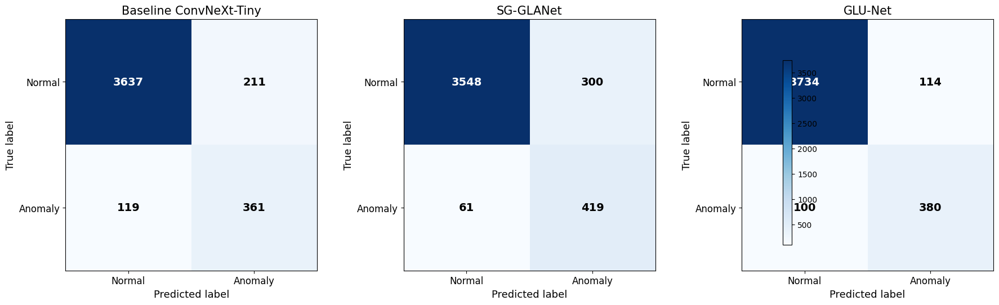

In [65]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

model_order = [
    "Baseline ConvNeXt-Tiny",
    "SG-GLANet",
    "GLU-Net"
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, model_name in zip(axes, model_order):
    df = pred_dfs[model_name]
    
    y_true = df["true_label"].values
    y_pred = df["pred_label"].values
    
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    
    im = ax.imshow(cm, interpolation="nearest", cmap="Blues")
    
    ax.set_title(model_name, fontsize=15)
    ax.set_xlabel("Predicted label", fontsize=13)
    ax.set_ylabel("True label", fontsize=13)
    
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.set_xticklabels(["Normal", "Anomaly"], fontsize=12)
    ax.set_yticklabels(["Normal", "Anomaly"], fontsize=12)
    
    thresh = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j, i, f"{cm[i, j]}",
                ha="center", va="center",
                fontsize=14,
                color="white" if cm[i, j] > thresh else "black",
                fontweight="bold"
            )

fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.85)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_official_test_confusion_matrices.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [66]:
from sklearn.metrics import confusion_matrix
import pandas as pd

cm_rows = []

for model_name in model_order:
    df = pred_dfs[model_name]
    
    y_true = df["true_label"].values
    y_pred = df["pred_label"].values
    
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    
    cm_rows.append({
        "Model": model_name,
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "TP": tp
    })

cm_summary_df = pd.DataFrame(cm_rows)

cm_summary_df.to_csv(
    f"{output_dir}/table_confusion_matrix_summary.csv",
    index=False
)

cm_summary_df

,Model,TN,FP,FN,TP
0,Baseline ConvNeXt-Tiny,3637,211,119,361
1,SG-GLANet,3548,300,61,419
2,GLU-Net,3734,114,100,380


/tmp/ipykernel_57/1956958005.py:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


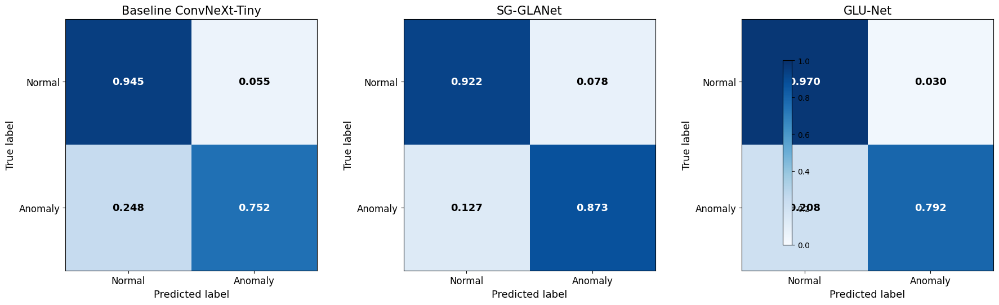

In [67]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, model_name in zip(axes, model_order):
    df = pred_dfs[model_name]
    
    y_true = df["true_label"].values
    y_pred = df["pred_label"].values
    
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
    
    im = ax.imshow(cm_norm, interpolation="nearest", cmap="Blues", vmin=0, vmax=1)
    
    ax.set_title(model_name, fontsize=15)
    ax.set_xlabel("Predicted label", fontsize=13)
    ax.set_ylabel("True label", fontsize=13)
    
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.set_xticklabels(["Normal", "Anomaly"], fontsize=12)
    ax.set_yticklabels(["Normal", "Anomaly"], fontsize=12)
    
    for i in range(cm_norm.shape[0]):
        for j in range(cm_norm.shape[1]):
            ax.text(
                j, i, f"{cm_norm[i, j]:.3f}",
                ha="center", va="center",
                fontsize=13,
                color="white" if cm_norm[i, j] > 0.5 else "black",
                fontweight="bold"
            )

fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.85)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_official_test_confusion_matrices_normalized.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

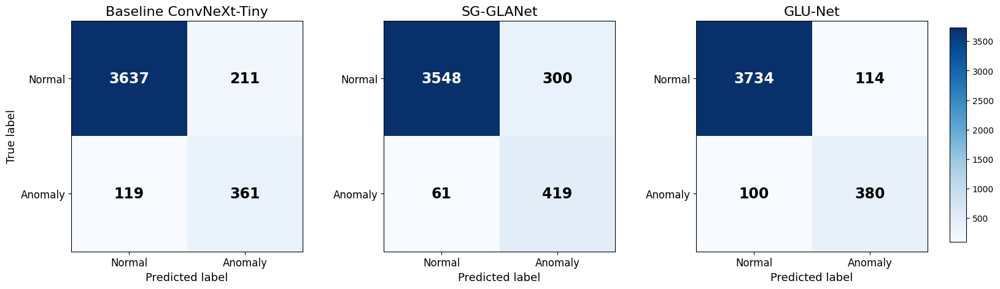

In [68]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

model_order = [
    "Baseline ConvNeXt-Tiny",
    "SG-GLANet",
    "GLU-Net"
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

last_im = None

for idx, (ax, model_name) in enumerate(zip(axes, model_order)):
    df = pred_dfs[model_name]
    
    y_true = df["true_label"].values
    y_pred = df["pred_label"].values
    
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    
    im = ax.imshow(cm, interpolation="nearest", cmap="Blues")
    last_im = im
    
    ax.set_title(model_name, fontsize=16)
    ax.set_xlabel("Predicted label", fontsize=13)
    
    if idx == 0:
        ax.set_ylabel("True label", fontsize=13)
    else:
        ax.set_ylabel("")
    
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.set_xticklabels(["Normal", "Anomaly"], fontsize=12)
    ax.set_yticklabels(["Normal", "Anomaly"], fontsize=12)
    
    thresh = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j, i, f"{cm[i, j]}",
                ha="center", va="center",
                fontsize=17,
                color="white" if cm[i, j] > thresh else "black",
                fontweight="bold"
            )

# sağda colorbar için ayrı alan aç
fig.subplots_adjust(wspace=0.35, right=0.90)
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.70])  # [left, bottom, width, height]
fig.colorbar(last_im, cax=cbar_ax)

plt.savefig(
    f"{output_dir}/figure_official_test_confusion_matrices.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

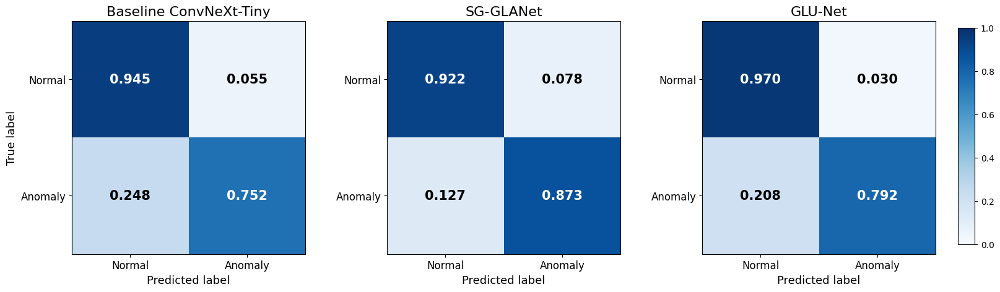

In [69]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

last_im = None

for idx, (ax, model_name) in enumerate(zip(axes, model_order)):
    df = pred_dfs[model_name]
    
    y_true = df["true_label"].values
    y_pred = df["pred_label"].values
    
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
    
    im = ax.imshow(cm_norm, interpolation="nearest", cmap="Blues", vmin=0, vmax=1)
    last_im = im
    
    ax.set_title(model_name, fontsize=16)
    ax.set_xlabel("Predicted label", fontsize=13)
    
    if idx == 0:
        ax.set_ylabel("True label", fontsize=13)
    else:
        ax.set_ylabel("")
    
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.set_xticklabels(["Normal", "Anomaly"], fontsize=12)
    ax.set_yticklabels(["Normal", "Anomaly"], fontsize=12)
    
    for i in range(cm_norm.shape[0]):
        for j in range(cm_norm.shape[1]):
            ax.text(
                j, i, f"{cm_norm[i, j]:.3f}",
                ha="center", va="center",
                fontsize=15,
                color="white" if cm_norm[i, j] > 0.5 else "black",
                fontweight="bold"
            )

fig.subplots_adjust(wspace=0.35, right=0.90)
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.70])
fig.colorbar(last_im, cax=cbar_ax)

plt.savefig(
    f"{output_dir}/figure_official_test_confusion_matrices_normalized.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

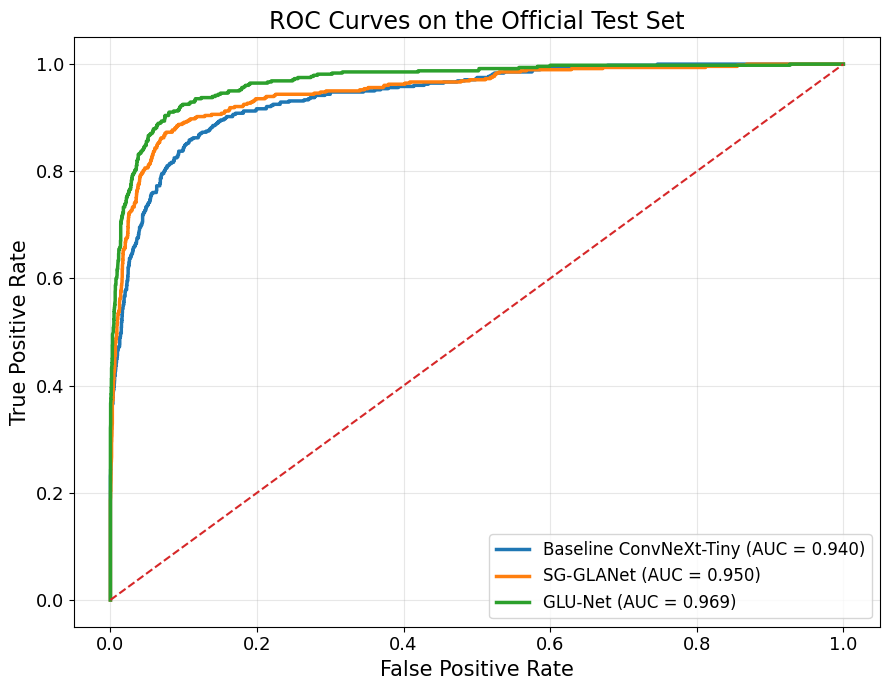

In [70]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(9, 7))

for model_name in model_order:
    df_model = pred_dfs[model_name]
    
    y_true = df_model["true_label"].values
    y_prob = df_model["prob_anomaly"].values
    
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(
        fpr,
        tpr,
        linewidth=2.5,
        label=f"{model_name} (AUC = {roc_auc:.3f})"
    )

plt.plot([0, 1], [0, 1], linestyle="--", linewidth=1.5)

plt.xlabel("False Positive Rate", fontsize=15)
plt.ylabel("True Positive Rate", fontsize=15)
plt.title("ROC Curves on the Official Test Set", fontsize=17)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=12, loc="lower right")
plt.grid(alpha=0.3)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_official_test_roc_curves.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

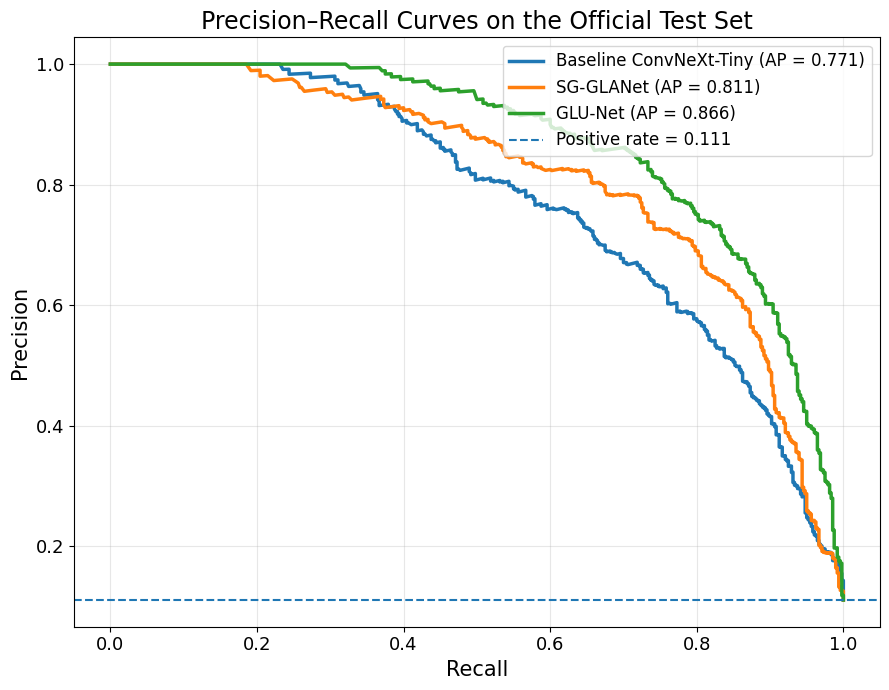

In [71]:
from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(9, 7))

for model_name in model_order:
    df_model = pred_dfs[model_name]
    
    y_true = df_model["true_label"].values
    y_prob = df_model["prob_anomaly"].values
    
    precision, recall, _ = precision_recall_curve(y_true, y_prob)
    pr_auc = average_precision_score(y_true, y_prob)
    
    plt.plot(
        recall,
        precision,
        linewidth=2.5,
        label=f"{model_name} (AP = {pr_auc:.3f})"
    )

baseline_positive_rate = test_df["target"].mean()
plt.axhline(
    baseline_positive_rate,
    linestyle="--",
    linewidth=1.5,
    label=f"Positive rate = {baseline_positive_rate:.3f}"
)

plt.xlabel("Recall", fontsize=15)
plt.ylabel("Precision", fontsize=15)
plt.title("Precision–Recall Curves on the Official Test Set", fontsize=17)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend(fontsize=12, loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_official_test_pr_curves.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [72]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, balanced_accuracy_score
import pandas as pd
import numpy as np

category_perf_rows = []

for model_name in model_order:
    df_model = pred_dfs[model_name].copy()
    
    for obj in sorted(df_model["object"].unique()):
        temp = df_model[df_model["object"] == obj]
        
        y_true = temp["true_label"].values
        y_pred = temp["pred_label"].values
        y_prob = temp["prob_anomaly"].values
        
        n_total = len(temp)
        n_normal = (y_true == 0).sum()
        n_anomaly = (y_true == 1).sum()
        
        row = {
            "Model": model_name,
            "Object category": obj,
            "N": n_total,
            "Normal": n_normal,
            "Anomaly": n_anomaly,
            "Accuracy": accuracy_score(y_true, y_pred),
            "Balanced Accuracy": balanced_accuracy_score(y_true, y_pred),
            "Precision": precision_score(y_true, y_pred, zero_division=0),
            "Recall": recall_score(y_true, y_pred, zero_division=0),
            "F1-score": f1_score(y_true, y_pred, zero_division=0)
        }
        
        category_perf_rows.append(row)

category_performance_df = pd.DataFrame(category_perf_rows)

metric_cols = ["Accuracy", "Balanced Accuracy", "Precision", "Recall", "F1-score"]
category_performance_df[metric_cols] = category_performance_df[metric_cols].round(4)

category_performance_df.to_csv(
    f"{output_dir}/table_category_level_performance_official_test.csv",
    index=False
)

category_performance_df

,Model,Object category,N,Normal,Anomaly,Accuracy,Balanced Accuracy,Precision,Recall,F1-score
0,Baseline ConvNeXt-Tiny,candle,440,400,40,0.9045,0.8688,0.4853,0.825,0.6111
1,Baseline ConvNeXt-Tiny,capsules,281,241,40,0.8612,0.8044,0.5088,0.725,0.5979
2,Baseline ConvNeXt-Tiny,cashew,240,200,40,0.9375,0.9625,0.7273,1.000,0.8421
3,Baseline ConvNeXt-Tiny,chewinggum,241,201,40,0.9253,0.9052,0.7292,0.875,0.7955
4,Baseline ConvNeXt-Tiny,fryum,240,200,40,0.9125,0.8175,0.7714,0.675,0.7200
5,Baseline ConvNeXt-Tiny,macaroni1,440,400,40,0.9318,0.6588,0.8125,0.325,0.4643
6,Baseline ConvNeXt-Tiny,macaroni2,440,400,40,0.9455,0.7675,0.7857,0.550,0.6471
7,Baseline ConvNeXt-Tiny,pcb1,442,402,40,0.9661,0.9138,0.7907,0.850,0.8193
8,Baseline ConvNeXt-Tiny,pcb2,440,400,40,0.9500,0.7250,1.0000,0.450,0.6207
9,Baseline ConvNeXt-Tiny,pcb3,442,402,40,0.8643,0.8803,0.3913,0.900,0.5455


In [73]:
glunet_category_perf = category_performance_df[
    category_performance_df["Model"] == "GLU-Net"
].sort_values("F1-score", ascending=False)

glunet_category_perf.to_csv(
    f"{output_dir}/table_glunet_category_level_performance.csv",
    index=False
)

glunet_category_perf

,Model,Object category,N,Normal,Anomaly,Accuracy,Balanced Accuracy,Precision,Recall,F1-score
27,GLU-Net,chewinggum,241,201,40,0.9710,0.9325,0.9459,0.875,0.9091
28,GLU-Net,fryum,240,200,40,0.9625,0.8975,0.9697,0.800,0.8767
35,GLU-Net,pipe_fryum,240,200,40,0.9625,0.8875,1.0000,0.775,0.8732
26,GLU-Net,cashew,240,200,40,0.9417,0.9350,0.7708,0.925,0.8409
34,GLU-Net,pcb4,442,402,40,0.9638,0.9688,0.7222,0.975,0.8298
31,GLU-Net,pcb1,442,402,40,0.9706,0.8825,0.8857,0.775,0.8267
29,GLU-Net,macaroni1,440,400,40,0.9682,0.9038,0.8250,0.825,0.8250
24,GLU-Net,candle,440,400,40,0.9591,0.9662,0.6964,0.975,0.8125
32,GLU-Net,pcb2,440,400,40,0.9659,0.8350,0.9310,0.675,0.7826
30,GLU-Net,macaroni2,440,400,40,0.9636,0.8338,0.9000,0.675,0.7714


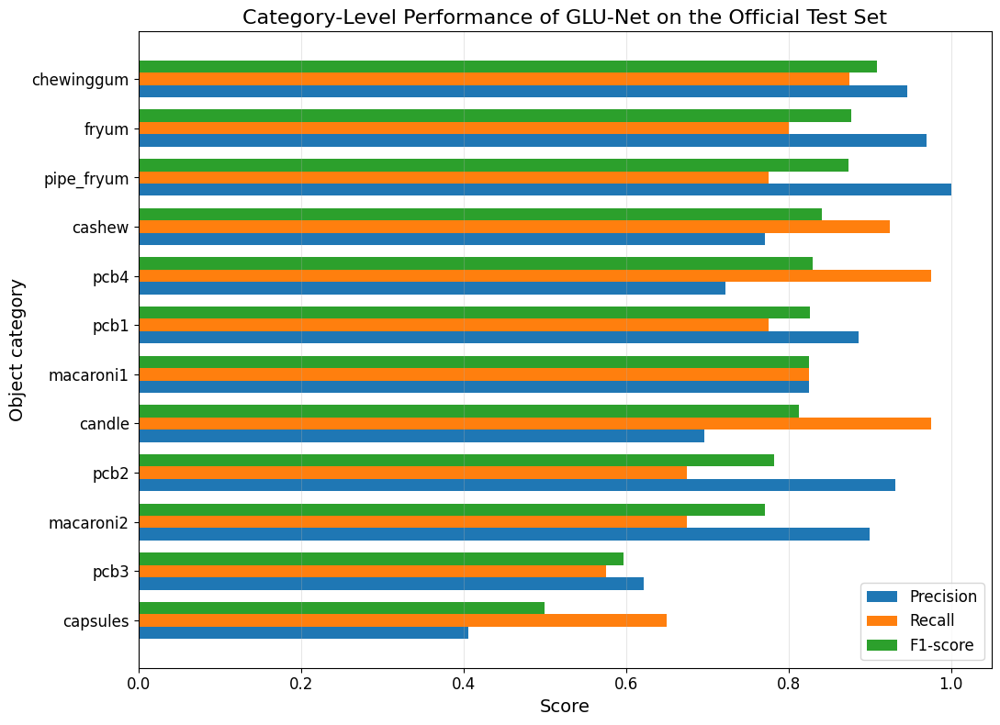

In [74]:
import matplotlib.pyplot as plt
import numpy as np

plot_df = glunet_category_perf.sort_values("F1-score", ascending=True).copy()

y = np.arange(len(plot_df))
height = 0.25

plt.figure(figsize=(11, 8))

plt.barh(y - height, plot_df["Precision"], height, label="Precision")
plt.barh(y, plot_df["Recall"], height, label="Recall")
plt.barh(y + height, plot_df["F1-score"], height, label="F1-score")

plt.yticks(y, plot_df["Object category"], fontsize=12)
plt.xticks(fontsize=12)
plt.xlabel("Score", fontsize=14)
plt.ylabel("Object category", fontsize=14)
plt.title("Category-Level Performance of GLU-Net on the Official Test Set", fontsize=16)
plt.xlim(0, 1.05)
plt.legend(fontsize=12, loc="lower right")
plt.grid(axis="x", alpha=0.3)

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_glunet_category_level_performance.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

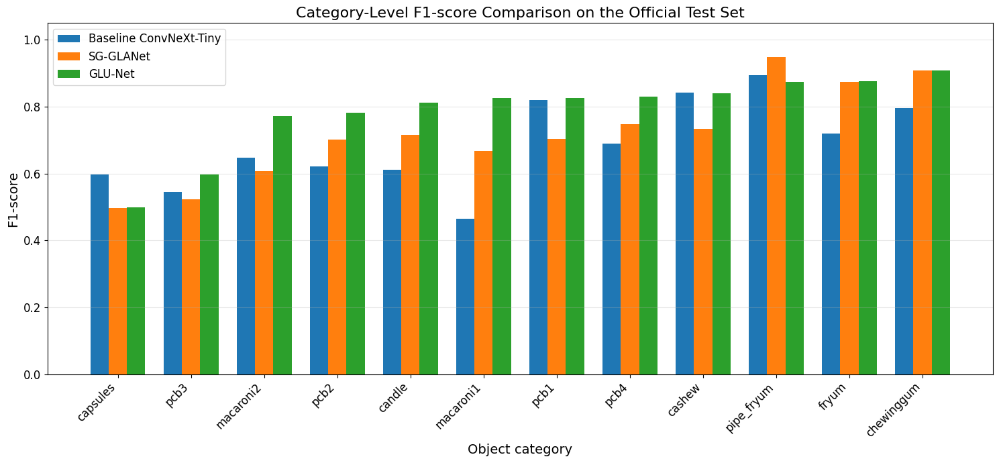

Model,Baseline ConvNeXt-Tiny,SG-GLANet,GLU-Net
Object category,,,
capsules,0.5979,0.4967,0.5000
pcb3,0.5455,0.5225,0.5974
macaroni2,0.6471,0.6067,0.7714
pcb2,0.6207,0.7013,0.7826
candle,0.6111,0.7158,0.8125
macaroni1,0.4643,0.6667,0.8250
pcb1,0.8193,0.7037,0.8267
pcb4,0.6897,0.7477,0.8298
cashew,0.8421,0.7339,0.8409


In [75]:
import matplotlib.pyplot as plt
import numpy as np

f1_pivot = category_performance_df.pivot_table(
    index="Object category",
    columns="Model",
    values="F1-score"
)

f1_pivot = f1_pivot[model_order]
f1_pivot = f1_pivot.sort_values("GLU-Net", ascending=True)

x = np.arange(len(f1_pivot.index))
width = 0.25

plt.figure(figsize=(15, 7))

for i, model_name in enumerate(model_order):
    plt.bar(
        x + (i - 1) * width,
        f1_pivot[model_name],
        width,
        label=model_name
    )

plt.xticks(x, f1_pivot.index, rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel("F1-score", fontsize=14)
plt.xlabel("Object category", fontsize=14)
plt.title("Category-Level F1-score Comparison on the Official Test Set", fontsize=16)
plt.ylim(0, 1.05)
plt.legend(fontsize=12)
plt.grid(axis="y", alpha=0.3)

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_category_level_f1_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

f1_pivot

In [76]:
import numpy as np
import pandas as pd
import os

glunet_mask_file = f"{output_dir}/official_test_glunet_resnet18_lambda05_e10_masks.npz"
glunet_pred_file = f"{output_dir}/official_test_glunet_resnet18_lambda05_e10_predictions.csv"

mask_data = np.load(glunet_mask_file)

glunet_test_masks_true = mask_data["masks_true"]
glunet_test_masks_prob = mask_data["masks_prob"]
glunet_test_preds = pd.read_csv(glunet_pred_file)

print("Masks true:", glunet_test_masks_true.shape)
print("Masks prob:", glunet_test_masks_prob.shape)
print("Predictions:", glunet_test_preds.shape)

glunet_test_preds.head()

Masks true: (4328, 1, 224, 224)
Masks prob: (4328, 1, 224, 224)
Predictions: (4328, 4)


,object,true_label,pred_label,prob_anomaly
0,candle,0,0,0.008610
1,candle,0,0,0.017060
2,candle,0,0,0.027340
3,candle,0,0,0.006462
4,candle,0,0,0.028300


In [78]:
test_df_ordered = test_df.reset_index(drop=True).copy()

print("test_df length:", len(test_df_ordered))
print("pred length   :", len(glunet_test_preds))

object_match_rate = (
    test_df_ordered["object"].values == glunet_test_preds["object"].values
).mean()

print("Object match rate:", object_match_rate)

test_with_preds = test_df_ordered.copy()
test_with_preds["true_label_predfile"] = glunet_test_preds["true_label"]
test_with_preds["pred_label"] = glunet_test_preds["pred_label"]
test_with_preds["prob_anomaly"] = glunet_test_preds["prob_anomaly"]

print("Label match rate:", (test_with_preds["target"].values == test_with_preds["true_label_predfile"].values).mean())

test_with_preds.head()

test_df length: 4328
pred length   : 4328
Object match rate: 1.0
Label match rate: 1.0


,object,split,label,image,mask,image_path,mask_path,target,true_label_predfile,pred_label,prob_anomaly
0,candle,test,normal,candle/Data/Images/Normal/0801.JPG,NaN,/kaggle/input/datasets/tensura3607/amazon-visa...,None,0,0,0,0.008610
1,candle,test,normal,candle/Data/Images/Normal/0792.JPG,NaN,/kaggle/input/datasets/tensura3607/amazon-visa...,None,0,0,0,0.017060
2,candle,test,normal,candle/Data/Images/Normal/0858.JPG,NaN,/kaggle/input/datasets/tensura3607/amazon-visa...,None,0,0,0,0.027340
3,candle,test,normal,candle/Data/Images/Normal/0611.JPG,NaN,/kaggle/input/datasets/tensura3607/amazon-visa...,None,0,0,0,0.006462
4,candle,test,normal,candle/Data/Images/Normal/0046.JPG,NaN,/kaggle/input/datasets/tensura3607/amazon-visa...,None,0,0,0,0.028300


In [79]:
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms.functional as TF

# Doğru tahmin edilmiş anomalili örnekler
correct_anomaly_indices = test_with_preds[
    (test_with_preds["target"] == 1) &
    (test_with_preds["pred_label"] == 1)
].index.tolist()

print("Correct anomaly examples:", len(correct_anomaly_indices))

# Farklı kategorilerden örnek seçmeye çalışalım
selected_indices = []

for obj in sorted(test_with_preds["object"].unique()):
    obj_indices = test_with_preds[
        (test_with_preds["object"] == obj) &
        (test_with_preds["target"] == 1) &
        (test_with_preds["pred_label"] == 1)
    ].index.tolist()
    
    if len(obj_indices) > 0:
        selected_indices.append(obj_indices[0])
    
    if len(selected_indices) >= 6:
        break

print("Selected indices:", selected_indices)
print(test_with_preds.loc[selected_indices, ["object", "label", "pred_label", "prob_anomaly"]])

Correct anomaly examples: 380
Selected indices: [400, 683, 921, 1162, 1402, 1842]
          object    label  pred_label  prob_anomaly
400       candle  anomaly           1        0.9780
683     capsules  anomaly           1        0.9150
921       cashew  anomaly           1        0.8660
1162  chewinggum  anomaly           1        0.8920
1402       fryum  anomaly           1        0.5366
1842   macaroni1  anomaly           1        0.7183


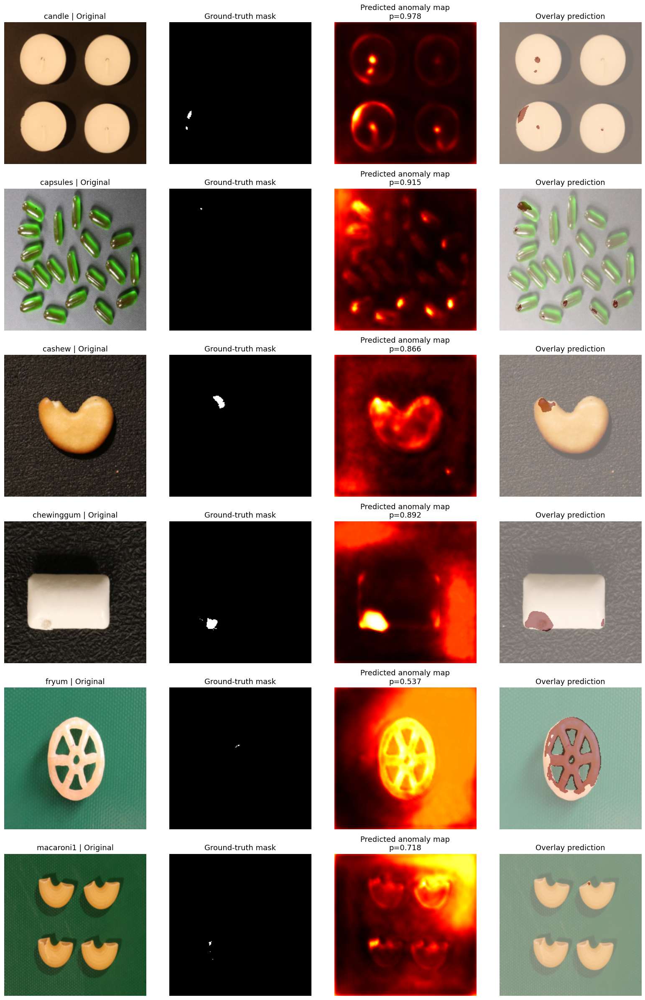

In [80]:
n_show = len(selected_indices)

fig, axes = plt.subplots(n_show, 4, figsize=(16, 4 * n_show))

if n_show == 1:
    axes = np.expand_dims(axes, axis=0)

for row_idx, idx in enumerate(selected_indices):
    row = test_with_preds.iloc[idx]
    
    img = Image.open(row["image_path"]).convert("RGB")
    img_resized = TF.resize(img, (SEG_IMG_SIZE, SEG_IMG_SIZE))
    img_np = np.array(img_resized) / 255.0
    
    gt_mask = glunet_test_masks_true[idx, 0]
    pred_prob = glunet_test_masks_prob[idx, 0]
    
    pred_binary = (pred_prob >= 0.5).astype(np.float32)
    
    axes[row_idx, 0].imshow(img_np)
    axes[row_idx, 0].set_title(f"{row['object']} | Original", fontsize=13)
    axes[row_idx, 0].axis("off")
    
    axes[row_idx, 1].imshow(gt_mask, cmap="gray")
    axes[row_idx, 1].set_title("Ground-truth mask", fontsize=13)
    axes[row_idx, 1].axis("off")
    
    axes[row_idx, 2].imshow(pred_prob, cmap="hot")
    axes[row_idx, 2].set_title(f"Predicted anomaly map\np={row['prob_anomaly']:.3f}", fontsize=13)
    axes[row_idx, 2].axis("off")
    
    axes[row_idx, 3].imshow(img_np)
    axes[row_idx, 3].imshow(pred_binary, alpha=0.45, cmap="Reds")
    axes[row_idx, 3].set_title("Overlay prediction", fontsize=13)
    axes[row_idx, 3].axis("off")

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_glunet_localization_examples.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

Selected examples:


,object,label,pred_label,prob_anomaly
412,candle,anomaly,1,0.9980
923,cashew,anomaly,1,0.9985
1163,chewinggum,anomaly,1,1.0000
4058,pcb4,anomaly,1,0.9980
4290,pipe_fryum,anomaly,1,1.0000
1847,macaroni1,anomaly,1,0.9995


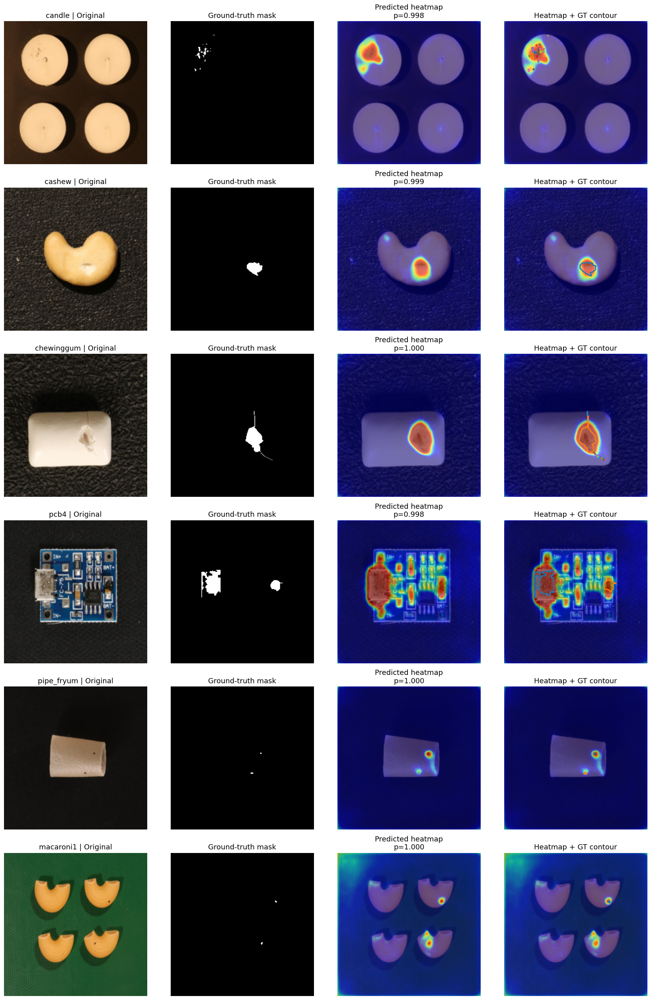

In [81]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import torchvision.transforms.functional as TF
from skimage import measure

# Daha iyi örnekler: doğru tahmin + yüksek olasılık + farklı kategoriler
candidate_df = test_with_preds[
    (test_with_preds["target"] == 1) &
    (test_with_preds["pred_label"] == 1)
].copy()

candidate_df["idx"] = candidate_df.index

selected_indices = []

preferred_objects = ["candle", "cashew", "chewinggum", "pcb4", "pipe_fryum", "macaroni1"]

for obj in preferred_objects:
    temp = candidate_df[candidate_df["object"] == obj].sort_values("prob_anomaly", ascending=False)
    if len(temp) > 0:
        selected_indices.append(int(temp.iloc[0]["idx"]))

print("Selected examples:")
display(test_with_preds.loc[selected_indices, ["object", "label", "pred_label", "prob_anomaly"]])

n_show = len(selected_indices)

fig, axes = plt.subplots(n_show, 4, figsize=(17, 4.2 * n_show))

if n_show == 1:
    axes = np.expand_dims(axes, axis=0)

for row_idx, idx in enumerate(selected_indices):
    row = test_with_preds.iloc[idx]
    
    img = Image.open(row["image_path"]).convert("RGB")
    img_resized = TF.resize(img, (SEG_IMG_SIZE, SEG_IMG_SIZE))
    img_np = np.array(img_resized) / 255.0
    
    gt_mask = glunet_test_masks_true[idx, 0]
    pred_prob = glunet_test_masks_prob[idx, 0]
    
    # GT contour
    contours = measure.find_contours(gt_mask, 0.5)
    
    axes[row_idx, 0].imshow(img_np)
    axes[row_idx, 0].set_title(f"{row['object']} | Original", fontsize=13)
    axes[row_idx, 0].axis("off")
    
    axes[row_idx, 1].imshow(gt_mask, cmap="gray")
    axes[row_idx, 1].set_title("Ground-truth mask", fontsize=13)
    axes[row_idx, 1].axis("off")
    
    axes[row_idx, 2].imshow(img_np)
    axes[row_idx, 2].imshow(pred_prob, alpha=0.55, cmap="jet")
    axes[row_idx, 2].set_title(f"Predicted heatmap\np={row['prob_anomaly']:.3f}", fontsize=13)
    axes[row_idx, 2].axis("off")
    
    axes[row_idx, 3].imshow(img_np)
    axes[row_idx, 3].imshow(pred_prob, alpha=0.55, cmap="jet")
    
    for contour in contours:
        axes[row_idx, 3].plot(contour[:, 1], contour[:, 0], linewidth=2.0)
    
    axes[row_idx, 3].set_title("Heatmap + GT contour", fontsize=13)
    axes[row_idx, 3].axis("off")

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_glunet_heatmap_gt_contour_examples.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [82]:
# Yanlış tahmin edilen örnekler
error_df = test_with_preds[
    test_with_preds["target"] != test_with_preds["pred_label"]
].copy()

error_df["idx"] = error_df.index
error_df["error_type"] = np.where(
    (error_df["target"] == 1) & (error_df["pred_label"] == 0),
    "False Negative",
    "False Positive"
)

print("Total errors:", len(error_df))
print(error_df["error_type"].value_counts())
print(error_df["object"].value_counts())

# Her hata tipinden birkaç örnek
selected_error_indices = []

for err_type in ["False Negative", "False Positive"]:
    temp = error_df[error_df["error_type"] == err_type].copy()
    
    if err_type == "False Negative":
        # anomaly olup kaçırılanlarda düşük anomaly olasılığı olanları göster
        temp = temp.sort_values("prob_anomaly", ascending=True)
    else:
        # normal olup anomaly sanılanlarda yüksek anomaly olasılığı olanları göster
        temp = temp.sort_values("prob_anomaly", ascending=False)
    
    selected_error_indices.extend(temp.head(3)["idx"].astype(int).tolist())

print("Selected error indices:", selected_error_indices)

test_with_preds.loc[
    selected_error_indices,
    ["object", "label", "target", "pred_label", "prob_anomaly"]
]

Total errors: 214
error_type
False Positive    114
False Negative    100
Name: count, dtype: int64
object
capsules      52
pcb3          31
candle        18
macaroni2     16
pcb4          16
pcb2          15
macaroni1     14
cashew        14
pcb1          13
fryum          9
pipe_fryum     9
chewinggum     7
Name: count, dtype: int64
Selected error indices: [3167, 2316, 3178, 775, 3751, 3385]


,object,label,target,pred_label,prob_anomaly
3167,pcb2,anomaly,1,0,0.001570
2316,macaroni2,anomaly,1,0,0.007620
3178,pcb2,anomaly,1,0,0.008125
775,cashew,normal,0,1,0.975000
3751,pcb4,normal,0,1,0.964000
3385,pcb3,normal,0,1,0.961000


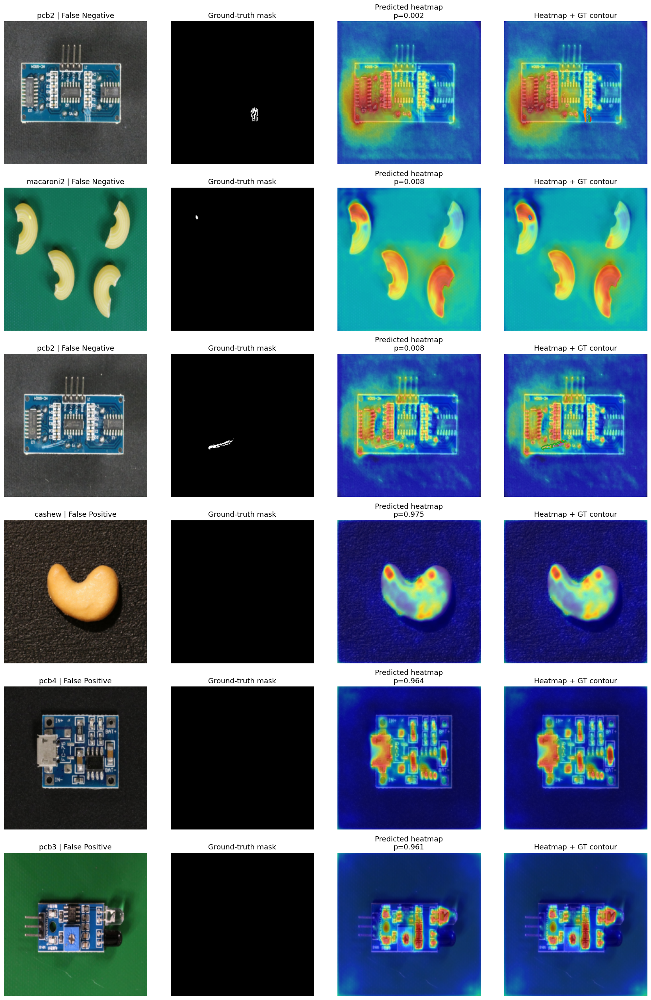

In [83]:
n_show = len(selected_error_indices)

fig, axes = plt.subplots(n_show, 4, figsize=(17, 4.2 * n_show))

if n_show == 1:
    axes = np.expand_dims(axes, axis=0)

for row_idx, idx in enumerate(selected_error_indices):
    row = test_with_preds.iloc[idx]
    
    img = Image.open(row["image_path"]).convert("RGB")
    img_resized = TF.resize(img, (SEG_IMG_SIZE, SEG_IMG_SIZE))
    img_np = np.array(img_resized) / 255.0
    
    gt_mask = glunet_test_masks_true[idx, 0]
    pred_prob = glunet_test_masks_prob[idx, 0]
    
    error_type = "False Negative" if (row["target"] == 1 and row["pred_label"] == 0) else "False Positive"
    
    contours = measure.find_contours(gt_mask, 0.5)
    
    axes[row_idx, 0].imshow(img_np)
    axes[row_idx, 0].set_title(f"{row['object']} | {error_type}", fontsize=13)
    axes[row_idx, 0].axis("off")
    
    axes[row_idx, 1].imshow(gt_mask, cmap="gray")
    axes[row_idx, 1].set_title("Ground-truth mask", fontsize=13)
    axes[row_idx, 1].axis("off")
    
    axes[row_idx, 2].imshow(img_np)
    axes[row_idx, 2].imshow(pred_prob, alpha=0.55, cmap="jet")
    axes[row_idx, 2].set_title(f"Predicted heatmap\np={row['prob_anomaly']:.3f}", fontsize=13)
    axes[row_idx, 2].axis("off")
    
    axes[row_idx, 3].imshow(img_np)
    axes[row_idx, 3].imshow(pred_prob, alpha=0.55, cmap="jet")
    
    for contour in contours:
        axes[row_idx, 3].plot(contour[:, 1], contour[:, 0], linewidth=2.0)
    
    axes[row_idx, 3].set_title("Heatmap + GT contour", fontsize=13)
    axes[row_idx, 3].axis("off")

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_glunet_failure_cases_heatmap.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [84]:
from sklearn.metrics import f1_score, precision_score, recall_score, balanced_accuracy_score
import numpy as np
import pandas as pd

glunet_val_pred_path = f"{output_dir}/glunet_resnet18_lambda05_e10_val_predictions.csv"
glunet_val_preds = pd.read_csv(glunet_val_pred_path)

thresholds = np.round(np.arange(0.05, 0.96, 0.01), 2)

rows = []

y_true_val = glunet_val_preds["true_label"].values
y_prob_val = glunet_val_preds["prob_anomaly"].values

for th in thresholds:
    y_pred_th = (y_prob_val >= th).astype(int)
    
    rows.append({
        "threshold": th,
        "precision": precision_score(y_true_val, y_pred_th, zero_division=0),
        "recall": recall_score(y_true_val, y_pred_th, zero_division=0),
        "f1": f1_score(y_true_val, y_pred_th, zero_division=0),
        "balanced_accuracy": balanced_accuracy_score(y_true_val, y_pred_th)
    })

threshold_tuning_df = pd.DataFrame(rows)

best_threshold_row = threshold_tuning_df.sort_values(
    ["f1", "balanced_accuracy"],
    ascending=False
).head(1)

threshold_tuning_df.to_csv(
    f"{output_dir}/table_glunet_validation_threshold_tuning.csv",
    index=False
)

print("Best validation threshold:")
display(best_threshold_row)

threshold_tuning_df.head()

Best validation threshold:


,threshold,precision,recall,f1,balanced_accuracy
55,0.6,0.793893,0.722222,0.756364,0.849423


,threshold,precision,recall,f1,balanced_accuracy
0,0.05,0.355795,0.916667,0.512621,0.854870
1,0.06,0.372159,0.909722,0.528226,0.859190
2,0.07,0.387574,0.909722,0.543568,0.865251
3,0.08,0.404984,0.902778,0.559140,0.868705
4,0.09,0.426230,0.902778,0.579065,0.875631


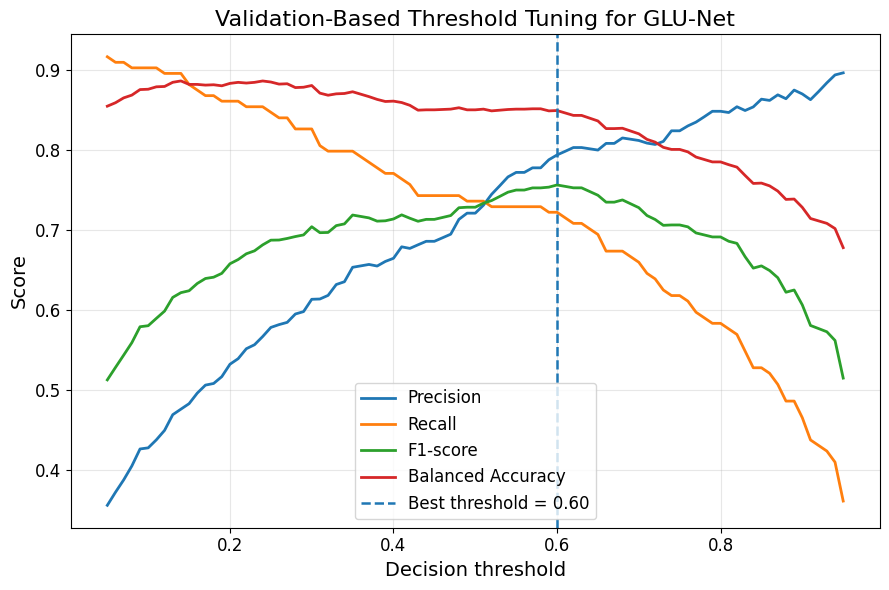

In [85]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 6))

plt.plot(threshold_tuning_df["threshold"], threshold_tuning_df["precision"], label="Precision", linewidth=2)
plt.plot(threshold_tuning_df["threshold"], threshold_tuning_df["recall"], label="Recall", linewidth=2)
plt.plot(threshold_tuning_df["threshold"], threshold_tuning_df["f1"], label="F1-score", linewidth=2)
plt.plot(threshold_tuning_df["threshold"], threshold_tuning_df["balanced_accuracy"], label="Balanced Accuracy", linewidth=2)

best_th = float(best_threshold_row["threshold"].iloc[0])
plt.axvline(best_th, linestyle="--", linewidth=1.8, label=f"Best threshold = {best_th:.2f}")

plt.xlabel("Decision threshold", fontsize=14)
plt.ylabel("Score", fontsize=14)
plt.title("Validation-Based Threshold Tuning for GLU-Net", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_glunet_threshold_tuning_validation.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [86]:
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score

best_threshold = float(best_threshold_row["threshold"].iloc[0])

glunet_test_pred_path = f"{output_dir}/official_test_glunet_resnet18_lambda05_e10_predictions.csv"
glunet_test_preds_threshold = pd.read_csv(glunet_test_pred_path)

y_true_test = glunet_test_preds_threshold["true_label"].values
y_prob_test = glunet_test_preds_threshold["prob_anomaly"].values
y_pred_default = glunet_test_preds_threshold["pred_label"].values
y_pred_opt = (y_prob_test >= best_threshold).astype(int)

threshold_test_comparison = pd.DataFrame([
    {
        "Threshold strategy": "Default threshold (0.50)",
        "Threshold": 0.50,
        "Accuracy": accuracy_score(y_true_test, y_pred_default),
        "Balanced Accuracy": balanced_accuracy_score(y_true_test, y_pred_default),
        "Precision": precision_score(y_true_test, y_pred_default, zero_division=0),
        "Recall": recall_score(y_true_test, y_pred_default, zero_division=0),
        "F1-score": f1_score(y_true_test, y_pred_default, zero_division=0),
        "ROC-AUC": roc_auc_score(y_true_test, y_prob_test),
        "PR-AUC": average_precision_score(y_true_test, y_prob_test)
    },
    {
        "Threshold strategy": "Validation-optimized threshold",
        "Threshold": best_threshold,
        "Accuracy": accuracy_score(y_true_test, y_pred_opt),
        "Balanced Accuracy": balanced_accuracy_score(y_true_test, y_pred_opt),
        "Precision": precision_score(y_true_test, y_pred_opt, zero_division=0),
        "Recall": recall_score(y_true_test, y_pred_opt, zero_division=0),
        "F1-score": f1_score(y_true_test, y_pred_opt, zero_division=0),
        "ROC-AUC": roc_auc_score(y_true_test, y_prob_test),
        "PR-AUC": average_precision_score(y_true_test, y_prob_test)
    }
])

metric_cols = [
    "Accuracy", "Balanced Accuracy", "Precision", "Recall",
    "F1-score", "ROC-AUC", "PR-AUC"
]

threshold_test_comparison[metric_cols] = threshold_test_comparison[metric_cols].round(4)

threshold_test_comparison.to_csv(
    f"{output_dir}/table_glunet_test_threshold_comparison.csv",
    index=False
)

threshold_test_comparison

,Threshold strategy,Threshold,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC
0,Default threshold (0.50),0.5,0.9506,0.8810,0.7692,0.7917,0.7803,0.9686,0.8655
1,Validation-optimized threshold,0.6,0.9524,0.8647,0.8058,0.7521,0.7780,0.9686,0.8655


In [87]:
import os
import pandas as pd

output_files = []

for root, dirs, files in os.walk(output_dir):
    for f in files:
        full_path = os.path.join(root, f)
        output_files.append({
            "file": f,
            "path": full_path,
            "size_kb": round(os.path.getsize(full_path) / 1024, 2)
        })

output_files_df = pd.DataFrame(output_files).sort_values("file")

output_files_df.to_csv(
    f"{output_dir}/table_output_files_inventory.csv",
    index=False
)

output_files_df

,file,path,size_kb
59,figure_category_level_f1_comparison.png,/kaggle/working/visa_outputs/figure_category_l...,229.80
43,figure_glunet_category_level_performance.png,/kaggle/working/visa_outputs/figure_glunet_cat...,174.90
93,figure_glunet_failure_cases_heatmap.png,/kaggle/working/visa_outputs/figure_glunet_fai...,2222.26
73,figure_glunet_heatmap_gt_contour_examples.png,/kaggle/working/visa_outputs/figure_glunet_hea...,1999.01
55,figure_glunet_localization_examples.png,/kaggle/working/visa_outputs/figure_glunet_loc...,2358.63
...,...,...,...
13,table_glunet_category_level_performance.csv,/kaggle/working/visa_outputs/table_glunet_cate...,0.78
8,table_glunet_test_threshold_comparison.csv,/kaggle/working/visa_outputs/table_glunet_test...,0.25
29,table_glunet_validation_threshold_tuning.csv,/kaggle/working/visa_outputs/table_glunet_vali...,7.07
20,table_mask_threshold_tuning_sgglanet_v1.csv,/kaggle/working/visa_outputs/table_mask_thresh...,4.37


In [88]:
important_tables = [
    "table_3_finetuned_baseline_architecture_comparison.csv",
    "table_4_architecture_ablation_comparison_paper.csv",
    "table_5_official_test_final_comparison.csv",
    "table_confusion_matrix_summary.csv",
    "table_category_level_performance_official_test.csv",
    "table_glunet_category_level_performance.csv",
    "table_glunet_test_threshold_comparison.csv"
]

for table in important_tables:
    path = f"{output_dir}/{table}"
    print("\n" + "="*80)
    print(table, "exists:", os.path.exists(path))
    
    if os.path.exists(path):
        temp = pd.read_csv(path)
        display(temp.head())


table_3_finetuned_baseline_architecture_comparison.csv exists: False

table_4_architecture_ablation_comparison_paper.csv exists: True


,Experiment,Architecture,Backbone,Epochs,Best epoch,Loss strategy,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC,Anomaly-only IoU,Anomaly-only Dice,Trainable Parameters,Total Parameters,Time (min)
0,glunet_resnet18_lambda05_e10,GLU-Net,resnet18,10,10,balanced_global_local_loss,0.9392,0.8503,0.7211,0.7361,0.7285,0.9409,0.7956,0.1093,0.1644,14452963,14452963,11.38
1,sgglanet_convnext_lambda025_e5,SG-GLANet,convnext_tiny,5,5,multi_task_loss,0.9069,0.8716,0.5535,0.8264,0.6630,0.9302,0.7324,0.0079,0.0120,30173987,30173987,5.99
2,baseline_convnext_tiny,Image-level baseline,convnext_tiny,5,4,weighted_cross_entropy,0.9184,0.8265,0.6145,0.7083,0.6581,0.9287,0.6873,NaN,NaN,27821666,27821666,5.90
3,baseline_resnet18,Image-level baseline,resnet18,5,5,weighted_cross_entropy,0.9061,0.8378,0.5567,0.7500,0.6391,0.9230,0.7124,NaN,NaN,11177538,11177538,5.28
4,sgglanet_v2_convnext_lambda025_e5,SG-GLANet,convnext_tiny,5,5,anomaly_focused_segmentation,0.8992,0.8430,0.5311,0.7708,0.6289,0.9172,0.7015,0.0003,0.0005,30173987,30173987,5.87



table_5_official_test_final_comparison.csv exists: True


,Experiment,Model type,Backbone,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC,Anomaly-only IoU,Anomaly-only Dice
0,glunet_resnet18_lambda05_e10,glunet,resnet18,0.9506,0.8810,0.7692,0.7917,0.7803,0.9686,0.8655,0.1025,0.1556
1,sgglanet_convnext_lambda025_e5,sgglanet,convnext_tiny,0.9166,0.8975,0.5828,0.8729,0.6989,0.9498,0.8105,0.0078,0.0115
2,baseline_convnext_tiny,image_level_baseline,convnext_tiny,0.9238,0.8486,0.6311,0.7521,0.6863,0.9403,0.7712,NaN,NaN



table_confusion_matrix_summary.csv exists: True


,Model,TN,FP,FN,TP
0,Baseline ConvNeXt-Tiny,3637,211,119,361
1,SG-GLANet,3548,300,61,419
2,GLU-Net,3734,114,100,380



table_category_level_performance_official_test.csv exists: True


,Model,Object category,N,Normal,Anomaly,Accuracy,Balanced Accuracy,Precision,Recall,F1-score
0,Baseline ConvNeXt-Tiny,candle,440,400,40,0.9045,0.8688,0.4853,0.825,0.6111
1,Baseline ConvNeXt-Tiny,capsules,281,241,40,0.8612,0.8044,0.5088,0.725,0.5979
2,Baseline ConvNeXt-Tiny,cashew,240,200,40,0.9375,0.9625,0.7273,1.000,0.8421
3,Baseline ConvNeXt-Tiny,chewinggum,241,201,40,0.9253,0.9052,0.7292,0.875,0.7955
4,Baseline ConvNeXt-Tiny,fryum,240,200,40,0.9125,0.8175,0.7714,0.675,0.7200



table_glunet_category_level_performance.csv exists: True


,Model,Object category,N,Normal,Anomaly,Accuracy,Balanced Accuracy,Precision,Recall,F1-score
0,GLU-Net,chewinggum,241,201,40,0.9710,0.9325,0.9459,0.875,0.9091
1,GLU-Net,fryum,240,200,40,0.9625,0.8975,0.9697,0.800,0.8767
2,GLU-Net,pipe_fryum,240,200,40,0.9625,0.8875,1.0000,0.775,0.8732
3,GLU-Net,cashew,240,200,40,0.9417,0.9350,0.7708,0.925,0.8409
4,GLU-Net,pcb4,442,402,40,0.9638,0.9688,0.7222,0.975,0.8298



table_glunet_test_threshold_comparison.csv exists: True


,Threshold strategy,Threshold,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC
0,Default threshold (0.50),0.5,0.9506,0.8810,0.7692,0.7917,0.7803,0.9686,0.8655
1,Validation-optimized threshold,0.6,0.9524,0.8647,0.8058,0.7521,0.7780,0.9686,0.8655


In [89]:
important_figures = [
    "figure_official_test_confusion_matrices.png",
    "figure_official_test_confusion_matrices_normalized.png",
    "figure_official_test_roc_curves.png",
    "figure_official_test_pr_curves.png",
    "figure_glunet_category_level_performance.png",
    "figure_category_level_f1_comparison.png",
    "figure_glunet_heatmap_gt_contour_examples.png",
    "figure_glunet_failure_cases_heatmap.png",
    "figure_glunet_threshold_tuning_validation.png"
]

for fig in important_figures:
    path = f"{output_dir}/{fig}"
    print(fig, "exists:", os.path.exists(path), "|", path)

figure_official_test_confusion_matrices.png exists: True | /kaggle/working/visa_outputs/figure_official_test_confusion_matrices.png
figure_official_test_confusion_matrices_normalized.png exists: True | /kaggle/working/visa_outputs/figure_official_test_confusion_matrices_normalized.png
figure_official_test_roc_curves.png exists: True | /kaggle/working/visa_outputs/figure_official_test_roc_curves.png
figure_official_test_pr_curves.png exists: True | /kaggle/working/visa_outputs/figure_official_test_pr_curves.png
figure_glunet_category_level_performance.png exists: True | /kaggle/working/visa_outputs/figure_glunet_category_level_performance.png
figure_category_level_f1_comparison.png exists: True | /kaggle/working/visa_outputs/figure_category_level_f1_comparison.png
figure_glunet_heatmap_gt_contour_examples.png exists: True | /kaggle/working/visa_outputs/figure_glunet_heatmap_gt_contour_examples.png
figure_glunet_failure_cases_heatmap.png exists: True | /kaggle/working/visa_outputs/figure

In [90]:
# finetune_paper_table bellekte varsa doğrudan kaydet
if "finetune_paper_table" in globals():
    finetune_paper_table.to_csv(
        f"{output_dir}/table_3_finetuned_baseline_architecture_comparison.csv",
        index=False
    )
    display(finetune_paper_table)

# Eğer bellekte yoksa ham sonuç dosyasından yeniden oluştur
else:
    finetune_results_df = pd.read_csv(
        f"{output_dir}/table_finetuning_results_combined.csv"
    )

    finetune_paper_table = finetune_results_df[
        [
            "model",
            "best_epoch",
            "val_accuracy",
            "val_balanced_accuracy",
            "val_precision",
            "val_recall",
            "val_f1",
            "val_roc_auc",
            "val_pr_auc",
            "trainable_params",
            "total_params",
            "time_minutes"
        ]
    ].copy()

    finetune_paper_table.columns = [
        "Model",
        "Best epoch",
        "Accuracy",
        "Balanced Accuracy",
        "Precision",
        "Recall",
        "F1-score",
        "ROC-AUC",
        "PR-AUC",
        "Trainable Parameters",
        "Total Parameters",
        "Time (min)"
    ]

    metric_cols = [
        "Accuracy",
        "Balanced Accuracy",
        "Precision",
        "Recall",
        "F1-score",
        "ROC-AUC",
        "PR-AUC"
    ]

    finetune_paper_table[metric_cols] = finetune_paper_table[metric_cols].round(4)
    finetune_paper_table["Time (min)"] = finetune_paper_table["Time (min)"].round(2)

    finetune_paper_table.to_csv(
        f"{output_dir}/table_3_finetuned_baseline_architecture_comparison.csv",
        index=False
    )

    display(finetune_paper_table)

,Model,Best epoch,Accuracy,Balanced Accuracy,Precision,Recall,F1-score,ROC-AUC,PR-AUC,Trainable Parameters,Total Parameters,Time (min)
0,convnext_tiny,4,0.9184,0.8265,0.6145,0.7083,0.6581,0.9287,0.6873,27821666,27821666,5.90
4,resnet18,5,0.9061,0.8378,0.5567,0.7500,0.6391,0.9230,0.7124,11177538,11177538,5.28
1,densenet121,5,0.8961,0.8048,0.5238,0.6875,0.5946,0.9064,0.6649,6955906,6955906,5.71
3,mobilenet_v3_large,5,0.8353,0.7676,0.3684,0.6806,0.4780,0.8686,0.5732,4204594,4204594,5.52
2,efficientnet_b0,5,0.8299,0.7402,0.3502,0.6250,0.4489,0.8582,0.5104,4010110,4010110,5.52


In [91]:
import os

path = f"{output_dir}/table_3_finetuned_baseline_architecture_comparison.csv"
print("exists:", os.path.exists(path))
print(path)

exists: True
/kaggle/working/visa_outputs/table_3_finetuned_baseline_architecture_comparison.csv


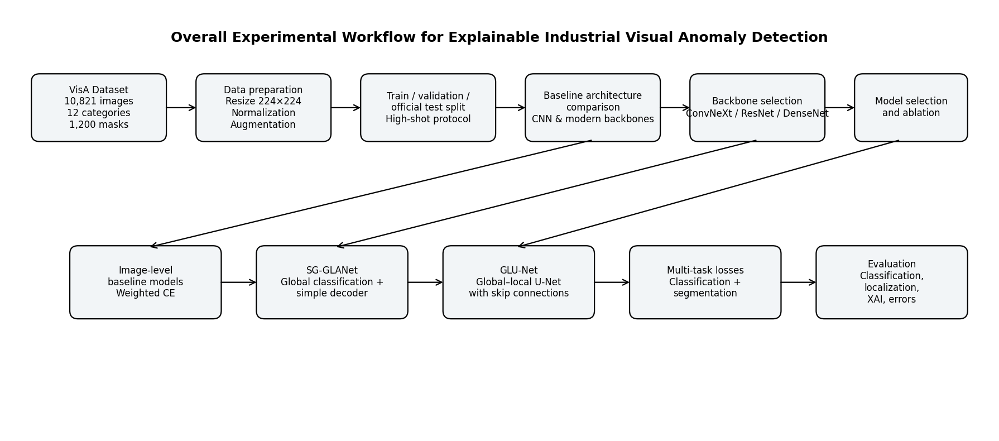

In [92]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch
import os

output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

fig, ax = plt.subplots(figsize=(18, 8))
ax.set_xlim(0, 18)
ax.set_ylim(0, 8)
ax.axis("off")

def add_box(x, y, w, h, text, fontsize=12):
    box = FancyBboxPatch(
        (x, y), w, h,
        boxstyle="round,pad=0.03,rounding_size=0.15",
        linewidth=1.6,
        edgecolor="black",
        facecolor="#F2F5F7"
    )
    ax.add_patch(box)
    ax.text(
        x + w/2, y + h/2, text,
        ha="center", va="center",
        fontsize=fontsize,
        wrap=True
    )

def add_arrow(x1, y1, x2, y2):
    arrow = FancyArrowPatch(
        (x1, y1), (x2, y2),
        arrowstyle="->",
        mutation_scale=18,
        linewidth=1.6,
        color="black"
    )
    ax.add_patch(arrow)

# Top row
add_box(0.5, 5.5, 2.4, 1.2, "VisA Dataset\n10,821 images\n12 categories\n1,200 masks")
add_box(3.5, 5.5, 2.4, 1.2, "Data preparation\nResize 224×224\nNormalization\nAugmentation")
add_box(6.5, 5.5, 2.4, 1.2, "Train / validation /\nofficial test split\nHigh-shot protocol")
add_box(9.5, 5.5, 2.4, 1.2, "Baseline architecture\ncomparison\nCNN & modern backbones")
add_box(12.5, 5.5, 2.4, 1.2, "Backbone selection\nConvNeXt / ResNet / DenseNet")
add_box(15.5, 5.5, 2.0, 1.2, "Model selection\nand ablation")

# Bottom row
add_box(1.2, 2.2, 2.7, 1.3, "Image-level\nbaseline models\nWeighted CE")
add_box(4.6, 2.2, 2.7, 1.3, "SG-GLANet\nGlobal classification +\nsimple decoder")
add_box(8.0, 2.2, 2.7, 1.3, "GLU-Net\nGlobal–local U-Net\nwith skip connections")
add_box(11.4, 2.2, 2.7, 1.3, "Multi-task losses\nClassification +\nsegmentation")
add_box(14.8, 2.2, 2.7, 1.3, "Evaluation\nClassification,\nlocalization,\nXAI, errors")

# Arrows top
add_arrow(2.9, 6.1, 3.5, 6.1)
add_arrow(5.9, 6.1, 6.5, 6.1)
add_arrow(8.9, 6.1, 9.5, 6.1)
add_arrow(11.9, 6.1, 12.5, 6.1)
add_arrow(14.9, 6.1, 15.5, 6.1)

# Arrows down
add_arrow(10.7, 5.5, 2.6, 3.5)
add_arrow(13.7, 5.5, 6.0, 3.5)
add_arrow(16.3, 5.5, 9.3, 3.5)

# Arrows bottom
add_arrow(3.9, 2.85, 4.6, 2.85)
add_arrow(7.3, 2.85, 8.0, 2.85)
add_arrow(10.7, 2.85, 11.4, 2.85)
add_arrow(14.1, 2.85, 14.8, 2.85)

ax.text(
    9, 7.4,
    "Overall Experimental Workflow for Explainable Industrial Visual Anomaly Detection",
    ha="center",
    va="center",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_1_overall_research_workflow.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    f"{output_dir}/figure_1_overall_research_workflow.pdf",
    bbox_inches="tight"
)

plt.show()

In [93]:
split_methods_table = pd.DataFrame({
    "Split": ["Training", "Validation", "Official test"],
    "Normal images": [
        (screen_train_df["target"] == 0).sum(),
        (screen_val_df["target"] == 0).sum(),
        (test_df["target"] == 0).sum()
    ],
    "Anomalous images": [
        (screen_train_df["target"] == 1).sum(),
        (screen_val_df["target"] == 1).sum(),
        (test_df["target"] == 1).sum()
    ]
})

split_methods_table["Total images"] = (
    split_methods_table["Normal images"] +
    split_methods_table["Anomalous images"]
)

split_methods_table["Anomaly ratio (%)"] = (
    split_methods_table["Anomalous images"] /
    split_methods_table["Total images"] * 100
).round(2)

split_methods_table.to_csv(
    f"{output_dir}/table_2_data_split_methods.csv",
    index=False
)

split_methods_table

,Split,Normal images,Anomalous images,Total images,Anomaly ratio (%)
0,Training,4618,576,5194,11.09
1,Validation,1155,144,1299,11.09
2,Official test,3848,480,4328,11.09


In [94]:
experimental_config_table = pd.DataFrame({
    "Component": [
        "Image size",
        "Baseline batch size",
        "Multi-task batch size",
        "Optimizer",
        "Learning rate",
        "Weight decay",
        "Scheduler",
        "Baseline training epochs",
        "GLU-Net training epochs",
        "Model selection criterion",
        "Classification loss",
        "Segmentation loss",
        "Final test protocol",
        "Hardware"
    ],
    "Setting": [
        "224 × 224 pixels",
        "64",
        "32",
        "AdamW",
        "3e-5",
        "1e-4",
        "Cosine annealing",
        "5 epochs",
        "10 epochs",
        "Best validation F1-score",
        "Weighted cross-entropy",
        "Weighted BCE + Dice loss",
        "Official test set used only for final evaluation",
        "Kaggle GPU, Tesla T4"
    ]
})

experimental_config_table.to_csv(
    f"{output_dir}/table_experimental_configuration_methods.csv",
    index=False
)

experimental_config_table

,Component,Setting
0,Image size,224 × 224 pixels
1,Baseline batch size,64
2,Multi-task batch size,32
3,Optimizer,AdamW
4,Learning rate,3e-5
5,Weight decay,1e-4
6,Scheduler,Cosine annealing
7,Baseline training epochs,5 epochs
8,GLU-Net training epochs,10 epochs
9,Model selection criterion,Best validation F1-score


In [97]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

base_path = "/kaggle/input/datasets/tensura3607/amazon-visa-anomaly"
output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

csv_path = f"{base_path}/split_csv/2cls_highshot.csv"

source_df = pd.read_csv(csv_path)

source_df["image_path"] = source_df["image"].apply(
    lambda x: os.path.join(base_path, x)
)

source_df["mask_path"] = source_df["mask"].apply(
    lambda x: os.path.join(base_path, x) if pd.notna(x) else None
)

source_df["target"] = source_df["label"].map({
    "normal": 0,
    "anomaly": 1
})

print("source_df shape:", source_df.shape)
print(source_df[["object", "split", "label", "image_path", "mask_path", "target"]].head())
print("\nLabel distribution:")
print(source_df["label"].value_counts())
print("\nMissing image paths:", (~source_df["image_path"].apply(os.path.exists)).sum())
print("Missing non-null mask paths:", source_df["mask_path"].dropna().apply(lambda x: not os.path.exists(x)).sum())

source_df shape: (10821, 8)
   object  split   label                                         image_path  \
0  candle  train  normal  /kaggle/input/datasets/tensura3607/amazon-visa...   
1  candle  train  normal  /kaggle/input/datasets/tensura3607/amazon-visa...   
2  candle  train  normal  /kaggle/input/datasets/tensura3607/amazon-visa...   
3  candle  train  normal  /kaggle/input/datasets/tensura3607/amazon-visa...   
4  candle  train  normal  /kaggle/input/datasets/tensura3607/amazon-visa...   

  mask_path  target  
0      None       0  
1      None       0  
2      None       0  
3      None       0  
4      None       0  

Label distribution:
label
normal     9621
anomaly    1200
Name: count, dtype: int64

Missing image paths: 0
Missing non-null mask paths: 0


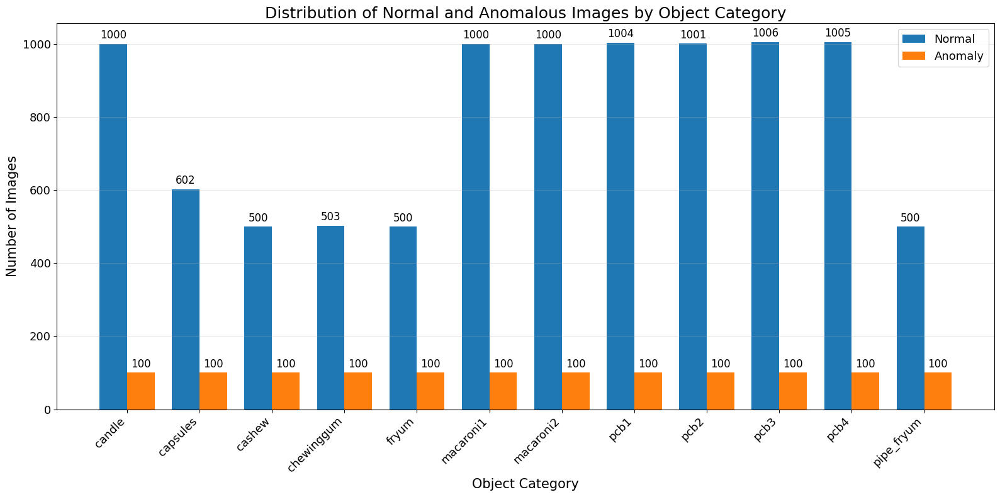

Saved:
/kaggle/working/visa_outputs/figure_2_category_distribution.png
/kaggle/working/visa_outputs/figure_2_category_distribution.pdf


label,object,anomaly,normal
0,candle,100,1000
1,capsules,100,602
2,cashew,100,500
3,chewinggum,100,503
4,fryum,100,500
5,macaroni1,100,1000
6,macaroni2,100,1000
7,pcb1,100,1004
8,pcb2,100,1001
9,pcb3,100,1006


In [98]:
# Figure 2: Distribution of normal and anomalous images by object category

# Kategori bazlı dağılım
category_dist = (
    source_df.groupby(["object", "label"])
    .size()
    .unstack(fill_value=0)
    .reset_index()
)

# Bazı veri setlerinde label sütunları eksik olabilir diye güvenlik
if "normal" not in category_dist.columns:
    category_dist["normal"] = 0
if "anomaly" not in category_dist.columns:
    category_dist["anomaly"] = 0

# İstenen sıra
object_order = [
    "candle", "capsules", "cashew", "chewinggum", "fryum",
    "macaroni1", "macaroni2", "pcb1", "pcb2", "pcb3", "pcb4", "pipe_fryum"
]

category_dist["object"] = pd.Categorical(
    category_dist["object"],
    categories=object_order,
    ordered=True
)
category_dist = category_dist.sort_values("object").reset_index(drop=True)

x = np.arange(len(category_dist))
width = 0.38

fig, ax = plt.subplots(figsize=(16, 8))

bars1 = ax.bar(
    x - width/2,
    category_dist["normal"],
    width,
    label="Normal"
)

bars2 = ax.bar(
    x + width/2,
    category_dist["anomaly"],
    width,
    label="Anomaly"
)

ax.set_title(
    "Distribution of Normal and Anomalous Images by Object Category",
    fontsize=18
)
ax.set_xlabel("Object Category", fontsize=15)
ax.set_ylabel("Number of Images", fontsize=15)

ax.set_xticks(x)
ax.set_xticklabels(category_dist["object"], rotation=45, ha="right", fontsize=13)
ax.tick_params(axis="y", labelsize=13)

ax.legend(fontsize=13)
ax.grid(axis="y", alpha=0.3)

# Sütun üstü değer yazıları
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            height + 8,
            f"{int(height)}",
            ha="center",
            va="bottom",
            fontsize=12
        )

plt.tight_layout()

png_path = f"{output_dir}/figure_2_category_distribution.png"
pdf_path = f"{output_dir}/figure_2_category_distribution.pdf"

plt.savefig(png_path, dpi=300, bbox_inches="tight")
plt.savefig(pdf_path, bbox_inches="tight")
plt.show()

print("Saved:")
print(png_path)
print(pdf_path)

category_dist

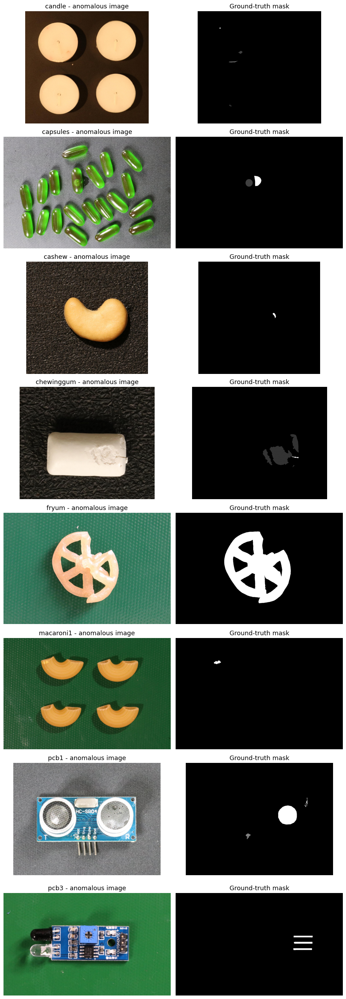

Saved:
/kaggle/working/visa_outputs/figure_3_anomaly_mask_examples.png
/kaggle/working/visa_outputs/figure_3_anomaly_mask_examples.pdf


,object,image_path,mask_path
0,candle,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...
1,capsules,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...
2,cashew,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...
3,chewinggum,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...
4,fryum,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...
5,macaroni1,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...
6,pcb1,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...
7,pcb3,/kaggle/input/datasets/tensura3607/amazon-visa...,/kaggle/input/datasets/tensura3607/amazon-visa...


In [99]:
# Figure 3: Representative anomalous samples and corresponding ground-truth masks

# Gerekli sütun kontrolü
needed_cols = {"object", "label", "image_path", "mask_path"}
missing_cols = needed_cols - set(source_df.columns)
if missing_cols:
    raise ValueError(f"Eksik sütun(lar): {missing_cols}")

anomaly_df = source_df[
    (source_df["label"] == "anomaly") &
    (source_df["mask_path"].notna())
].copy()

if len(anomaly_df) == 0:
    raise ValueError("mask_path dolu anomalili örnek bulunamadı.")

preferred_objects = [
    "candle", "capsules", "cashew", "chewinggum",
    "fryum", "macaroni1", "pcb1", "pcb3"
]

selected_rows = []

for obj in preferred_objects:
    temp = anomaly_df[anomaly_df["object"] == obj]
    if len(temp) > 0:
        selected_rows.append(temp.iloc[0])

# Eğer az geldiyse kalanlardan tamamla
if len(selected_rows) < 8:
    used_idx = [row.name for row in selected_rows]
    remaining = anomaly_df.drop(index=used_idx, errors="ignore")
    need_n = 8 - len(selected_rows)
    selected_rows.extend([row for _, row in remaining.head(need_n).iterrows()])

selected_df = pd.DataFrame(selected_rows).reset_index(drop=True)

n_examples = len(selected_df)
fig, axes = plt.subplots(n_examples, 2, figsize=(10, 3.6 * n_examples))

if n_examples == 1:
    axes = np.array([axes])

for i in range(n_examples):
    row = selected_df.iloc[i]

    # image
    img = Image.open(row["image_path"]).convert("RGB")
    img_np = np.array(img)

    # mask
    mask = Image.open(row["mask_path"]).convert("L")
    mask_np = np.array(mask)

    axes[i, 0].imshow(img_np)
    axes[i, 0].set_title(f"{row['object']} - anomalous image", fontsize=13)
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask_np, cmap="gray")
    axes[i, 1].set_title("Ground-truth mask", fontsize=13)
    axes[i, 1].axis("off")

plt.tight_layout()

png_path = f"{output_dir}/figure_3_anomaly_mask_examples.png"
pdf_path = f"{output_dir}/figure_3_anomaly_mask_examples.pdf"

plt.savefig(png_path, dpi=300, bbox_inches="tight")
plt.savefig(pdf_path, bbox_inches="tight")
plt.show()

print("Saved:")
print(png_path)
print(pdf_path)

selected_df[["object", "image_path", "mask_path"]]

       object                                         image_path  \
0      candle  /kaggle/input/datasets/tensura3607/amazon-visa...   
1    capsules  /kaggle/input/datasets/tensura3607/amazon-visa...   
2      cashew  /kaggle/input/datasets/tensura3607/amazon-visa...   
3  chewinggum  /kaggle/input/datasets/tensura3607/amazon-visa...   
4       fryum  /kaggle/input/datasets/tensura3607/amazon-visa...   
5        pcb1  /kaggle/input/datasets/tensura3607/amazon-visa...   

                                           mask_path  
0  /kaggle/input/datasets/tensura3607/amazon-visa...  
1  /kaggle/input/datasets/tensura3607/amazon-visa...  
2  /kaggle/input/datasets/tensura3607/amazon-visa...  
3  /kaggle/input/datasets/tensura3607/amazon-visa...  
4  /kaggle/input/datasets/tensura3607/amazon-visa...  
5  /kaggle/input/datasets/tensura3607/amazon-visa...  


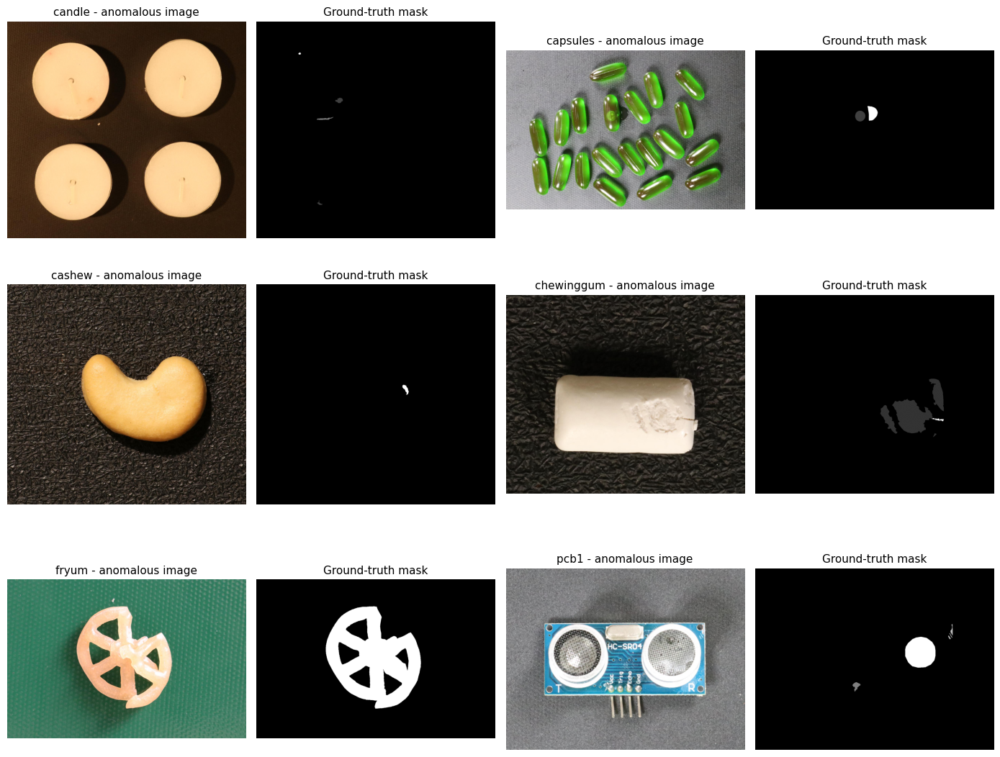

Saved:
/kaggle/working/visa_outputs/figure_3_anomaly_mask_examples.png
/kaggle/working/visa_outputs/figure_3_anomaly_mask_examples.pdf


In [100]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Paths
base_path = "/kaggle/input/datasets/tensura3607/amazon-visa-anomaly"
output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

# Load metadata
csv_path = f"{base_path}/split_csv/2cls_highshot.csv"
source_df = pd.read_csv(csv_path)

source_df["image_path"] = source_df["image"].apply(
    lambda x: os.path.join(base_path, x)
)
source_df["mask_path"] = source_df["mask"].apply(
    lambda x: os.path.join(base_path, x) if pd.notna(x) else None
)

# Filter anomaly samples with masks
anomaly_df = source_df[
    (source_df["label"] == "anomaly") &
    (source_df["mask_path"].notna())
].copy()

# Preferred categories for diversity
preferred_objects = [
    "candle", "capsules", "cashew",
    "chewinggum", "fryum", "pcb1"
]

selected_rows = []

for obj in preferred_objects:
    temp = anomaly_df[anomaly_df["object"] == obj]
    if len(temp) > 0:
        selected_rows.append(temp.iloc[0])

# If fewer than 6 found, fill from remaining anomaly samples
if len(selected_rows) < 6:
    used_idx = [row.name for row in selected_rows]
    remaining = anomaly_df.drop(index=used_idx, errors="ignore")
    need_n = 6 - len(selected_rows)
    selected_rows.extend([row for _, row in remaining.head(need_n).iterrows()])

selected_df = pd.DataFrame(selected_rows).reset_index(drop=True)

print(selected_df[["object", "image_path", "mask_path"]])

# Compact grid: 3 rows x 4 cols
# Each example occupies 2 columns: [image | mask]
n_examples = len(selected_df)
n_rows = int(np.ceil(n_examples / 2))
n_cols = 4

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3.8 * n_rows))

# If only one row, make axes 2D
if n_rows == 1:
    axes = np.expand_dims(axes, axis=0)

# Turn off all axes first
for ax_row in axes:
    for ax in ax_row:
        ax.axis("off")

for i in range(n_examples):
    row = selected_df.iloc[i]
    
    # Determine subplot position
    r = i // 2
    c_base = (i % 2) * 2  # 0 or 2
    
    # Load image and mask
    img = Image.open(row["image_path"]).convert("RGB")
    img_np = np.array(img)
    
    mask = Image.open(row["mask_path"]).convert("L")
    mask_np = np.array(mask)
    
    # Left panel: image
    axes[r, c_base].imshow(img_np)
    axes[r, c_base].set_title(
        f"{row['object']} - anomalous image",
        fontsize=11
    )
    axes[r, c_base].axis("off")
    
    # Right panel: mask
    axes[r, c_base + 1].imshow(mask_np, cmap="gray")
    axes[r, c_base + 1].set_title(
        "Ground-truth mask",
        fontsize=11
    )
    axes[r, c_base + 1].axis("off")

plt.tight_layout()

png_path = f"{output_dir}/figure_3_anomaly_mask_examples.png"
pdf_path = f"{output_dir}/figure_3_anomaly_mask_examples.pdf"

plt.savefig(png_path, dpi=300, bbox_inches="tight")
plt.savefig(pdf_path, bbox_inches="tight")
plt.show()

print("Saved:")
print(png_path)
print(pdf_path)

In [101]:
import os
import pandas as pd
import numpy as np

base_path = "/kaggle/input/datasets/tensura3607/amazon-visa-anomaly"
output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

# Resmi split dosyasını oku
csv_path = f"{base_path}/split_csv/2cls_highshot.csv"
df_table1 = pd.read_csv(csv_path)

df_table1["image_path"] = df_table1["image"].apply(
    lambda x: os.path.join(base_path, x)
)

df_table1["mask_path"] = df_table1["mask"].apply(
    lambda x: os.path.join(base_path, x) if pd.notna(x) else None
)

df_table1["target"] = df_table1["label"].map({
    "normal": 0,
    "anomaly": 1
})

# Object category × split × label dağılımı
category_table = (
    df_table1
    .groupby(["object", "split", "label"])
    .size()
    .reset_index(name="count")
)

category_pivot = (
    category_table
    .pivot_table(
        index="object",
        columns=["split", "label"],
        values="count",
        fill_value=0
    )
)

category_pivot.columns = [
    f"{split}_{label}" for split, label in category_pivot.columns
]

category_pivot = category_pivot.reset_index()

# Eksik olabilecek kolonlara karşı güvenlik
for col in ["train_normal", "train_anomaly", "test_normal", "test_anomaly"]:
    if col not in category_pivot.columns:
        category_pivot[col] = 0

# Toplamlar
category_pivot["total_normal"] = (
    category_pivot["train_normal"] + category_pivot["test_normal"]
)

category_pivot["total_anomaly"] = (
    category_pivot["train_anomaly"] + category_pivot["test_anomaly"]
)

category_pivot["total_images"] = (
    category_pivot["total_normal"] + category_pivot["total_anomaly"]
)

category_pivot["anomaly_ratio"] = (
    category_pivot["total_anomaly"] / category_pivot["total_images"] * 100
)

# Makalelik tablo
table_1 = category_pivot[
    [
        "object",
        "train_normal",
        "train_anomaly",
        "test_normal",
        "test_anomaly",
        "total_normal",
        "total_anomaly",
        "total_images",
        "anomaly_ratio"
    ]
].copy()

table_1.columns = [
    "Object category",
    "Train normal",
    "Train anomaly",
    "Test normal",
    "Test anomaly",
    "Total normal",
    "Total anomaly",
    "Total images",
    "Anomaly ratio (%)"
]

# Sıralama
object_order = [
    "candle", "capsules", "cashew", "chewinggum", "fryum",
    "macaroni1", "macaroni2", "pcb1", "pcb2", "pcb3", "pcb4", "pipe_fryum"
]

table_1["Object category"] = pd.Categorical(
    table_1["Object category"],
    categories=object_order,
    ordered=True
)

table_1 = table_1.sort_values("Object category").reset_index(drop=True)

# Sayı formatları
count_cols = [
    "Train normal", "Train anomaly", "Test normal", "Test anomaly",
    "Total normal", "Total anomaly", "Total images"
]

table_1[count_cols] = table_1[count_cols].astype(int)
table_1["Anomaly ratio (%)"] = table_1["Anomaly ratio (%)"].round(2)

# Kaydet
table_1_path = f"{output_dir}/table_1_visa_dataset_distribution_by_category_and_split.csv"

table_1.to_csv(table_1_path, index=False)

print("Saved:", table_1_path)

table_1

Saved: /kaggle/working/visa_outputs/table_1_visa_dataset_distribution_by_category_and_split.csv


,Object category,Train normal,Train anomaly,Test normal,Test anomaly,Total normal,Total anomaly,Total images,Anomaly ratio (%)
0,candle,600,60,400,40,1000,100,1100,9.09
1,capsules,361,60,241,40,602,100,702,14.25
2,cashew,300,60,200,40,500,100,600,16.67
3,chewinggum,302,60,201,40,503,100,603,16.58
4,fryum,300,60,200,40,500,100,600,16.67
5,macaroni1,600,60,400,40,1000,100,1100,9.09
6,macaroni2,600,60,400,40,1000,100,1100,9.09
7,pcb1,602,60,402,40,1004,100,1104,9.06
8,pcb2,601,60,400,40,1001,100,1101,9.08
9,pcb3,604,60,402,40,1006,100,1106,9.04


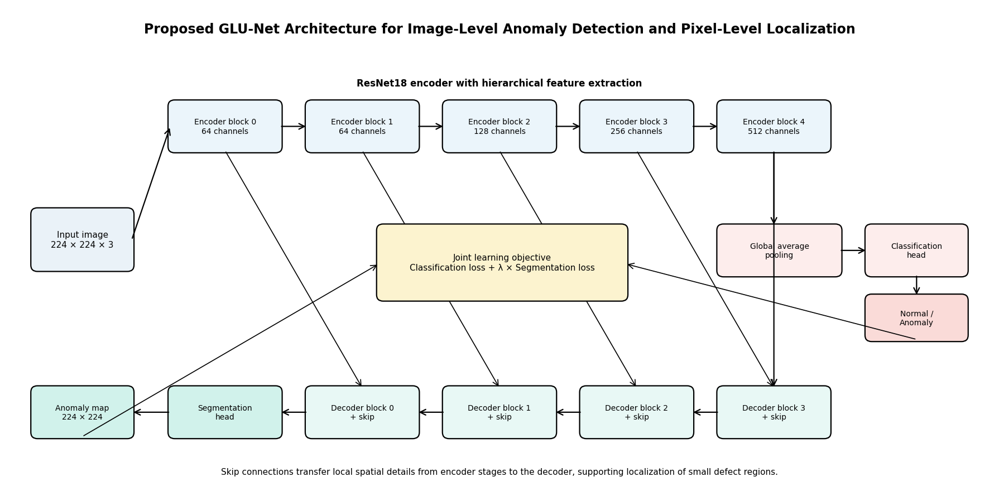

Saved:
/kaggle/working/visa_outputs/figure_4_glunet_architecture.png
/kaggle/working/visa_outputs/figure_4_glunet_architecture.pdf


In [102]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch
import os

output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

fig, ax = plt.subplots(figsize=(18, 9))
ax.set_xlim(0, 18)
ax.set_ylim(0, 9)
ax.axis("off")

def add_box(x, y, w, h, text, facecolor="#F2F5F7", fontsize=11):
    box = FancyBboxPatch(
        (x, y), w, h,
        boxstyle="round,pad=0.04,rounding_size=0.12",
        linewidth=1.6,
        edgecolor="black",
        facecolor=facecolor
    )
    ax.add_patch(box)
    ax.text(
        x + w / 2,
        y + h / 2,
        text,
        ha="center",
        va="center",
        fontsize=fontsize,
        wrap=True
    )

def add_arrow(x1, y1, x2, y2, style="->", lw=1.6):
    arrow = FancyArrowPatch(
        (x1, y1),
        (x2, y2),
        arrowstyle=style,
        mutation_scale=18,
        linewidth=lw,
        color="black"
    )
    ax.add_patch(arrow)

# Title
ax.text(
    9, 8.55,
    "Proposed GLU-Net Architecture for Image-Level Anomaly Detection and Pixel-Level Localization",
    ha="center",
    va="center",
    fontsize=17,
    fontweight="bold"
)

# Input
add_box(0.5, 4.1, 1.8, 1.1, "Input image\n224 × 224 × 3", "#EAF2F8", 11)

# Encoder blocks
add_box(3.0, 6.3, 2.0, 0.9, "Encoder block 0\n64 channels", "#EBF5FB", 10)
add_box(5.5, 6.3, 2.0, 0.9, "Encoder block 1\n64 channels", "#EBF5FB", 10)
add_box(8.0, 6.3, 2.0, 0.9, "Encoder block 2\n128 channels", "#EBF5FB", 10)
add_box(10.5, 6.3, 2.0, 0.9, "Encoder block 3\n256 channels", "#EBF5FB", 10)
add_box(13.0, 6.3, 2.0, 0.9, "Encoder block 4\n512 channels", "#EBF5FB", 10)

# Encoder label
ax.text(
    9, 7.55,
    "ResNet18 encoder with hierarchical feature extraction",
    ha="center",
    va="center",
    fontsize=12,
    fontweight="bold"
)

# Classification branch
add_box(13.0, 4.0, 2.2, 0.9, "Global average\npooling", "#FDEDEC", 10)
add_box(15.7, 4.0, 1.8, 0.9, "Classification\nhead", "#FDEDEC", 10)
add_box(15.7, 2.8, 1.8, 0.8, "Normal /\nAnomaly", "#FADBD8", 10)

# Decoder blocks
add_box(13.0, 1.0, 2.0, 0.9, "Decoder block 3\n+ skip", "#E8F8F5", 10)
add_box(10.5, 1.0, 2.0, 0.9, "Decoder block 2\n+ skip", "#E8F8F5", 10)
add_box(8.0, 1.0, 2.0, 0.9, "Decoder block 1\n+ skip", "#E8F8F5", 10)
add_box(5.5, 1.0, 2.0, 0.9, "Decoder block 0\n+ skip", "#E8F8F5", 10)
add_box(3.0, 1.0, 2.0, 0.9, "Segmentation\nhead", "#D1F2EB", 10)
add_box(0.5, 1.0, 1.8, 0.9, "Anomaly map\n224 × 224", "#D1F2EB", 10)

# Main arrows encoder
add_arrow(2.3, 4.65, 3.0, 6.75)
add_arrow(5.0, 6.75, 5.5, 6.75)
add_arrow(7.5, 6.75, 8.0, 6.75)
add_arrow(10.0, 6.75, 10.5, 6.75)
add_arrow(12.5, 6.75, 13.0, 6.75)

# Classification arrows
add_arrow(14.0, 6.3, 14.0, 4.9)
add_arrow(15.2, 4.45, 15.7, 4.45)
add_arrow(16.6, 4.0, 16.6, 3.6)

# Decoder arrows
add_arrow(14.0, 6.3, 14.0, 1.9)
add_arrow(13.0, 1.45, 12.5, 1.45)
add_arrow(10.5, 1.45, 10.0, 1.45)
add_arrow(8.0, 1.45, 7.5, 1.45)
add_arrow(5.5, 1.45, 5.0, 1.45)
add_arrow(3.0, 1.45, 2.3, 1.45)

# Skip connections
add_arrow(11.5, 6.3, 14.0, 1.9, style="->", lw=1.2)
add_arrow(9.0, 6.3, 11.5, 1.9, style="->", lw=1.2)
add_arrow(6.5, 6.3, 9.0, 1.9, style="->", lw=1.2)
add_arrow(4.0, 6.3, 6.5, 1.9, style="->", lw=1.2)

# Loss box
add_box(
    6.8, 3.55, 4.5, 1.35,
    "Joint learning objective\nClassification loss + λ × Segmentation loss",
    "#FCF3CF",
    11
)

add_arrow(16.6, 2.8, 11.3, 4.2, style="->", lw=1.2)
add_arrow(1.4, 1.0, 6.8, 4.2, style="->", lw=1.2)

# Notes
ax.text(
    9,
    0.35,
    "Skip connections transfer local spatial details from encoder stages to the decoder, supporting localization of small defect regions.",
    ha="center",
    va="center",
    fontsize=11
)

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_4_glunet_architecture.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    f"{output_dir}/figure_4_glunet_architecture.pdf",
    bbox_inches="tight"
)

plt.show()

print("Saved:")
print(f"{output_dir}/figure_4_glunet_architecture.png")
print(f"{output_dir}/figure_4_glunet_architecture.pdf")

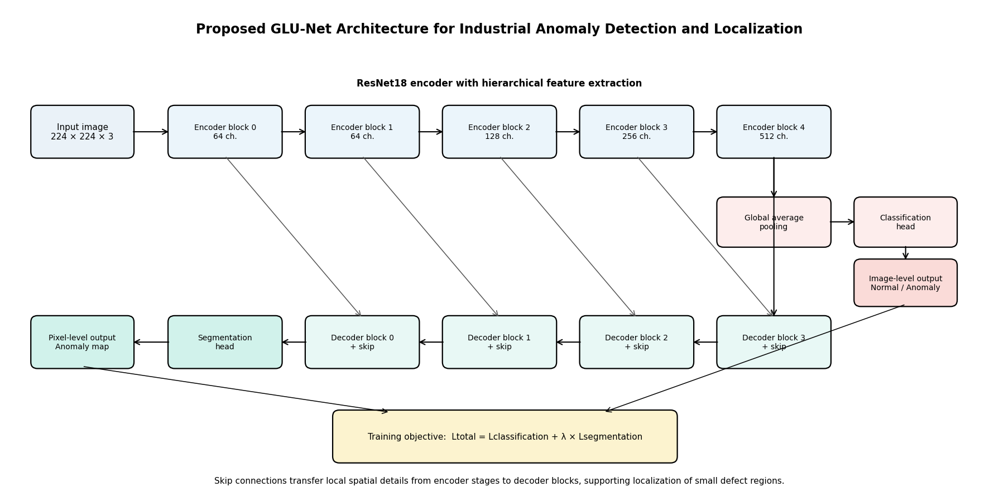

Saved:
/kaggle/working/visa_outputs/figure_4_glunet_architecture.png
/kaggle/working/visa_outputs/figure_4_glunet_architecture.pdf


In [103]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch
import os

output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

fig, ax = plt.subplots(figsize=(18, 9))
ax.set_xlim(0, 18)
ax.set_ylim(0, 9)
ax.axis("off")

def add_box(x, y, w, h, text, facecolor="#F2F5F7", fontsize=11):
    box = FancyBboxPatch(
        (x, y), w, h,
        boxstyle="round,pad=0.04,rounding_size=0.12",
        linewidth=1.6,
        edgecolor="black",
        facecolor=facecolor
    )
    ax.add_patch(box)
    ax.text(
        x + w / 2,
        y + h / 2,
        text,
        ha="center",
        va="center",
        fontsize=fontsize,
        wrap=True
    )

def add_arrow(x1, y1, x2, y2, style="->", lw=1.5, color="black"):
    arrow = FancyArrowPatch(
        (x1, y1),
        (x2, y2),
        arrowstyle=style,
        mutation_scale=16,
        linewidth=lw,
        color=color
    )
    ax.add_patch(arrow)

# Title
ax.text(
    9, 8.55,
    "Proposed GLU-Net Architecture for Industrial Anomaly Detection and Localization",
    ha="center",
    va="center",
    fontsize=17,
    fontweight="bold"
)

# Coordinates
y_enc = 6.2
y_dec = 2.3
h = 0.9

# Input and encoder
add_box(0.5, y_enc, 1.8, h, "Input image\n224 × 224 × 3", "#EAF2F8", 11)
add_box(3.0, y_enc, 2.0, h, "Encoder block 0\n64 ch.", "#EBF5FB", 10)
add_box(5.5, y_enc, 2.0, h, "Encoder block 1\n64 ch.", "#EBF5FB", 10)
add_box(8.0, y_enc, 2.0, h, "Encoder block 2\n128 ch.", "#EBF5FB", 10)
add_box(10.5, y_enc, 2.0, h, "Encoder block 3\n256 ch.", "#EBF5FB", 10)
add_box(13.0, y_enc, 2.0, h, "Encoder block 4\n512 ch.", "#EBF5FB", 10)

ax.text(
    9, 7.55,
    "ResNet18 encoder with hierarchical feature extraction",
    ha="center",
    va="center",
    fontsize=12,
    fontweight="bold"
)

# Encoder flow
add_arrow(2.3, y_enc + h/2, 3.0, y_enc + h/2)
add_arrow(5.0, y_enc + h/2, 5.5, y_enc + h/2)
add_arrow(7.5, y_enc + h/2, 8.0, y_enc + h/2)
add_arrow(10.0, y_enc + h/2, 10.5, y_enc + h/2)
add_arrow(12.5, y_enc + h/2, 13.0, y_enc + h/2)

# Classification branch
add_box(13.0, 4.55, 2.0, 0.85, "Global average\npooling", "#FDEDEC", 10)
add_box(15.5, 4.55, 1.8, 0.85, "Classification\nhead", "#FDEDEC", 10)
add_box(15.5, 3.45, 1.8, 0.8, "Image-level output\nNormal / Anomaly", "#FADBD8", 10)

add_arrow(14.0, y_enc, 14.0, 5.4)
add_arrow(15.0, 4.98, 15.5, 4.98)
add_arrow(16.4, 4.55, 16.4, 4.25)

# Decoder path
add_box(13.0, y_dec, 2.0, h, "Decoder block 3\n+ skip", "#E8F8F5", 10)
add_box(10.5, y_dec, 2.0, h, "Decoder block 2\n+ skip", "#E8F8F5", 10)
add_box(8.0, y_dec, 2.0, h, "Decoder block 1\n+ skip", "#E8F8F5", 10)
add_box(5.5, y_dec, 2.0, h, "Decoder block 0\n+ skip", "#E8F8F5", 10)
add_box(3.0, y_dec, 2.0, h, "Segmentation\nhead", "#D1F2EB", 10)
add_box(0.5, y_dec, 1.8, h, "Pixel-level output\nAnomaly map", "#D1F2EB", 10)

# Decoder flow from bottleneck
add_arrow(14.0, y_enc, 14.0, y_dec + h)
add_arrow(13.0, y_dec + h/2, 12.5, y_dec + h/2)
add_arrow(10.5, y_dec + h/2, 10.0, y_dec + h/2)
add_arrow(8.0, y_dec + h/2, 7.5, y_dec + h/2)
add_arrow(5.5, y_dec + h/2, 5.0, y_dec + h/2)
add_arrow(3.0, y_dec + h/2, 2.3, y_dec + h/2)

# Skip connections, dashed
skip_color = "#555555"
add_arrow(11.5, y_enc, 14.0, y_dec + h, style="->", lw=1.1, color=skip_color)
add_arrow(9.0, y_enc, 11.5, y_dec + h, style="->", lw=1.1, color=skip_color)
add_arrow(6.5, y_enc, 9.0, y_dec + h, style="->", lw=1.1, color=skip_color)
add_arrow(4.0, y_enc, 6.5, y_dec + h, style="->", lw=1.1, color=skip_color)

# Loss box separated at bottom
add_box(
    6.0, 0.55, 6.2, 0.9,
    "Training objective:  Ltotal = Lclassification + λ × Lsegmentation",
    "#FCF3CF",
    11
)

# Arrows from outputs to loss
add_arrow(16.4, 3.45, 10.9, 1.45, lw=1.1)
add_arrow(1.4, y_dec, 7.0, 1.45, lw=1.1)

# Caption note
ax.text(
    9,
    0.18,
    "Skip connections transfer local spatial details from encoder stages to decoder blocks, supporting localization of small defect regions.",
    ha="center",
    va="center",
    fontsize=11
)

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_4_glunet_architecture.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    f"{output_dir}/figure_4_glunet_architecture.pdf",
    bbox_inches="tight"
)

plt.show()

print("Saved:")
print(f"{output_dir}/figure_4_glunet_architecture.png")
print(f"{output_dir}/figure_4_glunet_architecture.pdf")

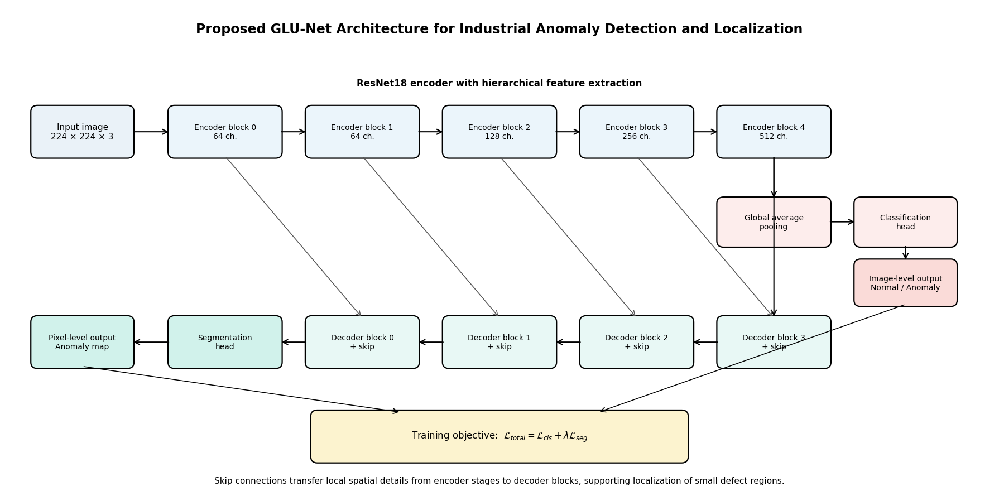

Saved:
/kaggle/working/visa_outputs/figure_4_glunet_architecture.png
/kaggle/working/visa_outputs/figure_4_glunet_architecture.pdf


In [104]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch
import os

output_dir = "/kaggle/working/visa_outputs"
os.makedirs(output_dir, exist_ok=True)

fig, ax = plt.subplots(figsize=(18, 9))
ax.set_xlim(0, 18)
ax.set_ylim(0, 9)
ax.axis("off")

def add_box(x, y, w, h, text, facecolor="#F2F5F7", fontsize=11):
    box = FancyBboxPatch(
        (x, y), w, h,
        boxstyle="round,pad=0.04,rounding_size=0.12",
        linewidth=1.6,
        edgecolor="black",
        facecolor=facecolor
    )
    ax.add_patch(box)
    ax.text(
        x + w / 2,
        y + h / 2,
        text,
        ha="center",
        va="center",
        fontsize=fontsize,
        wrap=True
    )

def add_arrow(x1, y1, x2, y2, style="->", lw=1.5, color="black"):
    arrow = FancyArrowPatch(
        (x1, y1),
        (x2, y2),
        arrowstyle=style,
        mutation_scale=16,
        linewidth=lw,
        color=color
    )
    ax.add_patch(arrow)

# Title
ax.text(
    9, 8.55,
    "Proposed GLU-Net Architecture for Industrial Anomaly Detection and Localization",
    ha="center",
    va="center",
    fontsize=17,
    fontweight="bold"
)

y_enc = 6.2
y_dec = 2.3
h = 0.9

# Input and encoder
add_box(0.5, y_enc, 1.8, h, "Input image\n224 × 224 × 3", "#EAF2F8", 11)
add_box(3.0, y_enc, 2.0, h, "Encoder block 0\n64 ch.", "#EBF5FB", 10)
add_box(5.5, y_enc, 2.0, h, "Encoder block 1\n64 ch.", "#EBF5FB", 10)
add_box(8.0, y_enc, 2.0, h, "Encoder block 2\n128 ch.", "#EBF5FB", 10)
add_box(10.5, y_enc, 2.0, h, "Encoder block 3\n256 ch.", "#EBF5FB", 10)
add_box(13.0, y_enc, 2.0, h, "Encoder block 4\n512 ch.", "#EBF5FB", 10)

ax.text(
    9, 7.55,
    "ResNet18 encoder with hierarchical feature extraction",
    ha="center",
    va="center",
    fontsize=12,
    fontweight="bold"
)

# Encoder flow
add_arrow(2.3, y_enc + h/2, 3.0, y_enc + h/2)
add_arrow(5.0, y_enc + h/2, 5.5, y_enc + h/2)
add_arrow(7.5, y_enc + h/2, 8.0, y_enc + h/2)
add_arrow(10.0, y_enc + h/2, 10.5, y_enc + h/2)
add_arrow(12.5, y_enc + h/2, 13.0, y_enc + h/2)

# Classification branch
add_box(13.0, 4.55, 2.0, 0.85, "Global average\npooling", "#FDEDEC", 10)
add_box(15.5, 4.55, 1.8, 0.85, "Classification\nhead", "#FDEDEC", 10)
add_box(15.5, 3.45, 1.8, 0.8, "Image-level output\nNormal / Anomaly", "#FADBD8", 10)

add_arrow(14.0, y_enc, 14.0, 5.4)
add_arrow(15.0, 4.98, 15.5, 4.98)
add_arrow(16.4, 4.55, 16.4, 4.25)

# Decoder path
add_box(13.0, y_dec, 2.0, h, "Decoder block 3\n+ skip", "#E8F8F5", 10)
add_box(10.5, y_dec, 2.0, h, "Decoder block 2\n+ skip", "#E8F8F5", 10)
add_box(8.0, y_dec, 2.0, h, "Decoder block 1\n+ skip", "#E8F8F5", 10)
add_box(5.5, y_dec, 2.0, h, "Decoder block 0\n+ skip", "#E8F8F5", 10)
add_box(3.0, y_dec, 2.0, h, "Segmentation\nhead", "#D1F2EB", 10)
add_box(0.5, y_dec, 1.8, h, "Pixel-level output\nAnomaly map", "#D1F2EB", 10)

# Decoder flow
add_arrow(14.0, y_enc, 14.0, y_dec + h)
add_arrow(13.0, y_dec + h/2, 12.5, y_dec + h/2)
add_arrow(10.5, y_dec + h/2, 10.0, y_dec + h/2)
add_arrow(8.0, y_dec + h/2, 7.5, y_dec + h/2)
add_arrow(5.5, y_dec + h/2, 5.0, y_dec + h/2)
add_arrow(3.0, y_dec + h/2, 2.3, y_dec + h/2)

# Skip connections
skip_color = "#555555"
add_arrow(11.5, y_enc, 14.0, y_dec + h, style="->", lw=1.1, color=skip_color)
add_arrow(9.0, y_enc, 11.5, y_dec + h, style="->", lw=1.1, color=skip_color)
add_arrow(6.5, y_enc, 9.0, y_dec + h, style="->", lw=1.1, color=skip_color)
add_arrow(4.0, y_enc, 6.5, y_dec + h, style="->", lw=1.1, color=skip_color)

# Loss box
add_box(
    5.6, 0.55, 6.8, 0.9,
    r"Training objective:  $\mathcal{L}_{total}=\mathcal{L}_{cls}+\lambda \mathcal{L}_{seg}$",
    "#FCF3CF",
    12
)

# Arrows from outputs to loss
add_arrow(16.4, 3.45, 10.8, 1.45, lw=1.1)
add_arrow(1.4, y_dec, 7.2, 1.45, lw=1.1)

ax.text(
    9,
    0.18,
    "Skip connections transfer local spatial details from encoder stages to decoder blocks, supporting localization of small defect regions.",
    ha="center",
    va="center",
    fontsize=11
)

plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_4_glunet_architecture.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    f"{output_dir}/figure_4_glunet_architecture.pdf",
    bbox_inches="tight"
)

plt.show()

print("Saved:")
print(f"{output_dir}/figure_4_glunet_architecture.png")
print(f"{output_dir}/figure_4_glunet_architecture.pdf")

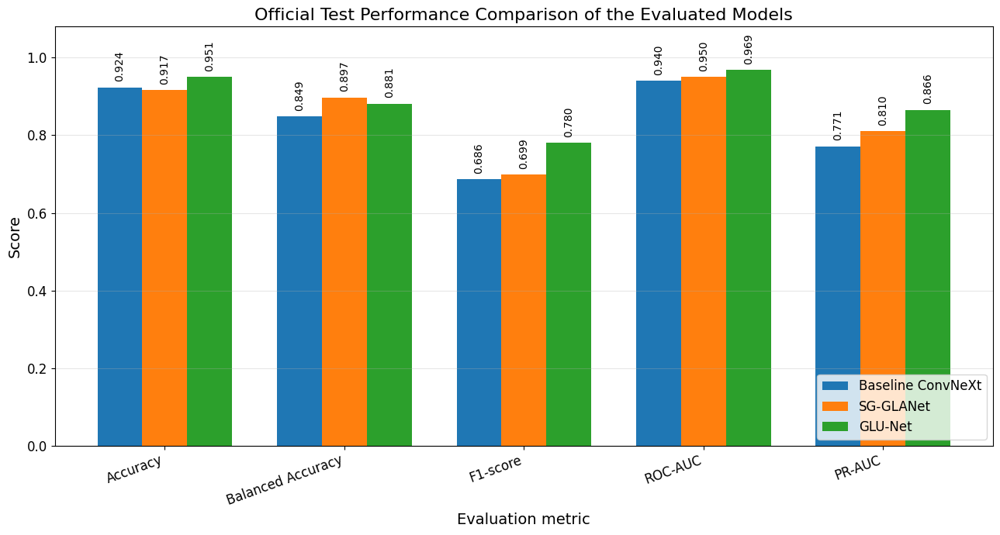

In [105]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

output_dir = "/kaggle/working/visa_outputs"

official_table_path = f"{output_dir}/table_5_official_test_final_comparison.csv"
official_test_paper_table = pd.read_csv(official_table_path)

# Daha kısa model adları
plot_df = official_test_paper_table.copy()
plot_df["Model"] = plot_df["Experiment"].replace({
    "glunet_resnet18_lambda05_e10": "GLU-Net",
    "sgglanet_convnext_lambda025_e5": "SG-GLANet",
    "baseline_convnext_tiny": "Baseline ConvNeXt"
})

plot_df = plot_df.set_index("Model").loc[
    ["Baseline ConvNeXt", "SG-GLANet", "GLU-Net"]
].reset_index()

metrics = ["Accuracy", "Balanced Accuracy", "F1-score", "ROC-AUC", "PR-AUC"]

x = np.arange(len(metrics))
width = 0.25

plt.figure(figsize=(13, 7))

for i, model_name in enumerate(plot_df["Model"]):
    values = plot_df.loc[plot_df["Model"] == model_name, metrics].values.flatten()
    bars = plt.bar(
        x + (i - 1) * width,
        values,
        width,
        label=model_name
    )
    
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            height + 0.015,
            f"{height:.3f}",
            ha="center",
            va="bottom",
            fontsize=10,
            rotation=90
        )

plt.xticks(x, metrics, rotation=20, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel("Score", fontsize=14)
plt.xlabel("Evaluation metric", fontsize=14)
plt.title("Official Test Performance Comparison of the Evaluated Models", fontsize=16)
plt.ylim(0, 1.08)
plt.legend(fontsize=12, loc="lower right")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_official_test_metric_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    f"{output_dir}/figure_official_test_metric_comparison.pdf",
    bbox_inches="tight"
)

plt.show()

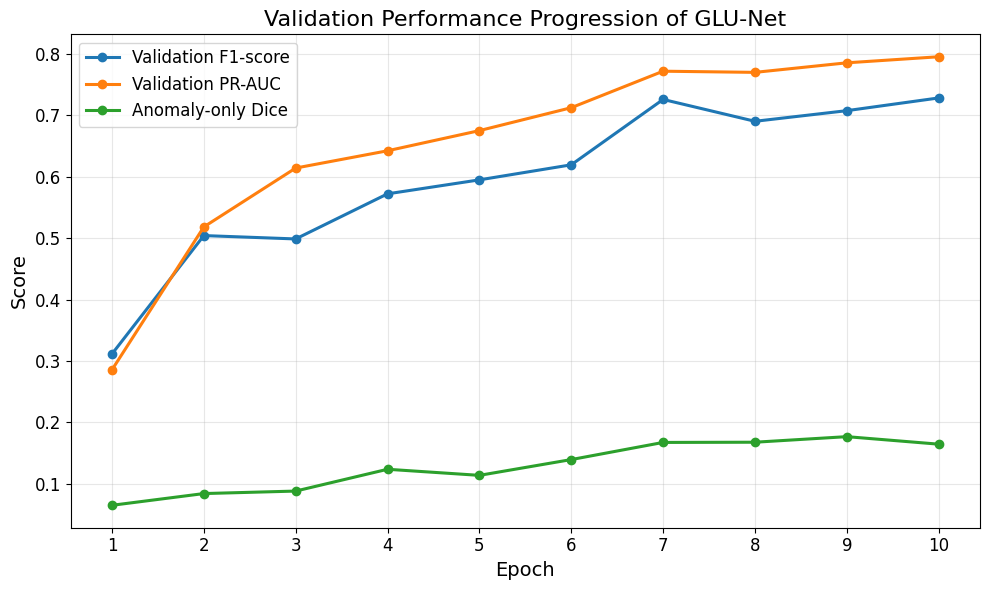

,epoch,val_accuracy,val_balanced_accuracy,val_precision,val_recall,val_f1,val_roc_auc,val_pr_auc,val_pixel_iou_anomaly_only,val_pixel_dice_anomaly_only
0,1,0.734411,0.650054,0.218487,0.541667,0.311377,0.747790,0.285545,0.038670,0.064756
1,2,0.865281,0.757080,0.425837,0.618056,0.504249,0.843561,0.518360,0.051927,0.083875
2,3,0.843726,0.781430,0.386973,0.701389,0.498765,0.869496,0.614284,0.054641,0.087936
3,4,0.888376,0.794381,0.497436,0.673611,0.572271,0.901810,0.642434,0.082564,0.123453
4,5,0.886836,0.826948,0.493151,0.750000,0.595041,0.906695,0.675287,0.074107,0.113540
5,6,0.892225,0.848214,0.508929,0.791667,0.619565,0.921780,0.712629,0.093592,0.139259
6,7,0.936105,0.860732,0.691824,0.763889,0.726073,0.920328,0.772100,0.111841,0.167189
7,8,0.919938,0.869877,0.604167,0.805556,0.690476,0.934292,0.770200,0.110167,0.167537
8,9,0.930716,0.854663,0.664634,0.756944,0.707792,0.938555,0.785760,0.119237,0.176609
9,10,0.939184,0.850307,0.721088,0.736111,0.728522,0.940906,0.795627,0.109305,0.164358


In [106]:
import pandas as pd
import matplotlib.pyplot as plt
import os

output_dir = "/kaggle/working/visa_outputs"

history_path = f"{output_dir}/glunet_resnet18_lambda05_e10_history.csv"
glunet_history = pd.read_csv(history_path)

plt.figure(figsize=(10, 6))

plt.plot(
    glunet_history["epoch"],
    glunet_history["val_f1"],
    marker="o",
    linewidth=2.2,
    label="Validation F1-score"
)

plt.plot(
    glunet_history["epoch"],
    glunet_history["val_pr_auc"],
    marker="o",
    linewidth=2.2,
    label="Validation PR-AUC"
)

plt.plot(
    glunet_history["epoch"],
    glunet_history["val_pixel_dice_anomaly_only"],
    marker="o",
    linewidth=2.2,
    label="Anomaly-only Dice"
)

plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Score", fontsize=14)
plt.title("Validation Performance Progression of GLU-Net", fontsize=16)
plt.xticks(glunet_history["epoch"], fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

plt.savefig(
    f"{output_dir}/figure_glunet_training_progression.png",
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    f"{output_dir}/figure_glunet_training_progression.pdf",
    bbox_inches="tight"
)

plt.show()

glunet_history[
    [
        "epoch",
        "val_accuracy",
        "val_balanced_accuracy",
        "val_precision",
        "val_recall",
        "val_f1",
        "val_roc_auc",
        "val_pr_auc",
        "val_pixel_iou_anomaly_only",
        "val_pixel_dice_anomaly_only"
    ]
]